In [2]:
# Load the SavedModel
import tensorflow as tf

model = tf.keras.models.load_model('./model8k_v4_org_sabah')

2023-06-21 18:37:49.565568: I tensorflow/core/util/port.cc:110] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2023-06-21 18:37:49.611096: I tensorflow/tsl/cuda/cudart_stub.cc:28] Could not find cuda drivers on your machine, GPU will not be used.
2023-06-21 18:37:49.819157: I tensorflow/tsl/cuda/cudart_stub.cc:28] Could not find cuda drivers on your machine, GPU will not be used.
2023-06-21 18:37:49.820041: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F AVX512_VNNI FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-06-21 18:37:50.780351: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Co

In [ ]:
""""
model = models.Sequential(
    [
        layers.Conv1D(512, 3, activation="relu", input_shape=(X_train.shape[1], X_train.shape[2])),
        layers.MaxPooling1D(2),
        layers.Conv1D(64, 3, activation="relu"),
        layers.MaxPooling1D(2),
        layers.Conv1D(32, 3, activation="relu"),
        layers.Dropout(0.2),
        layers.MaxPooling1D(2),
        layers.Conv1D(8, 3, activation="relu"),
        layers.MaxPooling1D(2),
        layers.Flatten(),
        # model.add(LSTM(64)),
        layers.Dense(8, activation="relu"),
        layers.Dense(1, activation="sigmoid"),
    ]
)
model.compile(optimizer="adam", loss="binary_crossentropy", metrics=["accuracy"])
"""

model.summary()

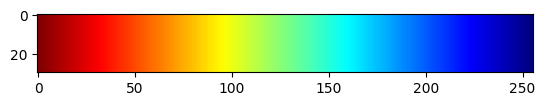

In [5]:
import cv2
import matplotlib.pyplot as plt

color_img = cv2.imread('colorscale_jet.jpg')
colors = []
for i in range(0,len(color_img[15]), 5):
  colors.append(color_img[15][i])

plt.imshow(color_img)

In [53]:
import cv2
# from google.colab.patches import cv2_imshow

def overlay_image(pred, pred_list, divide_number = 40):

    image = cv2.imread('trace_image.png')
    overlay = image.copy()

    # image sizes
    # print(overlay.shape)

    # Rectangle parameters
    x, y, w, h = 80, 60, 680, 150

    rect_with_offset = w // divide_number

    for i in range(divide_number):
        color_index = (100 - int(pred_list[i] * 100))
        # color_index = color_index
        if pred < 0.49:
            color_index = 100 - color_index

        # print(color_index)
        b, g, r = colors[color_index // 2]
        overlay = cv2.rectangle(overlay, (x + i * rect_with_offset, y), (x + (i + 1) * rect_with_offset, y + h), (int(b), int(g), int(r)), -1)

    # A filled rectangle
    # cv2.rectangle(overlay, (x, y), (x+w, y+h), (0, 200, 0), -1)

    alpha = 0.5  # Transparency factor.
    # Following line overlays transparent rectangle
    # over the image
    image_new = cv2.addWeighted(overlay, alpha, image, 1 - alpha, 0)

    cv2.imwrite("attention_signal.jpg", image_new)


    # concatenate both images
    image_new = cv2.vconcat([image, image_new])

    # cv2.imshow('Image', image_new)
    # cv2.waitKey(0)

    import matplotlib.pyplot as plt
    size = (10, 10)
    fig, ax = plt.subplots(figsize=size, )
    ax.imshow(image_new)
    plt.show()

    # cv2.destroyAllWindows()


In [54]:
from obspy import read, Trace
import numpy as np


def colorize(path, divide_number = 40, size_of_length_signal = 8000):

    trace = read(path)[0]
    # print(f" 1 {trace.data.shape}")
    # trace.plot()

    avg_num = np.average(trace.data)
    avg = np.zeros(size_of_length_signal // divide_number) + avg_num

    tmp = Trace(data = avg)
    # tmp.plot()

    predict_data = trace.data.reshape((1, len(trace.data), 1))

    t_pred = model.predict(predict_data)
    # for y_val in t_pred:
    #   print( "%.5f" % float(y_val), end = ", ")

    pred_list = []

    for i in range(divide_number):
        start_index = i * (len(predict_data[0]) // divide_number)
        end_index = (i + 1) * (len(predict_data[0]) // divide_number)

        # Protect the original data by making a copy
        original_data = predict_data.copy()

        # Replace the section of predict_data with yummydata
        for index in range(len(avg)):
            predict_data[0][index + start_index] = avg[index]
            # predict_data[0][start_index:end_index] = yummydata[:]

        d = np.array([])
        for index in range(len(trace.data)):
            # d.insert(predict_data[0][index][0])
            d = np.append(d, predict_data[0][index][0])

        d.reshape((1, size_of_length_signal))
        pl = Trace(data = d)
        # pl.plot()

        # # Perform the prediction on the modified predict_data
        y_pred = model.predict(predict_data)
        for y_val in y_pred[0]:
            # print("%.5f" % float(y_val), end=", ")
            pred_list.append(float(y_val))

        # # Restore the original data
        predict_data = original_data.copy()


    trace = Trace(data = predict_data[0].flatten())
    # trace.plot()
    trace.plot(outfile='trace_image.png')

    overlay_image(t_pred, pred_list, divide_number)
    
    return trace, t_pred, pred_list




In [61]:
import os


dataset = 'dataset8k_v4'

original_class_folder = "class6/original/"
original_trace_file_list = []

for trace_file in os.listdir(os.path.join(dataset, original_class_folder)):
    original_trace_file_list.append(trace_file)

for trace_file in original_trace_file_list:
    print(f"original {trace_file}")

original 201910_6_29__GEDZ.BHZ.KO_original.sac
original 202201_0_76__SERH.BHZ.KO_original.sac
original 202004_13_94__ARMT.BHZ.KO_original.sac
original 202002_17_27__GEDZ.BHZ.KO_original.sac
original 201909_0_68__ARMT.BHZ.KO_original.sac
original 201906_15_0__SIMA.BHZ.KO_original.sac
original 202006_4_5__SIMA.BHZ.KO_original.sac
original 202005_9_0__BALB.BHZ.KO_original.sac
original 202009_10_79__KO.SIMA..BHZ.D.2020.255.203759.SAC_original.sac
original 202004_7_28__GEDZ.BHZ.KO_original.sac
original 202104_1_58__TVSB.BHZ.KO_original.sac
original 201901_10_46__GEDZ.BHZ.KO_original.sac
original 202105_1_86__MDNY.BHZ.KO_original.sac
original 201910_18_154__KAVV.BHZ.KO_original.sac
original 202104_13_0__SIMA.BHZ.KO_original.sac
original 202004_19_2__SIMA.BHZ.KO_original.sac
original 202005_9_76__SRCK.BHZ.KO_original.sac
original 201910_18_60__SLVT.BHZ.KO_original.sac
original 202001_1_0__SIMA.BHZ.KO_original.sac
original 202012_11_1__SIMA.BHZ.KO_original.sac
original 201911_15_33__GEDZ.BHZ.K

dataset8k_v4/class6/original/201910_6_29__GEDZ.BHZ.KO_original.sac
1/1 [==============================] - 0s 20ms/step


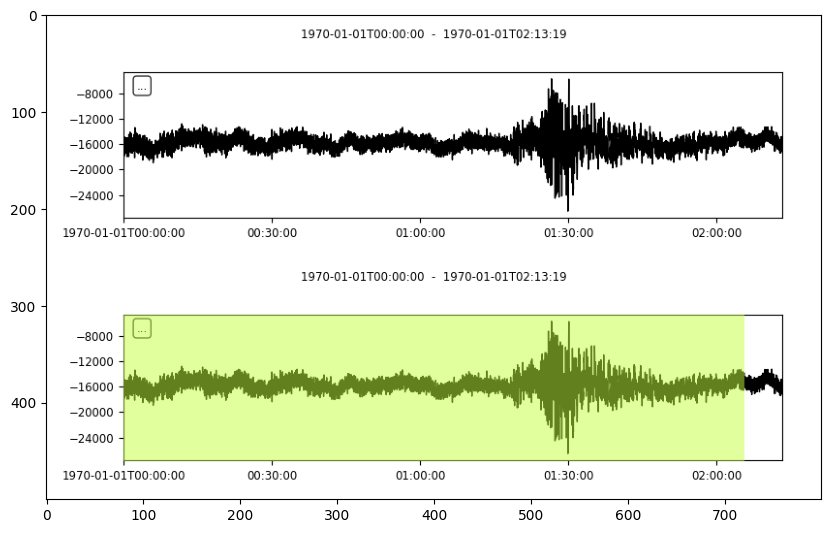

dataset8k_v4/class6/original/202201_0_76__SERH.BHZ.KO_original.sac
1/1 [==============================] - 0s 20ms/step


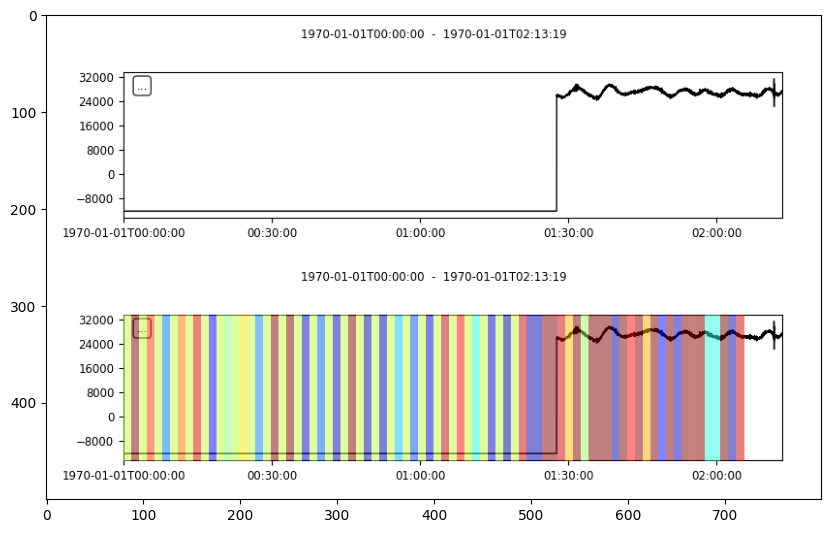

dataset8k_v4/class6/original/202004_13_94__ARMT.BHZ.KO_original.sac
1/1 [==============================] - 0s 20ms/step


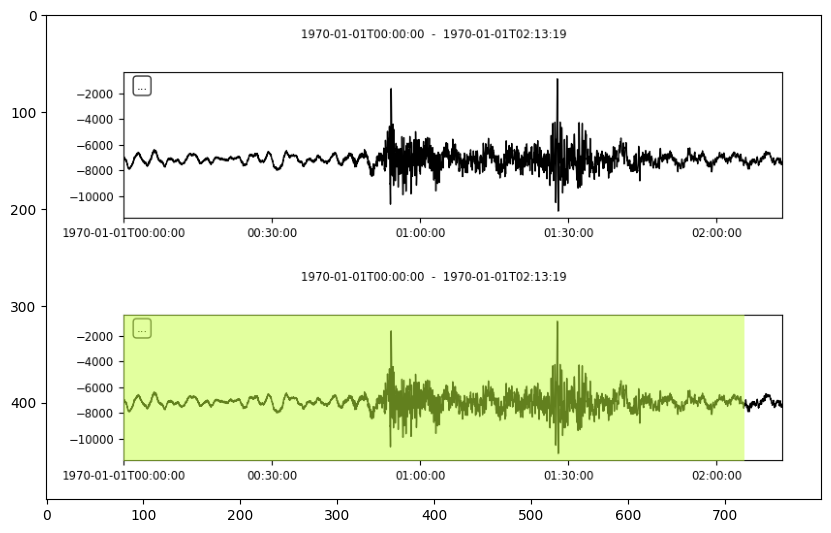

dataset8k_v4/class6/original/202002_17_27__GEDZ.BHZ.KO_original.sac
1/1 [==============================] - 0s 20ms/step


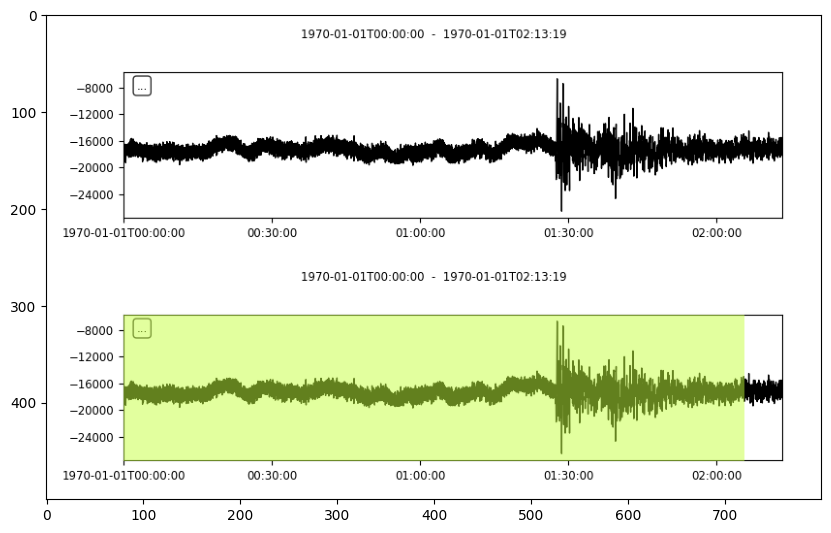

dataset8k_v4/class6/original/201909_0_68__ARMT.BHZ.KO_original.sac
1/1 [==============================] - 0s 20ms/step


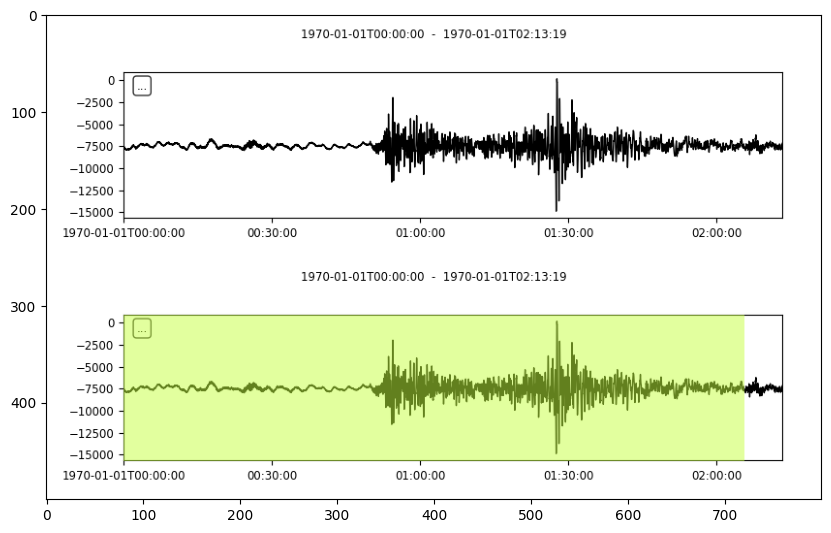

dataset8k_v4/class6/original/201906_15_0__SIMA.BHZ.KO_original.sac
1/1 [==============================] - 0s 20ms/step


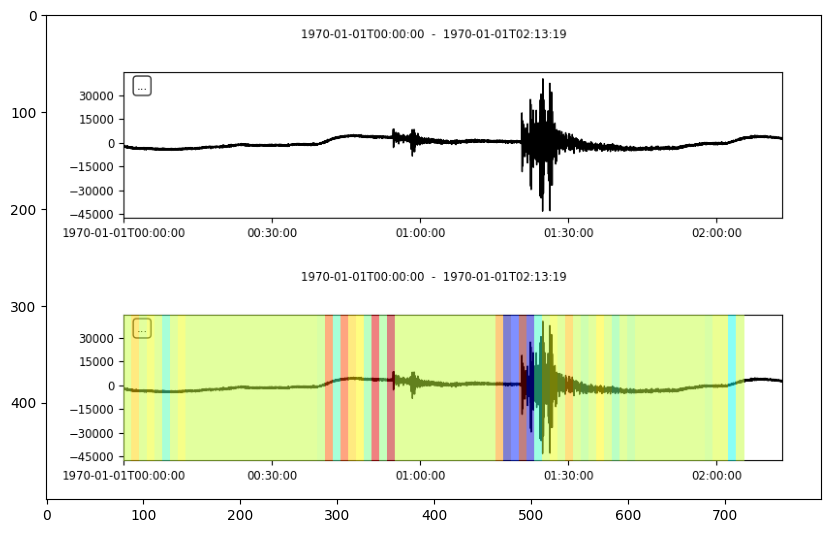

dataset8k_v4/class6/original/202006_4_5__SIMA.BHZ.KO_original.sac
1/1 [==============================] - 0s 20ms/step


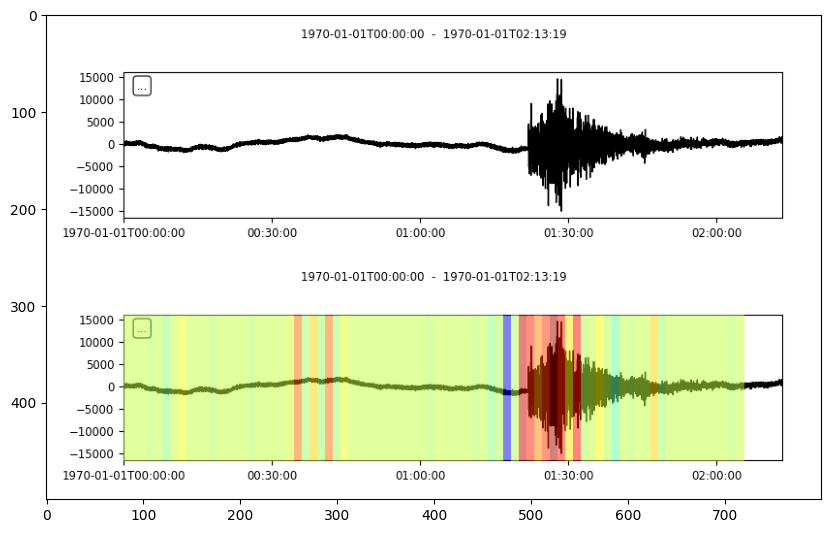

dataset8k_v4/class6/original/202005_9_0__BALB.BHZ.KO_original.sac
1/1 [==============================] - 0s 21ms/step


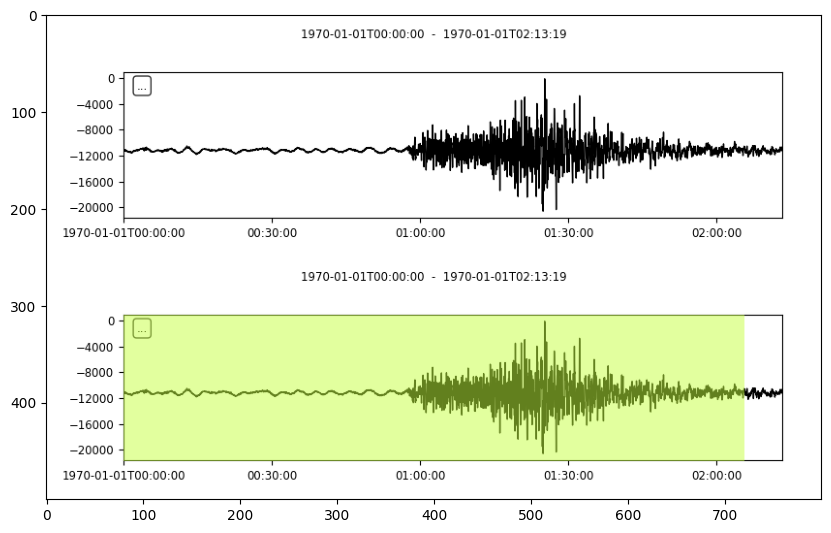

dataset8k_v4/class6/original/202009_10_79__KO.SIMA..BHZ.D.2020.255.203759.SAC_original.sac
1/1 [==============================] - 0s 19ms/step


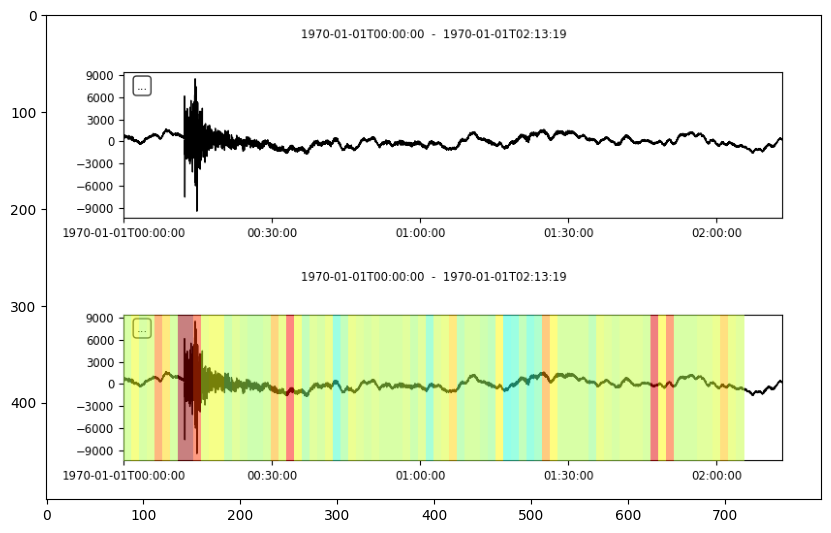

dataset8k_v4/class6/original/202004_7_28__GEDZ.BHZ.KO_original.sac
1/1 [==============================] - 0s 19ms/step


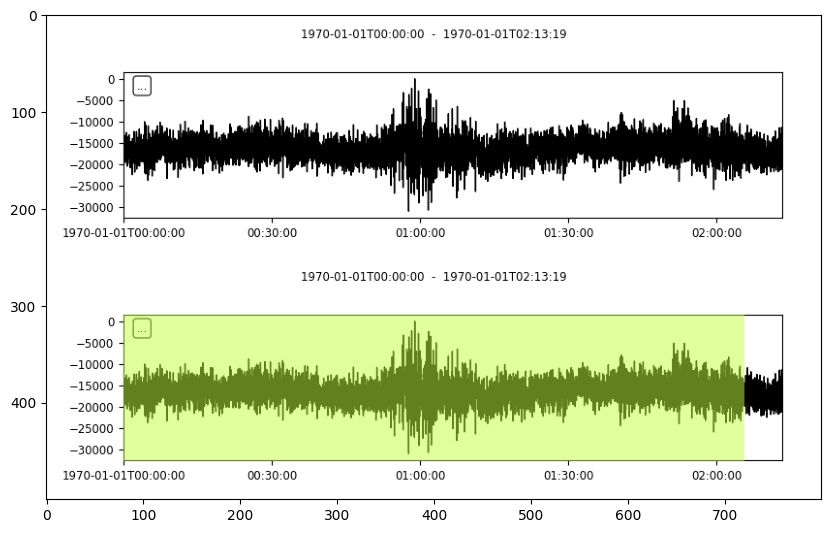

dataset8k_v4/class6/original/202104_1_58__TVSB.BHZ.KO_original.sac
1/1 [==============================] - 0s 20ms/step


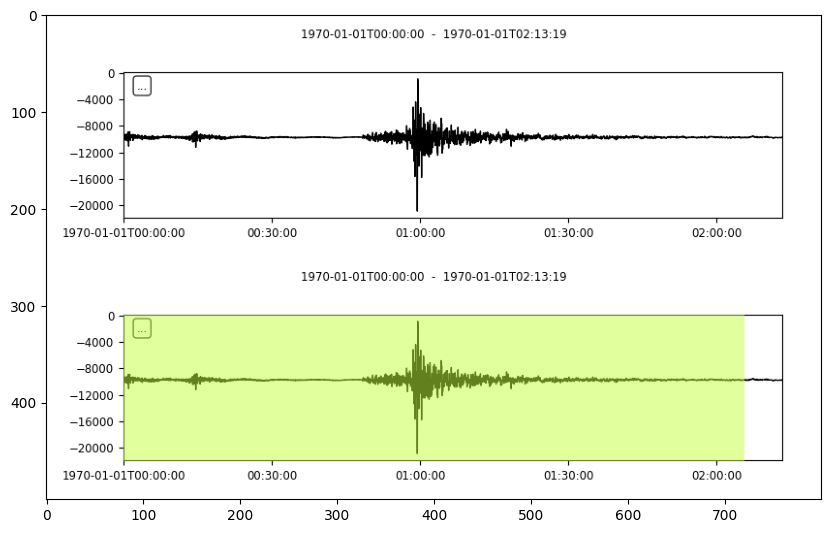

dataset8k_v4/class6/original/201901_10_46__GEDZ.BHZ.KO_original.sac
1/1 [==============================] - 0s 19ms/step


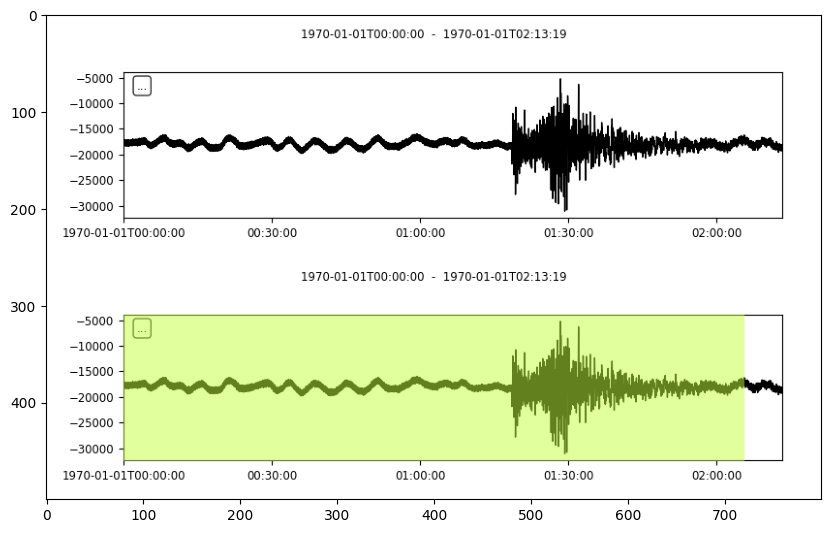

dataset8k_v4/class6/original/202105_1_86__MDNY.BHZ.KO_original.sac
1/1 [==============================] - 0s 25ms/step


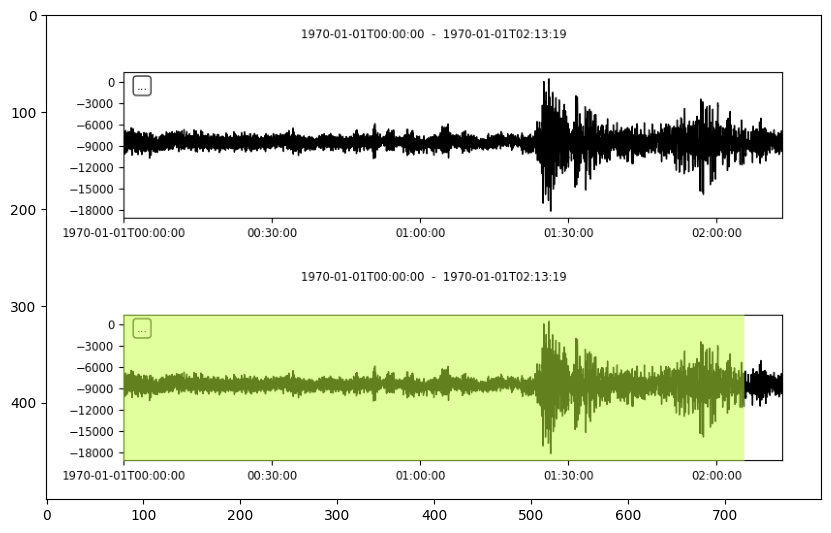

dataset8k_v4/class6/original/201910_18_154__KAVV.BHZ.KO_original.sac
1/1 [==============================] - 0s 21ms/step


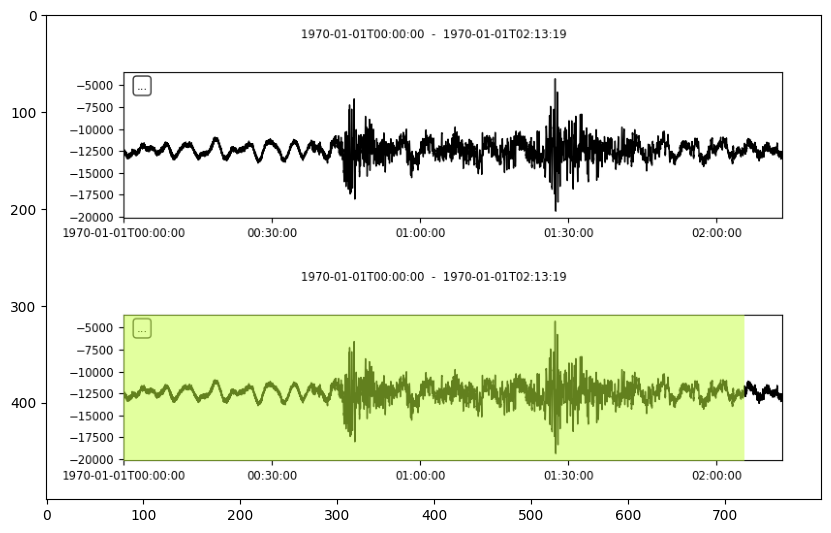

dataset8k_v4/class6/original/202104_13_0__SIMA.BHZ.KO_original.sac
1/1 [==============================] - 0s 20ms/step


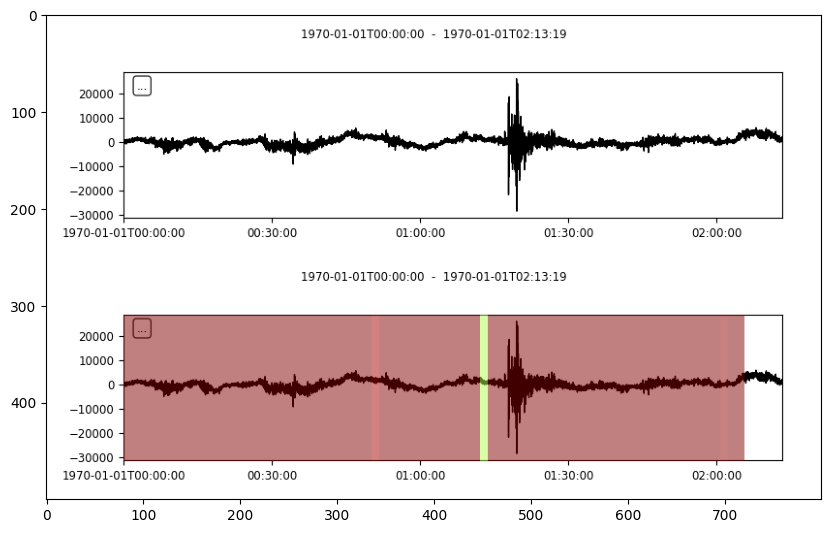

dataset8k_v4/class6/original/202004_19_2__SIMA.BHZ.KO_original.sac
1/1 [==============================] - 0s 21ms/step


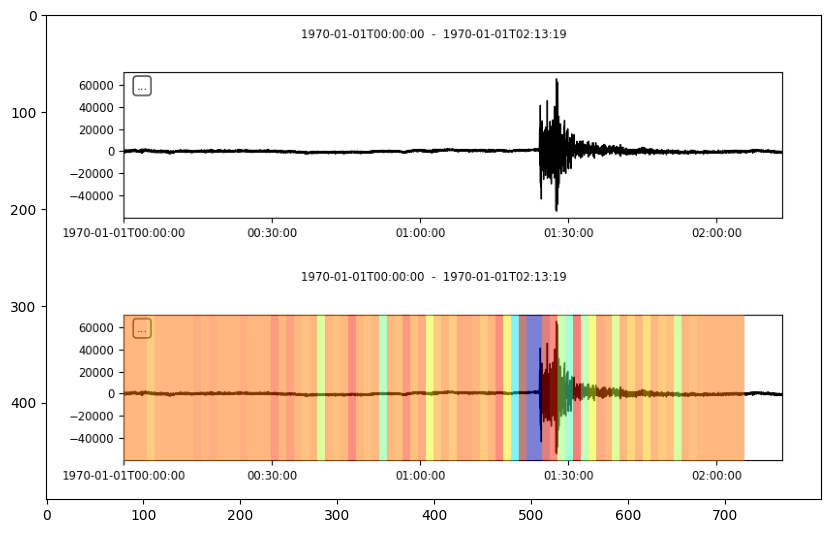

dataset8k_v4/class6/original/202005_9_76__SRCK.BHZ.KO_original.sac
1/1 [==============================] - 0s 21ms/step


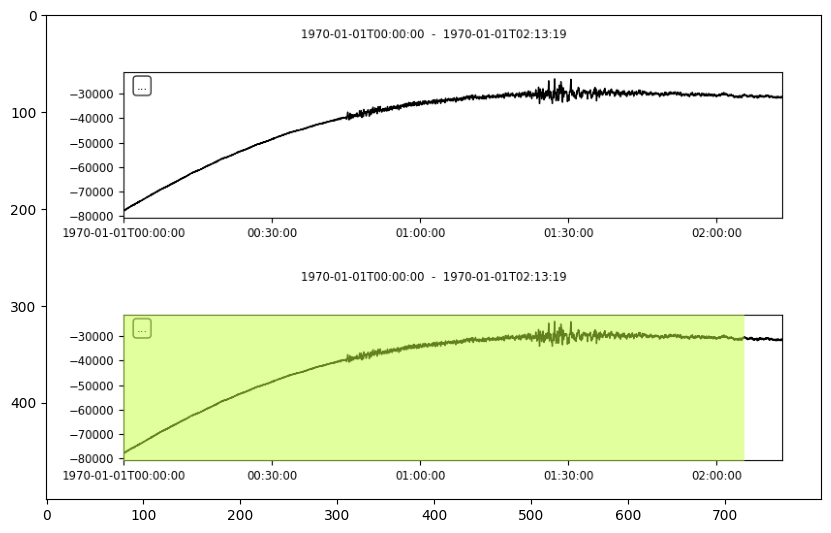

dataset8k_v4/class6/original/201910_18_60__SLVT.BHZ.KO_original.sac
1/1 [==============================] - 0s 21ms/step


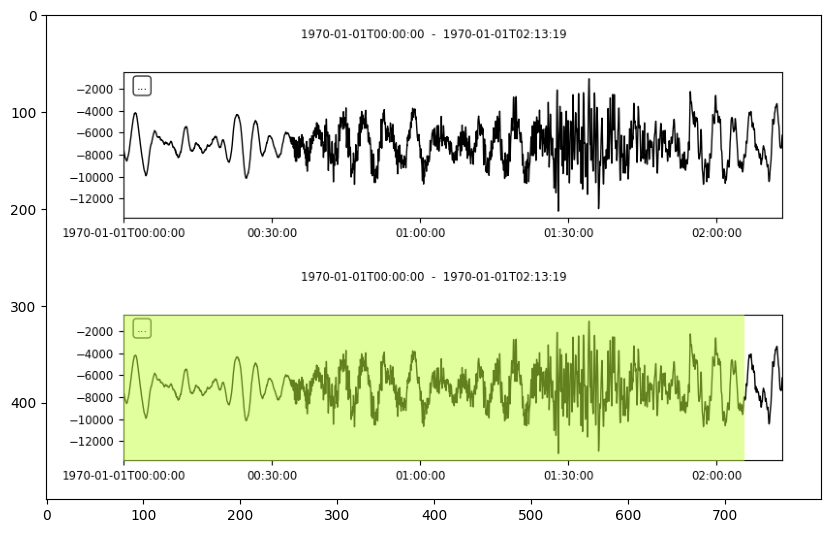

dataset8k_v4/class6/original/202001_1_0__SIMA.BHZ.KO_original.sac
1/1 [==============================] - 0s 19ms/step


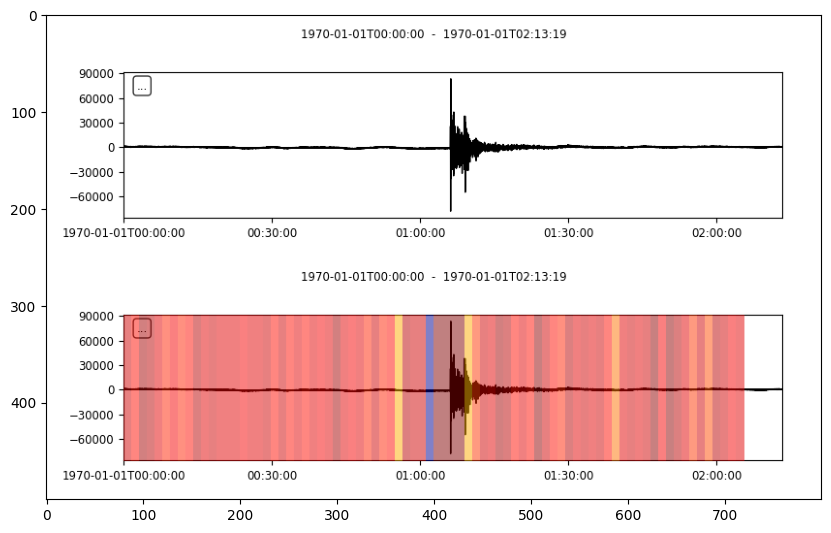

dataset8k_v4/class6/original/202012_11_1__SIMA.BHZ.KO_original.sac
1/1 [==============================] - 0s 20ms/step


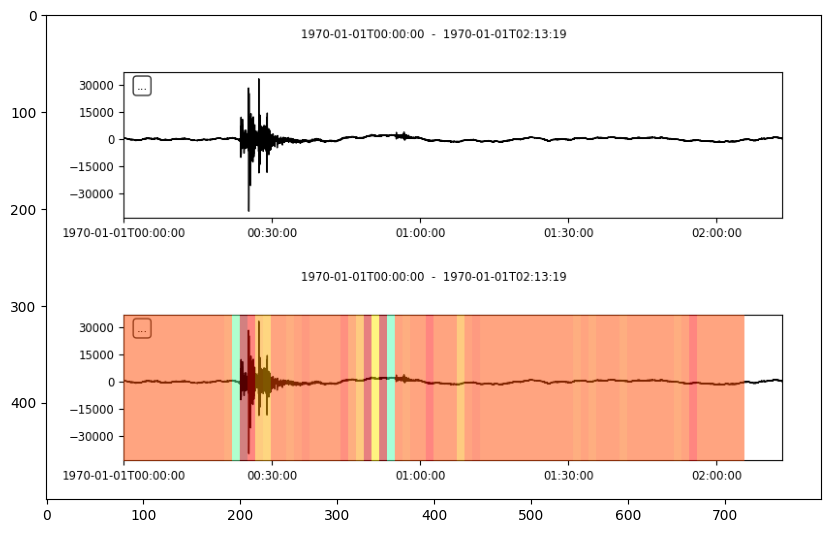

dataset8k_v4/class6/original/201911_15_33__GEDZ.BHZ.KO_original.sac
1/1 [==============================] - 0s 19ms/step


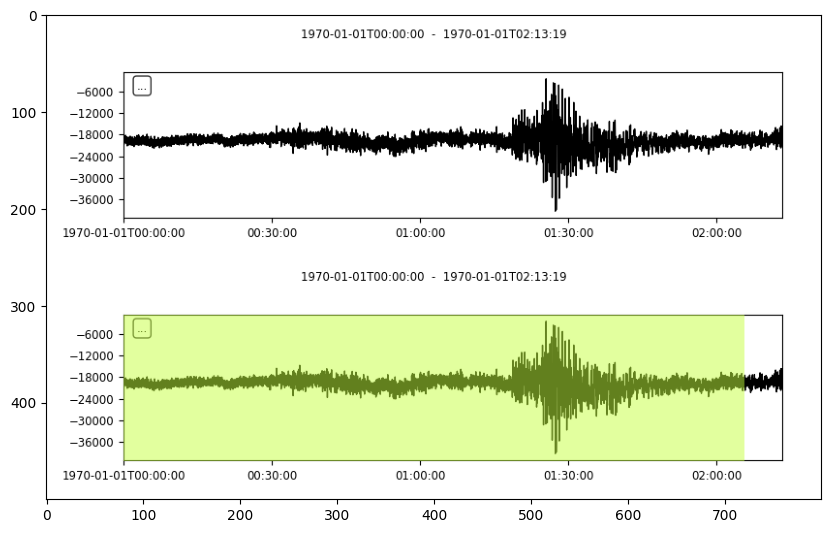

dataset8k_v4/class6/original/202004_13_127__MDNY.BHZ.KO_original.sac
1/1 [==============================] - 0s 24ms/step


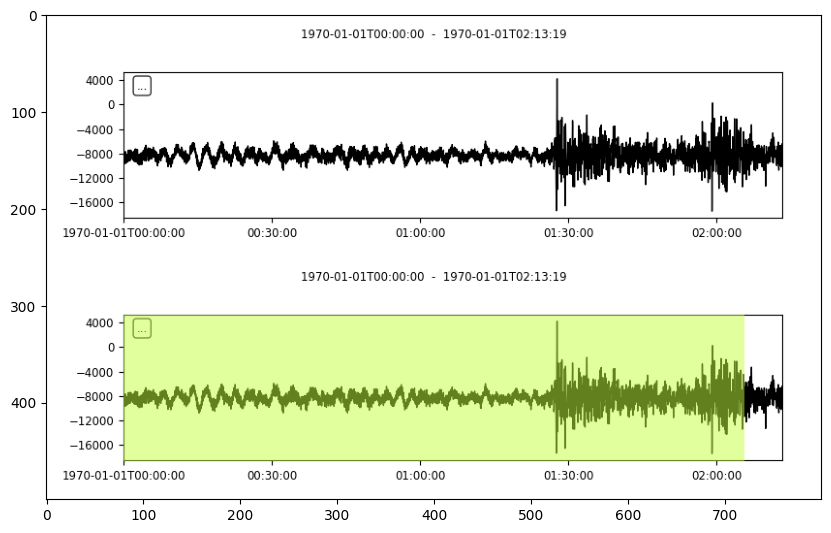

dataset8k_v4/class6/original/202010_39_87__GEDZ.BHZ.KO_original.sac
1/1 [==============================] - 0s 20ms/step


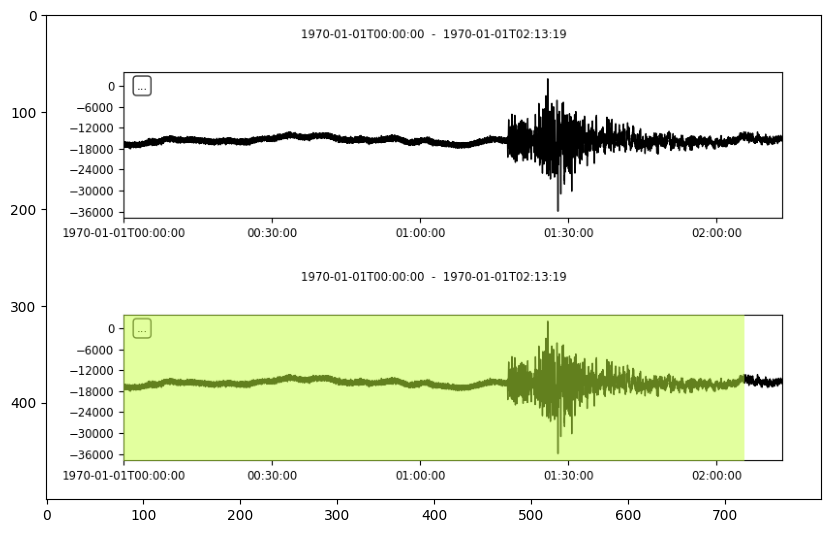

dataset8k_v4/class6/original/201907_18_38__GEDZ.BHZ.KO_original.sac
1/1 [==============================] - 0s 20ms/step


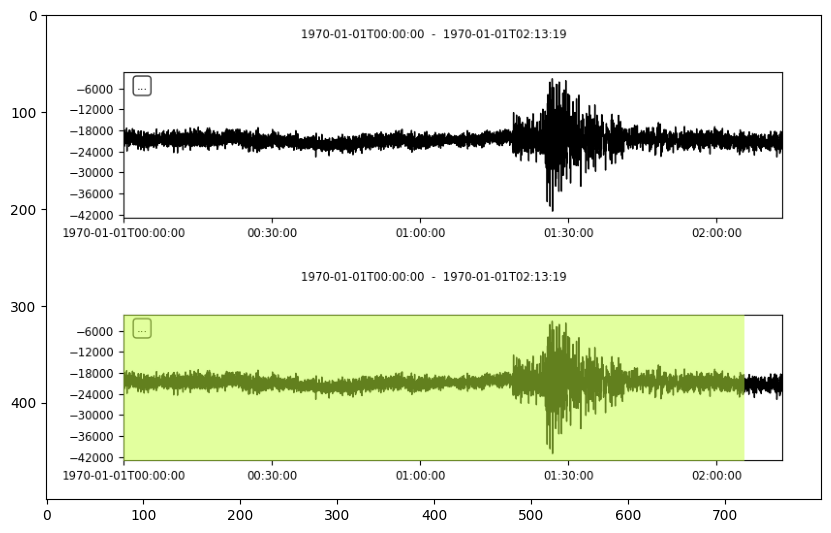

dataset8k_v4/class6/original/201909_0_103__GULT.BHZ.KO_original.sac
1/1 [==============================] - 0s 21ms/step


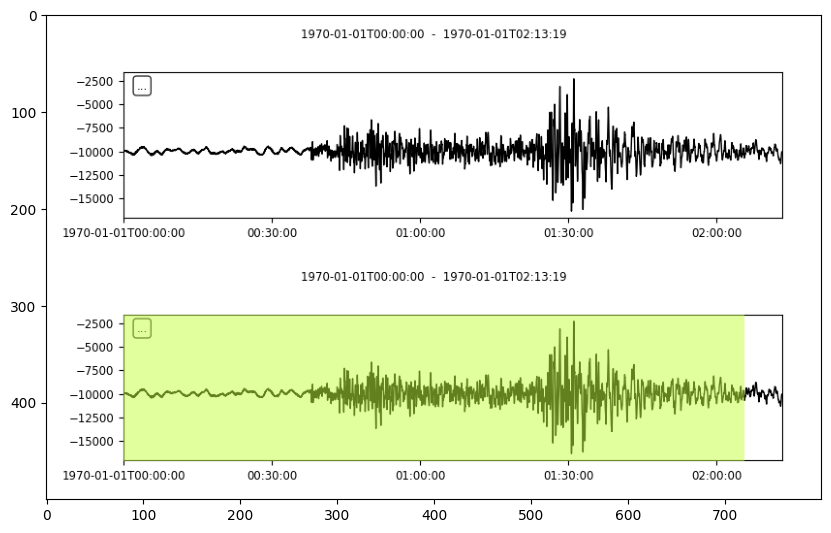

dataset8k_v4/class6/original/202010_36_147__GULT.BHZ.KO_original.sac
1/1 [==============================] - 0s 20ms/step


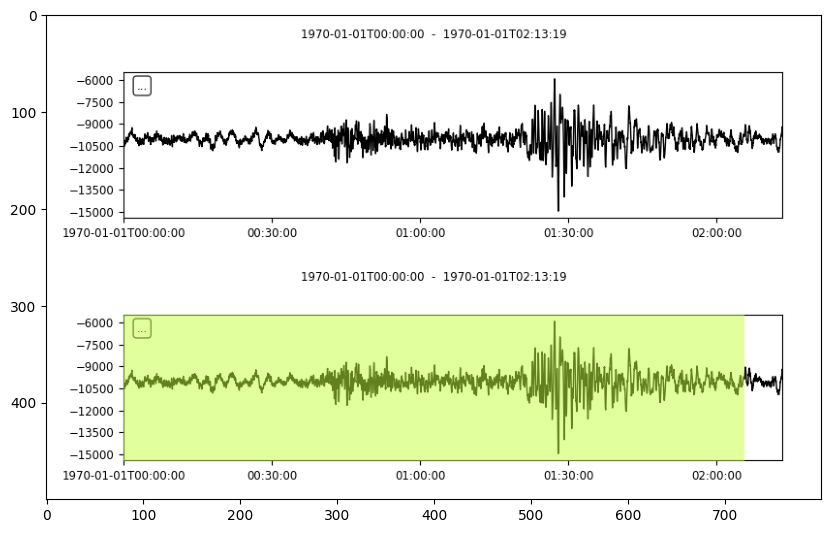

dataset8k_v4/class6/original/202005_18_55__GEDZ.BHZ.KO_original.sac
1/1 [==============================] - 0s 21ms/step


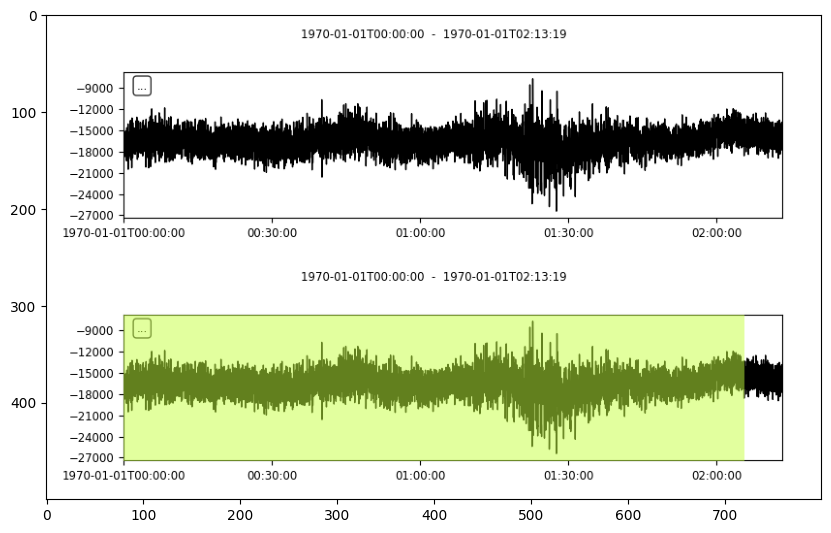

dataset8k_v4/class6/original/202002_22_21__GEDZ.BHZ.KO_original.sac
1/1 [==============================] - 0s 20ms/step


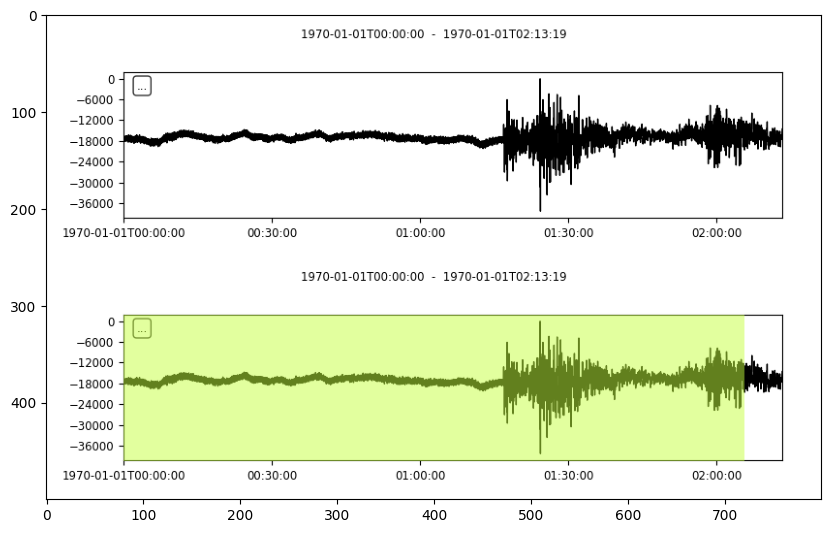

dataset8k_v4/class6/original/202201_8_190__MDNY.BHZ.KO_original.sac
1/1 [==============================] - 0s 21ms/step


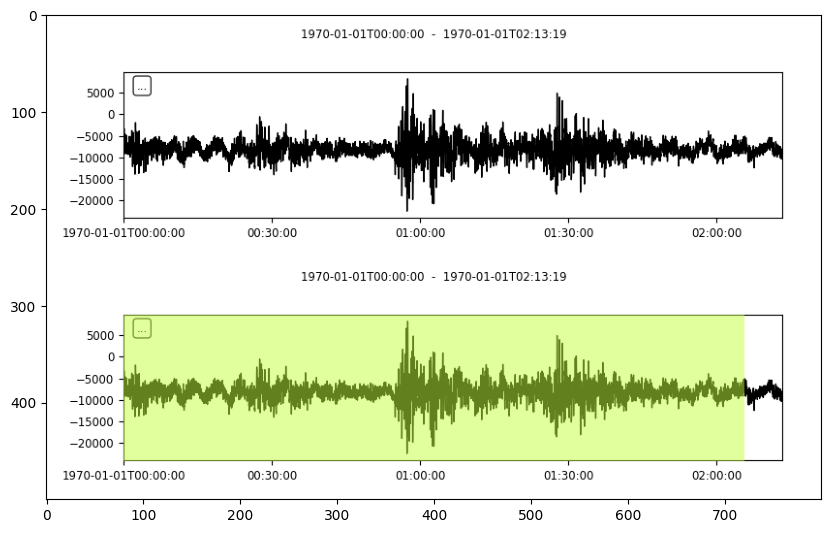

dataset8k_v4/class6/original/202210_17_41__GEDZ.BHZ.KO_original.sac
1/1 [==============================] - 0s 20ms/step


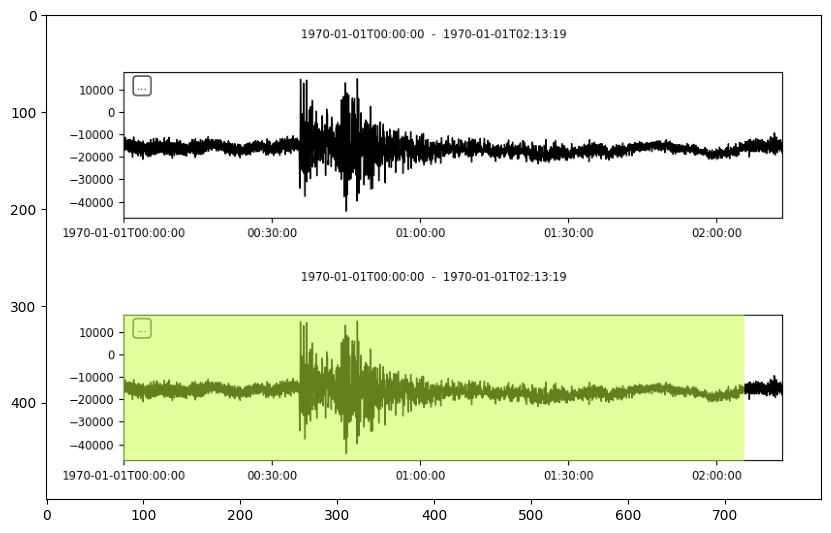

dataset8k_v4/class6/original/202205_15_59__TVSB.BHZ.KO_original.sac
1/1 [==============================] - 0s 23ms/step


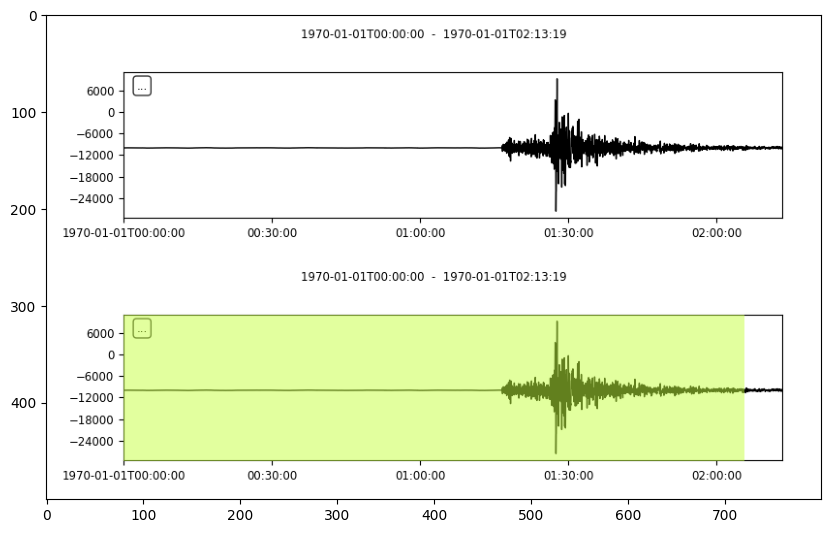

dataset8k_v4/class6/original/202008_10_87__ADVT.BHZ.KO_original.sac
1/1 [==============================] - 0s 20ms/step


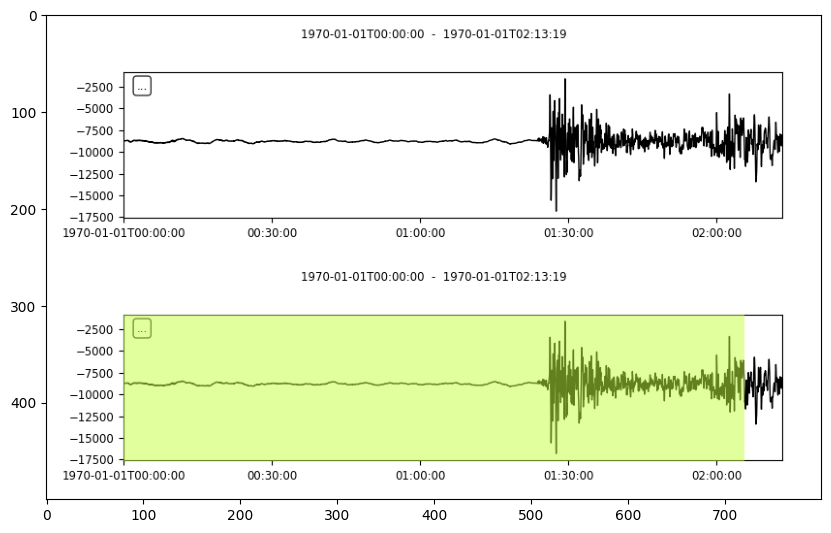

dataset8k_v4/class6/original/202002_2_0__SIMA.BHZ.KO_original.sac
1/1 [==============================] - 0s 20ms/step


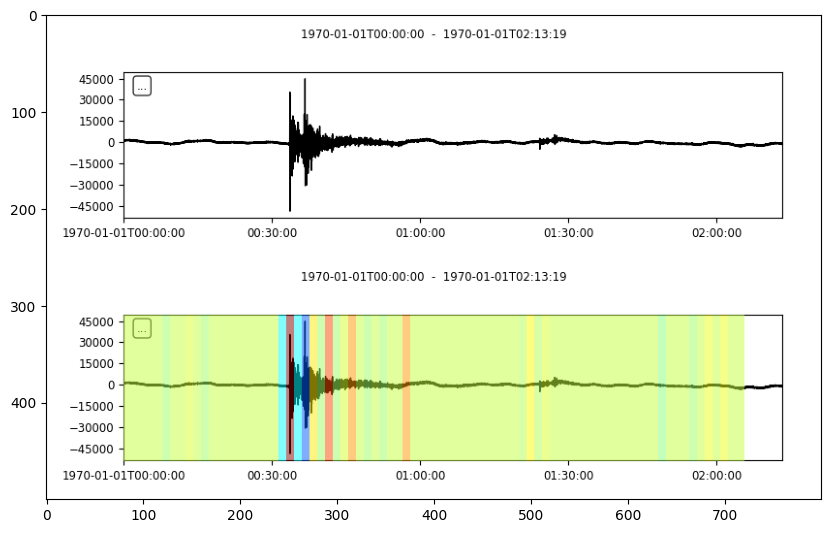

dataset8k_v4/class6/original/201907_8_0__SIMA.BHZ.KO_original.sac
1/1 [==============================] - 0s 21ms/step


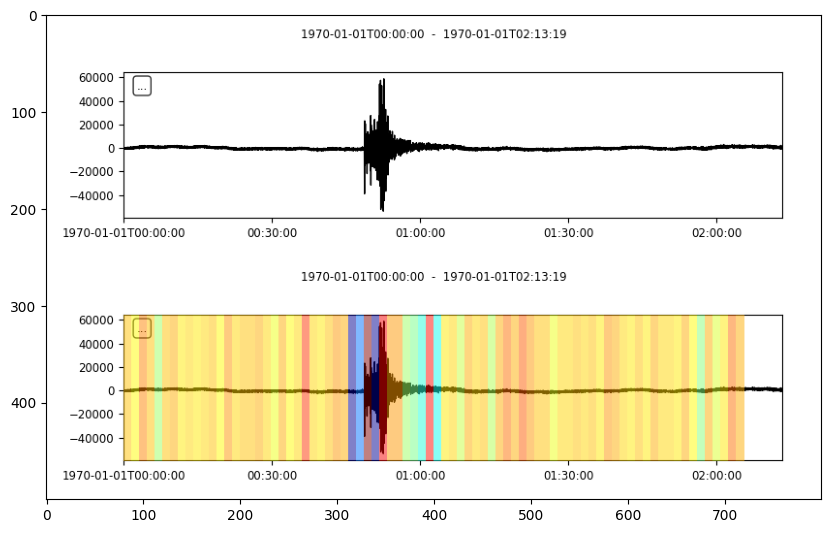

dataset8k_v4/class6/original/202002_14_0__SIMA.BHZ.KO_original.sac
1/1 [==============================] - 0s 20ms/step


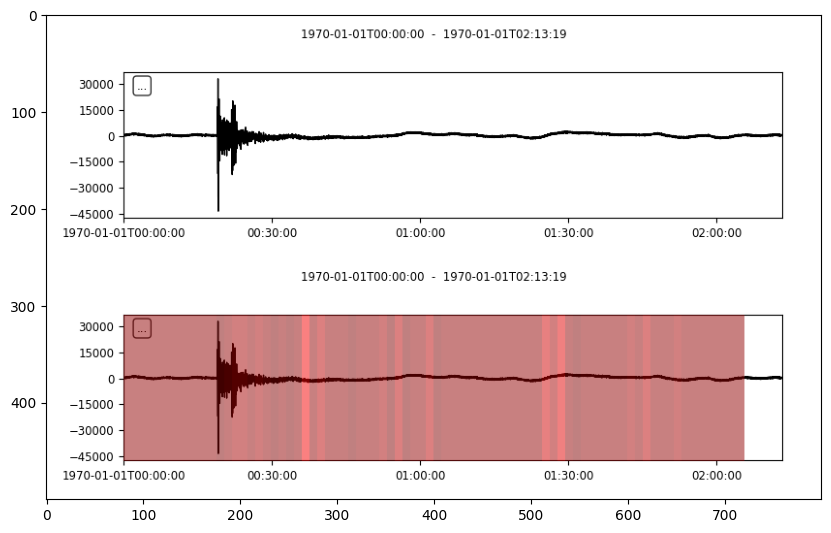

dataset8k_v4/class6/original/201909_0_89__MDNY.BHZ.KO_original.sac
1/1 [==============================] - 0s 20ms/step


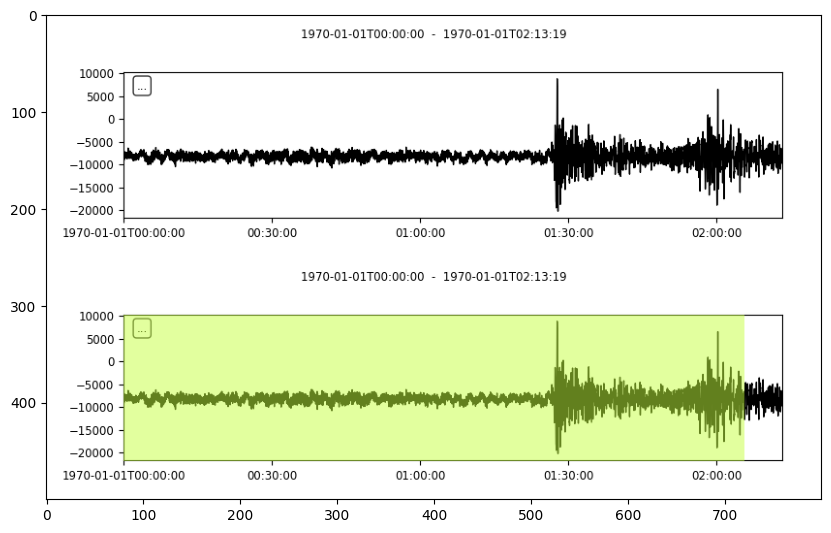

dataset8k_v4/class6/original/202105_13_3__SIMA.BHZ.KO_original.sac
1/1 [==============================] - 0s 21ms/step


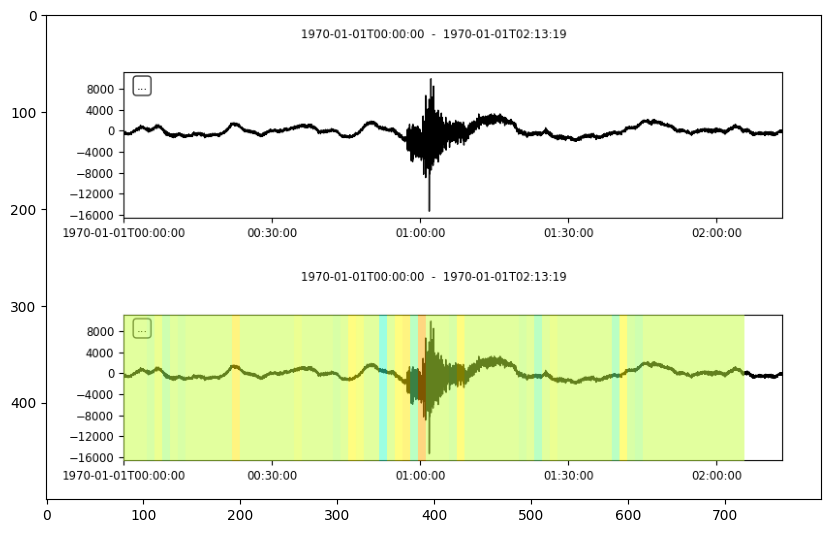

dataset8k_v4/class6/original/201911_25_74__GEDZ.BHZ.KO_original.sac
1/1 [==============================] - 0s 21ms/step


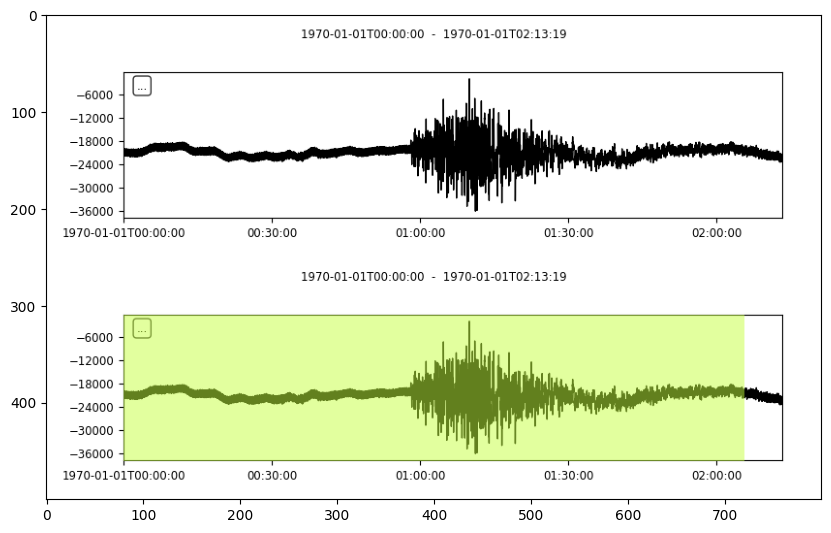

dataset8k_v4/class6/original/201905_0_21__GEDZ.BHZ.KO_original.sac
1/1 [==============================] - 0s 21ms/step


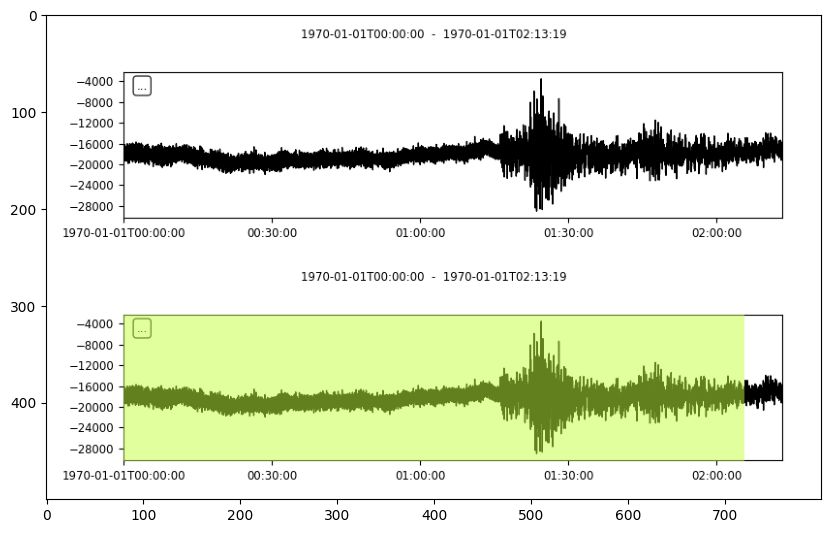

dataset8k_v4/class6/original/202103_9_145__EDC.BHZ.KO_original.sac
1/1 [==============================] - 0s 21ms/step


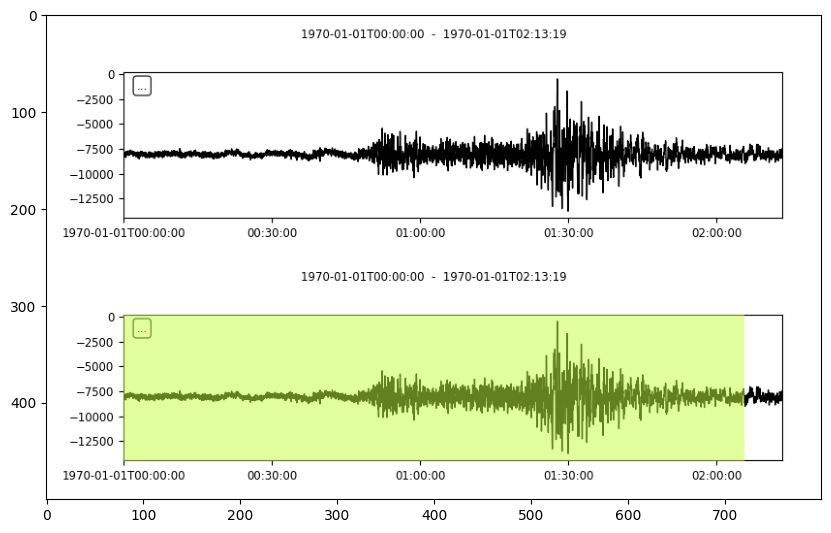

dataset8k_v4/class6/original/202112_0_20__GEDZ.BHZ.KO_original.sac
1/1 [==============================] - 0s 26ms/step


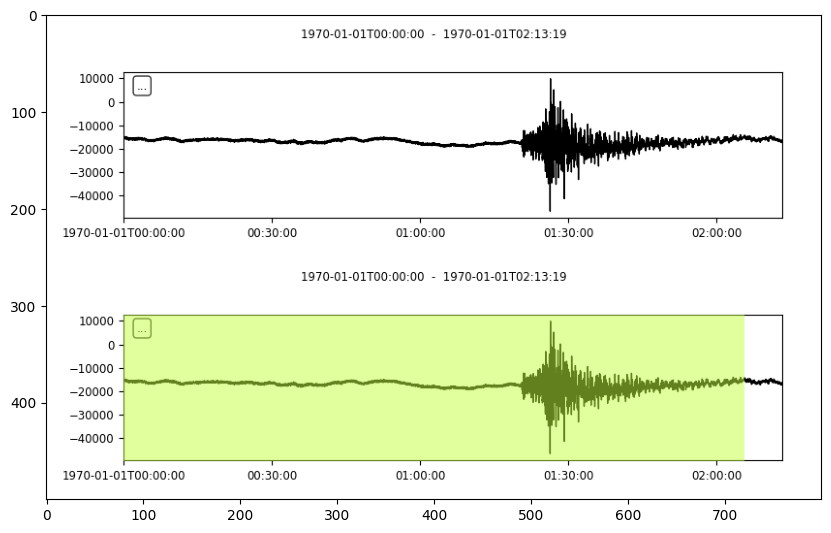

dataset8k_v4/class6/original/201910_12_50__GEDZ.BHZ.KO_original.sac
1/1 [==============================] - 0s 21ms/step


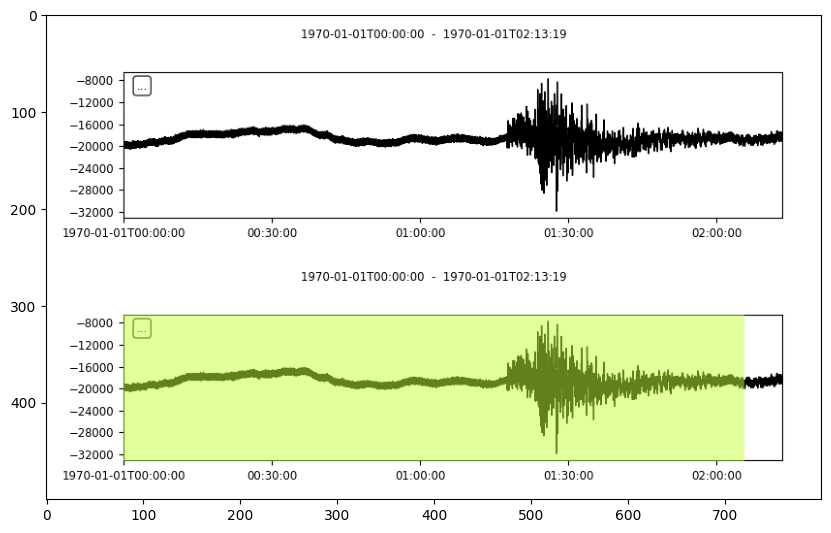

dataset8k_v4/class6/original/202004_22_0__SIMA.BHZ.KO_original.sac
1/1 [==============================] - 0s 19ms/step


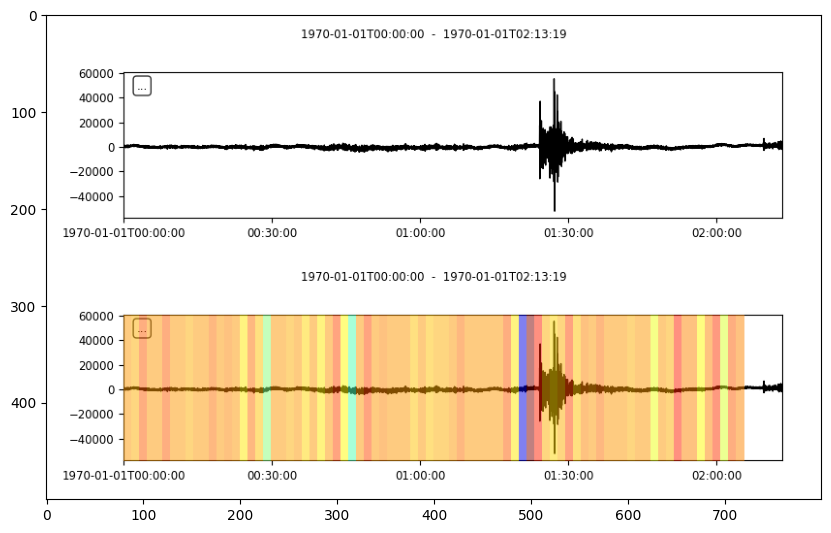

dataset8k_v4/class6/original/201912_12_0__SIMA.BHZ.KO_original.sac
1/1 [==============================] - 0s 21ms/step


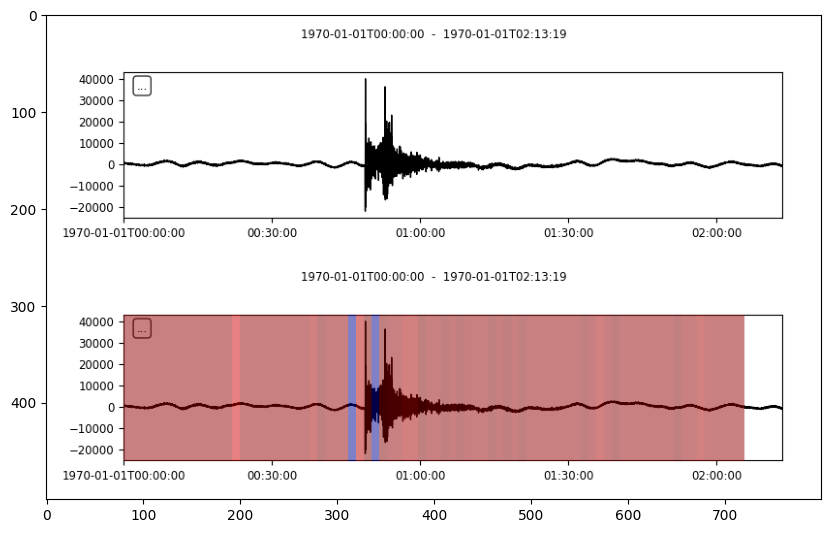

dataset8k_v4/class6/original/202110_7_14__BAKL.BHZ.KO_original.sac
1/1 [==============================] - 0s 22ms/step


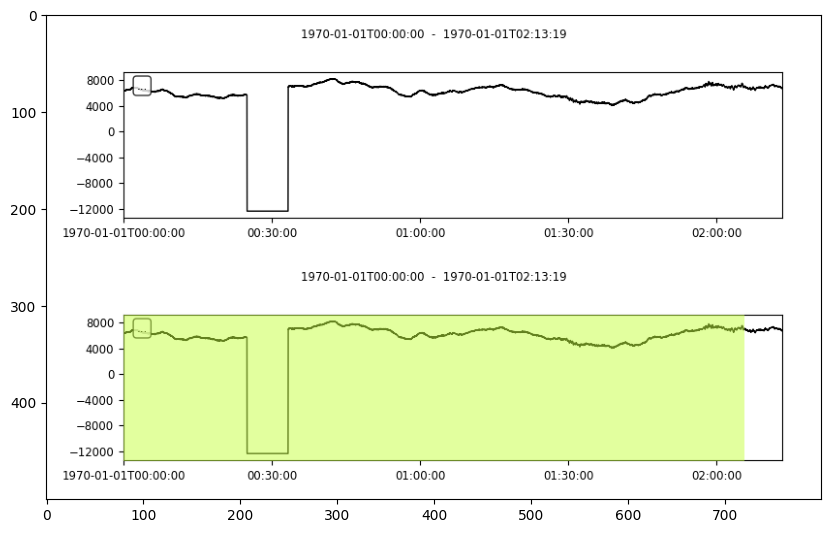

dataset8k_v4/class6/original/202003_19_38__KCTX.BHZ.KO_original.sac
1/1 [==============================] - 0s 22ms/step


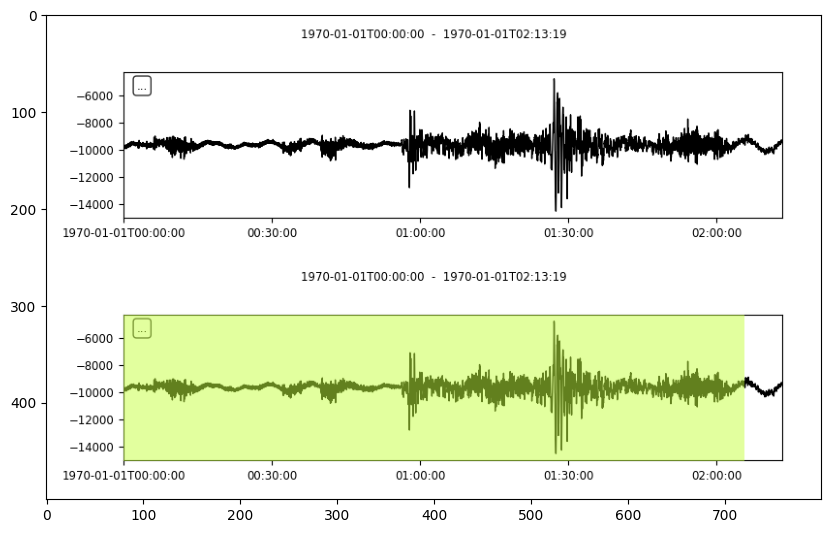

dataset8k_v4/class6/original/202002_3_9__GEDZ.BHZ.KO_original.sac
1/1 [==============================] - 0s 21ms/step


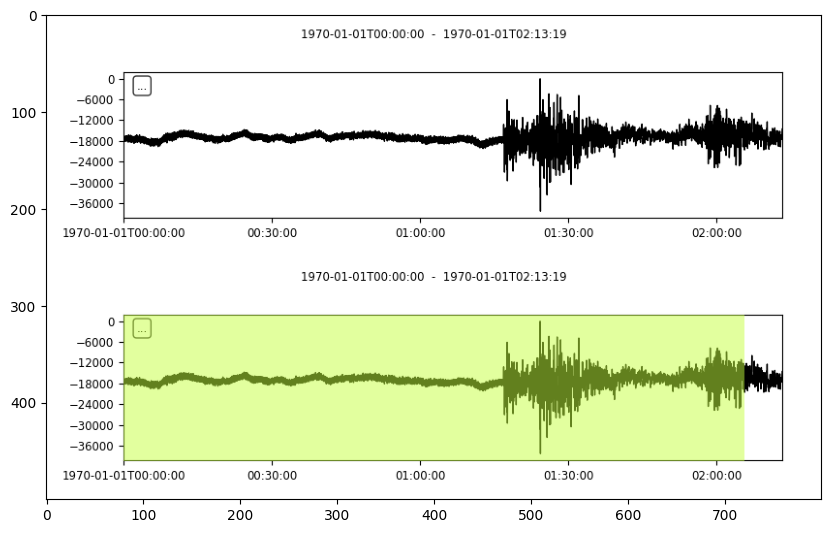

dataset8k_v4/class6/original/202201_0_36__KULA.BHZ.KO_original.sac
1/1 [==============================] - 0s 21ms/step


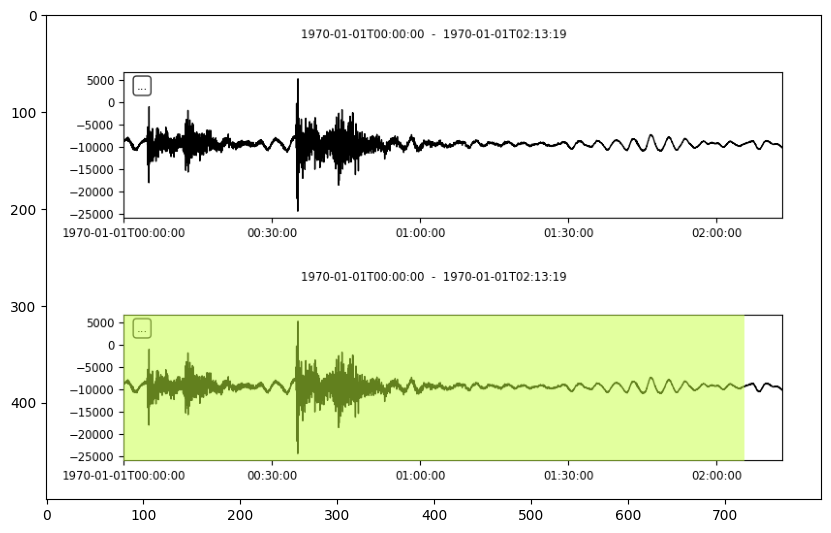

dataset8k_v4/class6/original/201901_22_0__SIMA.BHZ.KO_original.sac
1/1 [==============================] - 0s 26ms/step


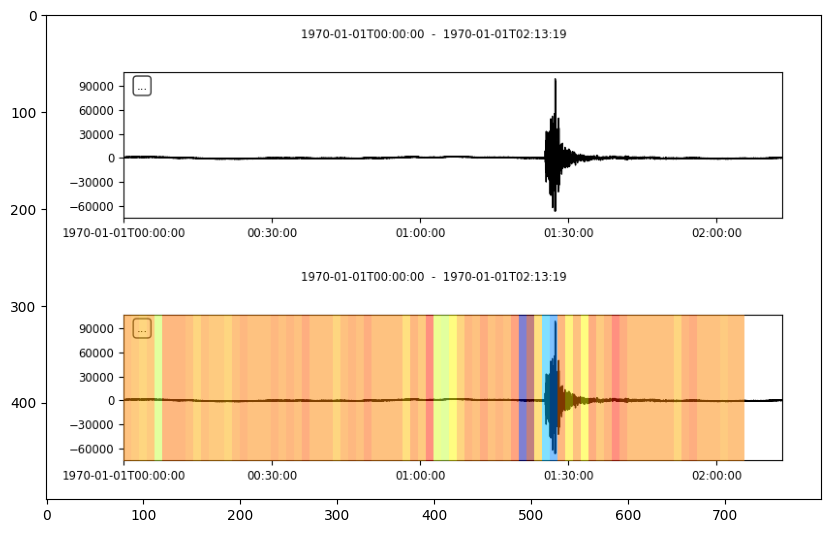

dataset8k_v4/class6/original/202201_8_220__GULT.BHZ.KO_original.sac
1/1 [==============================] - 0s 20ms/step


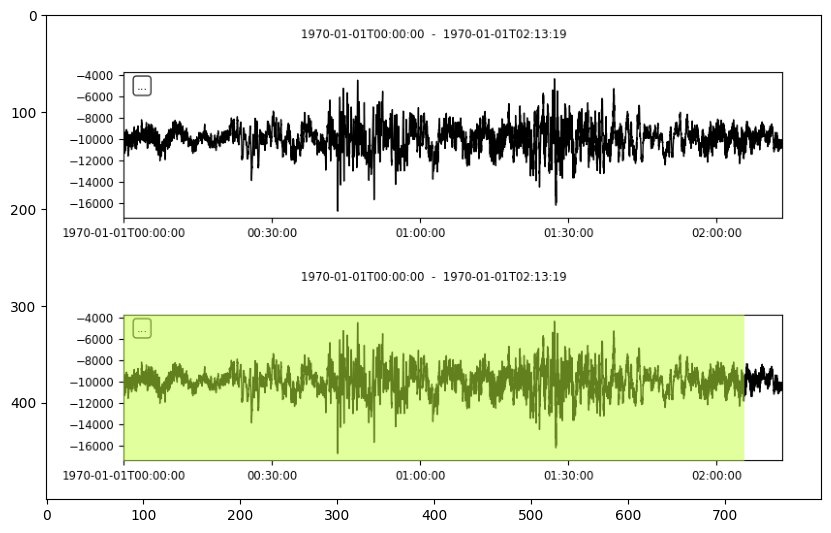

dataset8k_v4/class6/original/201909_0_16__KULA.BHZ.KO_original.sac
1/1 [==============================] - 0s 22ms/step


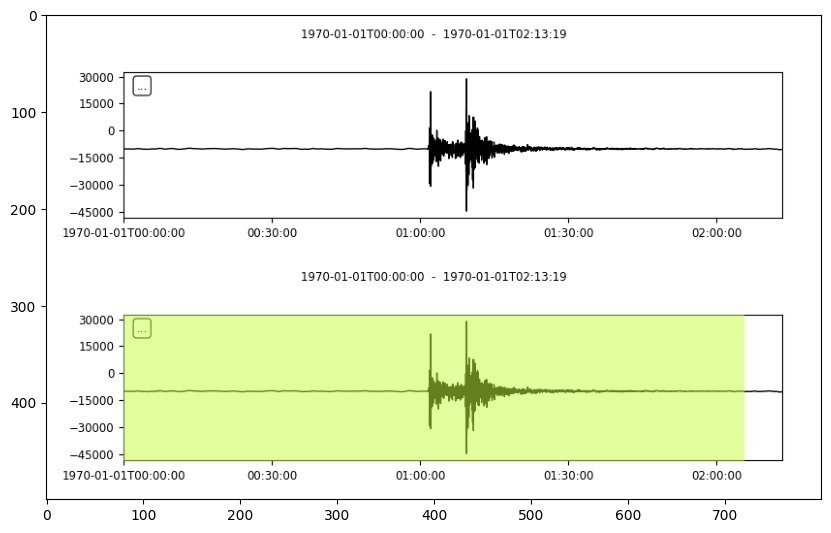

dataset8k_v4/class6/original/201910_18_171__GULT.BHZ.KO_original.sac
1/1 [==============================] - 0s 21ms/step


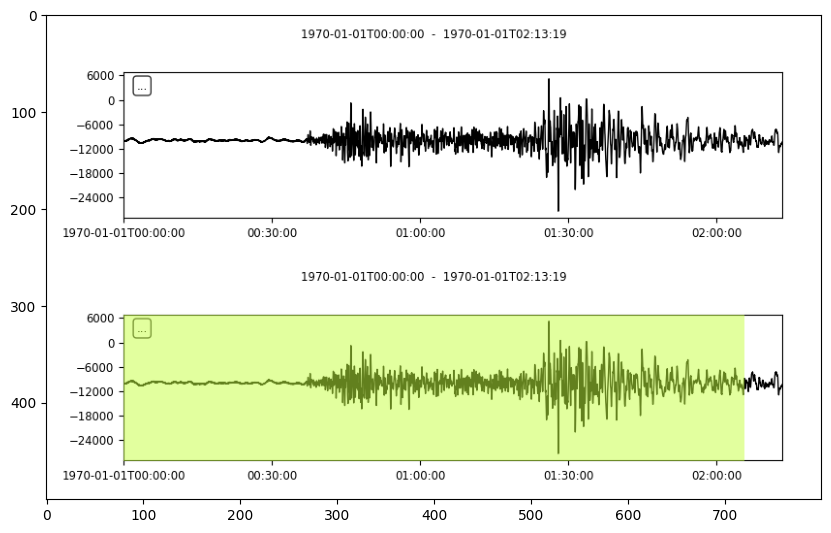

dataset8k_v4/class6/original/202002_12_2__SIMA.BHZ.KO_original.sac
1/1 [==============================] - 0s 22ms/step


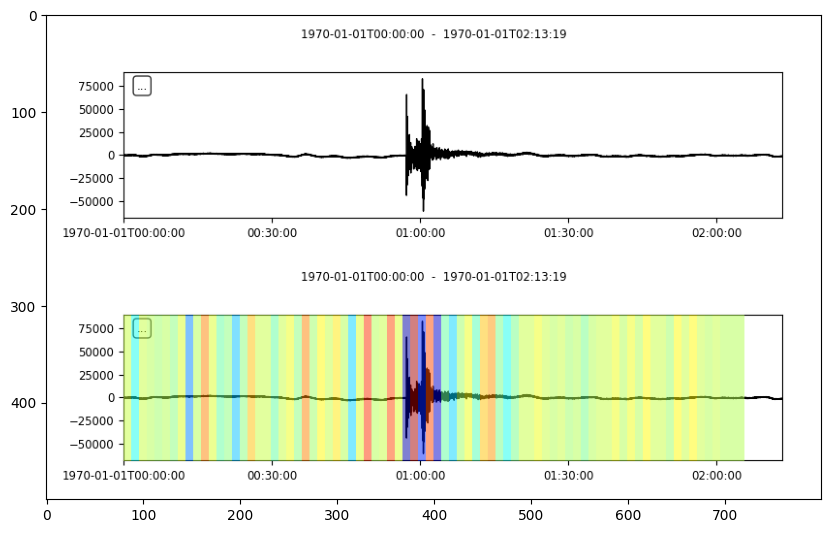

dataset8k_v4/class6/original/201902_1_110__ARMT.BHZ.KO_original.sac
1/1 [==============================] - 0s 20ms/step


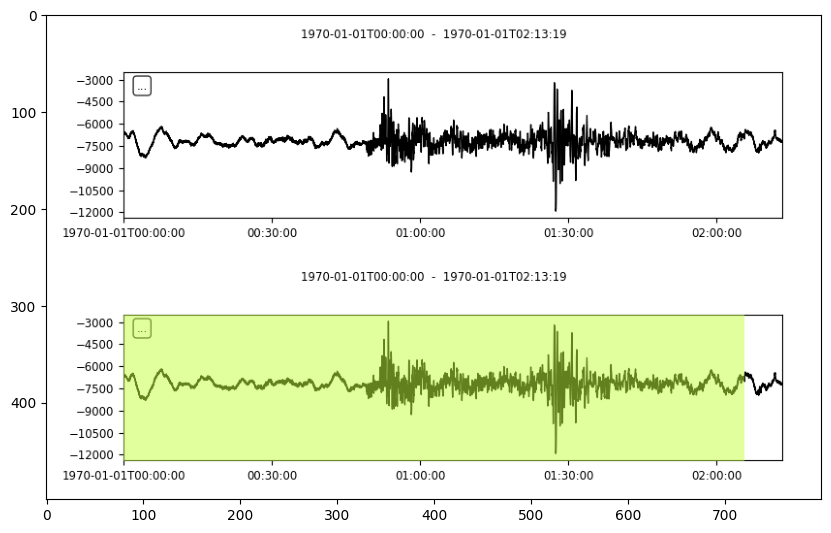

dataset8k_v4/class6/original/202202_7_19__GEDZ.BHZ.KO_original.sac
1/1 [==============================] - 0s 20ms/step


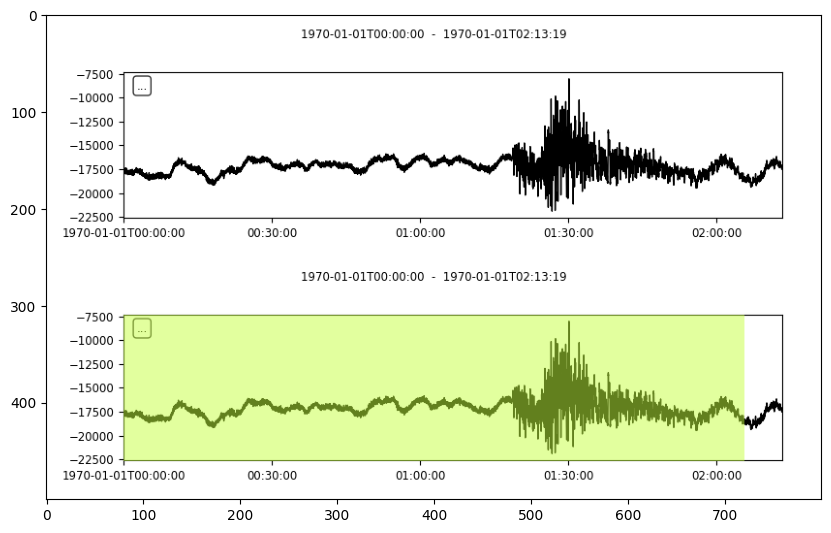

dataset8k_v4/class6/original/202104_12_12__KO.SIMA..BHZ.D.2021.113.152954.SAC_original.sac
1/1 [==============================] - 0s 21ms/step


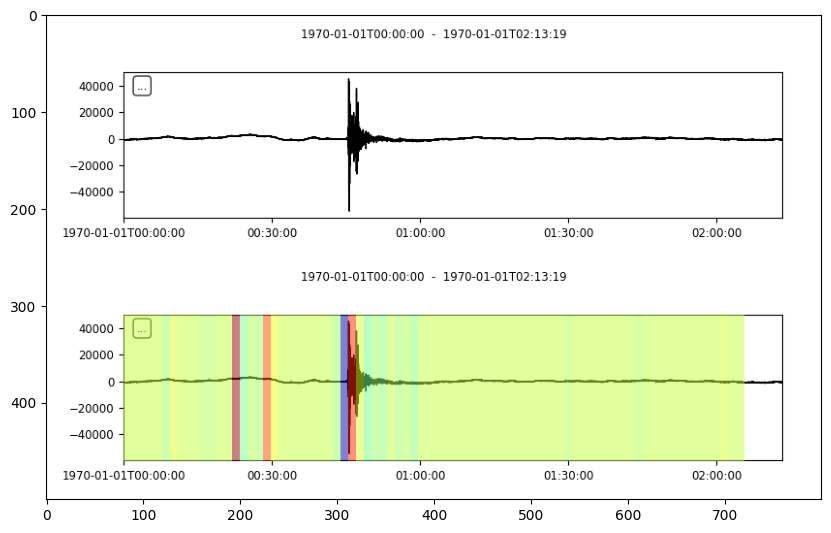

dataset8k_v4/class6/original/202006_14_2__SIMA.BHZ.KO_original.sac
1/1 [==============================] - 0s 21ms/step


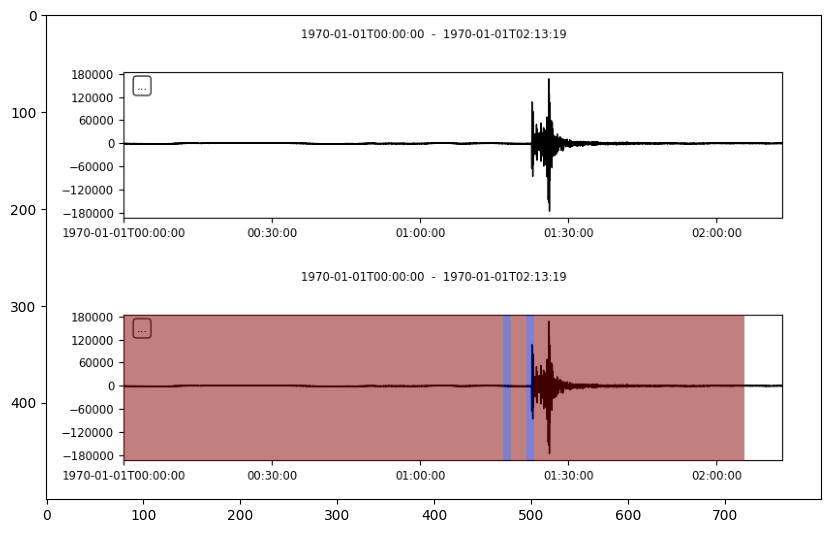

dataset8k_v4/class6/original/202010_35_3__SIMA.BHZ.KO_original.sac
1/1 [==============================] - 0s 22ms/step


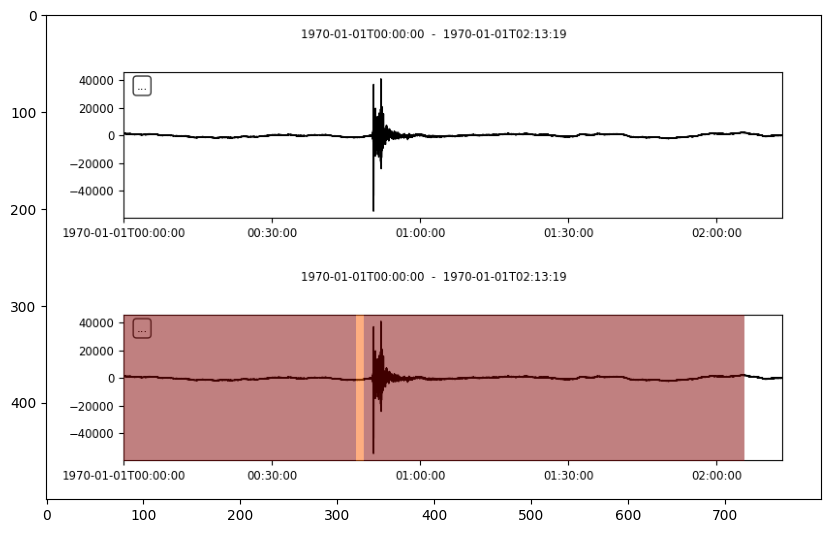

dataset8k_v4/class6/original/201911_4_0__SIMA.BHZ.KO_original.sac
1/1 [==============================] - 0s 24ms/step


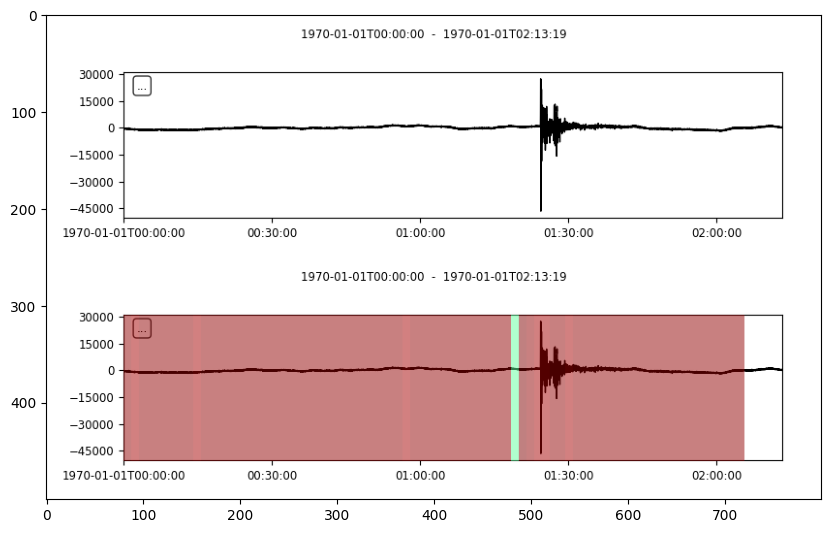

dataset8k_v4/class6/original/202005_0_0__SIMA.BHZ.KO_original.sac
1/1 [==============================] - 0s 20ms/step


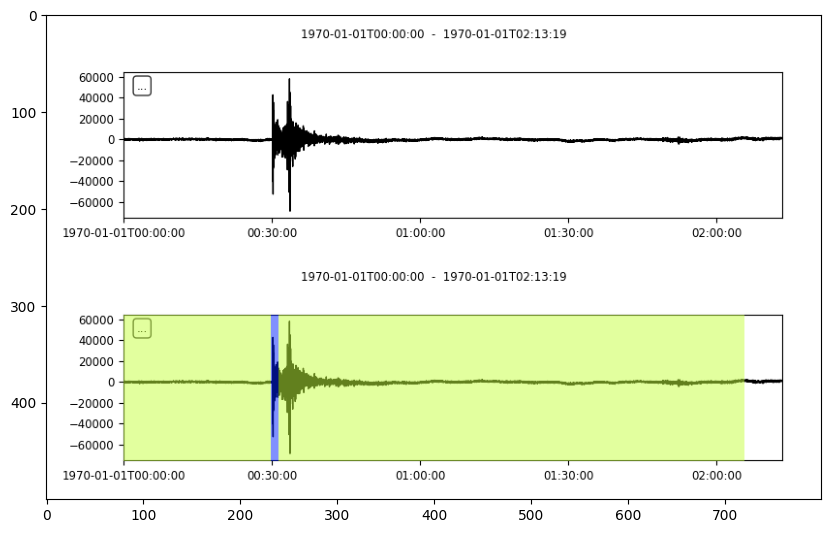

dataset8k_v4/class6/original/201908_23_1__SIMA.BHZ.KO_original.sac
1/1 [==============================] - 0s 19ms/step


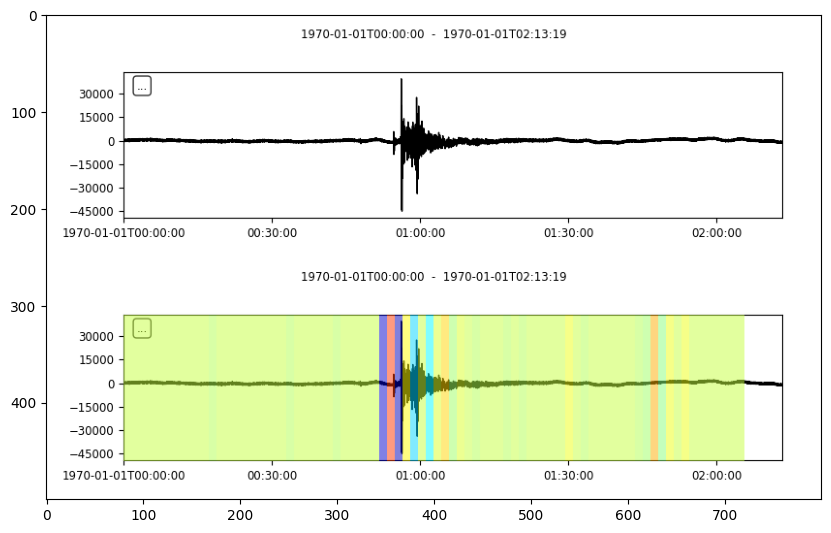

dataset8k_v4/class6/original/201908_13_46__GEDZ.BHZ.KO_original.sac
1/1 [==============================] - 0s 20ms/step


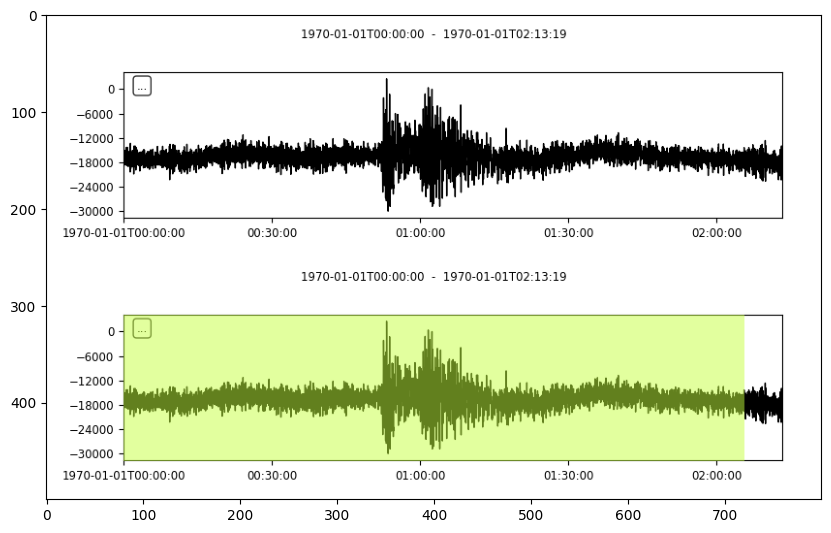

dataset8k_v4/class6/original/202105_1_66__TVSB.BHZ.KO_original.sac
1/1 [==============================] - 0s 21ms/step


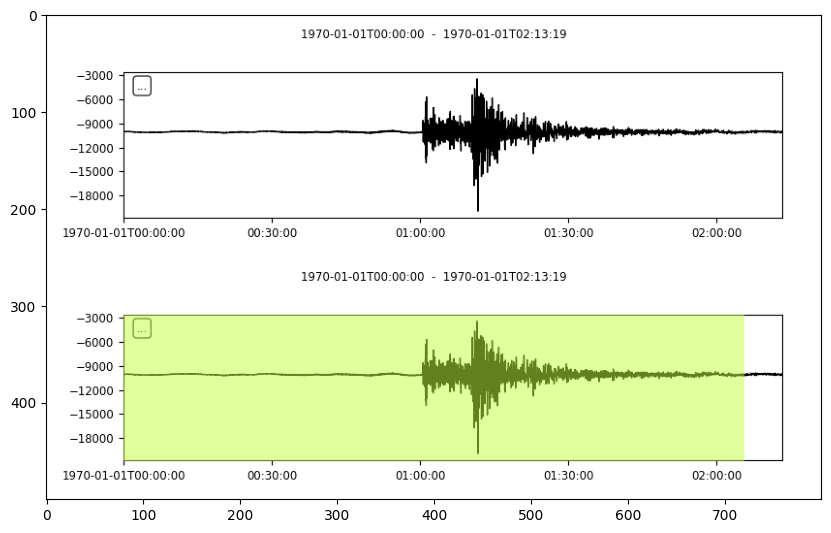

dataset8k_v4/class6/original/201911_25_94__ARMT.BHZ.KO_original.sac


2023-06-21 19:23:46.766338: I tensorflow/core/common_runtime/executor.cc:1197] [/job:localhost/replica:0/task:0/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: Matrix size-incompatible: In[0]: [1,4632], In[1]: [3984,8]
	 [[{{node sequential/dense/Relu}}]]


InvalidArgumentError: Graph execution error:

Detected at node 'sequential/dense/Relu' defined at (most recent call last):
    File "/usr/lib/python3.10/runpy.py", line 196, in _run_module_as_main
      return _run_code(code, main_globals, None,
    File "/usr/lib/python3.10/runpy.py", line 86, in _run_code
      exec(code, run_globals)
    File "/home/mbulucay/.local/lib/python3.10/site-packages/ipykernel_launcher.py", line 17, in <module>
      app.launch_new_instance()
    File "/home/mbulucay/.local/lib/python3.10/site-packages/traitlets/config/application.py", line 1043, in launch_instance
      app.start()
    File "/home/mbulucay/.local/lib/python3.10/site-packages/ipykernel/kernelapp.py", line 725, in start
      self.io_loop.start()
    File "/home/mbulucay/.local/lib/python3.10/site-packages/tornado/platform/asyncio.py", line 215, in start
      self.asyncio_loop.run_forever()
    File "/usr/lib/python3.10/asyncio/base_events.py", line 600, in run_forever
      self._run_once()
    File "/usr/lib/python3.10/asyncio/base_events.py", line 1896, in _run_once
      handle._run()
    File "/usr/lib/python3.10/asyncio/events.py", line 80, in _run
      self._context.run(self._callback, *self._args)
    File "/home/mbulucay/.local/lib/python3.10/site-packages/ipykernel/kernelbase.py", line 513, in dispatch_queue
      await self.process_one()
    File "/home/mbulucay/.local/lib/python3.10/site-packages/ipykernel/kernelbase.py", line 502, in process_one
      await dispatch(*args)
    File "/home/mbulucay/.local/lib/python3.10/site-packages/ipykernel/kernelbase.py", line 409, in dispatch_shell
      await result
    File "/home/mbulucay/.local/lib/python3.10/site-packages/ipykernel/kernelbase.py", line 729, in execute_request
      reply_content = await reply_content
    File "/home/mbulucay/.local/lib/python3.10/site-packages/ipykernel/ipkernel.py", line 422, in do_execute
      res = shell.run_cell(
    File "/home/mbulucay/.local/lib/python3.10/site-packages/ipykernel/zmqshell.py", line 540, in run_cell
      return super().run_cell(*args, **kwargs)
    File "/home/mbulucay/.local/lib/python3.10/site-packages/IPython/core/interactiveshell.py", line 2961, in run_cell
      result = self._run_cell(
    File "/home/mbulucay/.local/lib/python3.10/site-packages/IPython/core/interactiveshell.py", line 3016, in _run_cell
      result = runner(coro)
    File "/home/mbulucay/.local/lib/python3.10/site-packages/IPython/core/async_helpers.py", line 129, in _pseudo_sync_runner
      coro.send(None)
    File "/home/mbulucay/.local/lib/python3.10/site-packages/IPython/core/interactiveshell.py", line 3221, in run_cell_async
      has_raised = await self.run_ast_nodes(code_ast.body, cell_name,
    File "/home/mbulucay/.local/lib/python3.10/site-packages/IPython/core/interactiveshell.py", line 3400, in run_ast_nodes
      if await self.run_code(code, result, async_=asy):
    File "/home/mbulucay/.local/lib/python3.10/site-packages/IPython/core/interactiveshell.py", line 3460, in run_code
      exec(code_obj, self.user_global_ns, self.user_ns)
    File "/tmp/ipykernel_11488/3173068241.py", line 16, in <module>
      trace, pred, p_l = colorize(path, divide_number = 80)
    File "/tmp/ipykernel_11488/1633683786.py", line 19, in colorize
      t_pred = model.predict(predict_data)
    File "/usr/local/lib/python3.10/dist-packages/keras/utils/traceback_utils.py", line 65, in error_handler
      return fn(*args, **kwargs)
    File "/usr/local/lib/python3.10/dist-packages/keras/engine/training.py", line 2382, in predict
      tmp_batch_outputs = self.predict_function(iterator)
    File "/usr/local/lib/python3.10/dist-packages/keras/engine/training.py", line 2169, in predict_function
      return step_function(self, iterator)
    File "/usr/local/lib/python3.10/dist-packages/keras/engine/training.py", line 2155, in step_function
      outputs = model.distribute_strategy.run(run_step, args=(data,))
    File "/usr/local/lib/python3.10/dist-packages/keras/engine/training.py", line 2143, in run_step
      outputs = model.predict_step(data)
    File "/usr/local/lib/python3.10/dist-packages/keras/engine/training.py", line 2111, in predict_step
      return self(x, training=False)
    File "/usr/local/lib/python3.10/dist-packages/keras/utils/traceback_utils.py", line 65, in error_handler
      return fn(*args, **kwargs)
    File "/usr/local/lib/python3.10/dist-packages/keras/engine/training.py", line 558, in __call__
      return super().__call__(*args, **kwargs)
    File "/usr/local/lib/python3.10/dist-packages/keras/utils/traceback_utils.py", line 65, in error_handler
      return fn(*args, **kwargs)
    File "/usr/local/lib/python3.10/dist-packages/keras/engine/base_layer.py", line 1145, in __call__
      outputs = call_fn(inputs, *args, **kwargs)
    File "/usr/local/lib/python3.10/dist-packages/keras/utils/traceback_utils.py", line 96, in error_handler
      return fn(*args, **kwargs)
    File "/usr/local/lib/python3.10/dist-packages/keras/engine/sequential.py", line 412, in call
      return super().call(inputs, training=training, mask=mask)
    File "/usr/local/lib/python3.10/dist-packages/keras/engine/functional.py", line 512, in call
      return self._run_internal_graph(inputs, training=training, mask=mask)
    File "/usr/local/lib/python3.10/dist-packages/keras/engine/functional.py", line 669, in _run_internal_graph
      outputs = node.layer(*args, **kwargs)
    File "/usr/local/lib/python3.10/dist-packages/keras/utils/traceback_utils.py", line 65, in error_handler
      return fn(*args, **kwargs)
    File "/usr/local/lib/python3.10/dist-packages/keras/engine/base_layer.py", line 1145, in __call__
      outputs = call_fn(inputs, *args, **kwargs)
    File "/usr/local/lib/python3.10/dist-packages/keras/utils/traceback_utils.py", line 96, in error_handler
      return fn(*args, **kwargs)
    File "/usr/local/lib/python3.10/dist-packages/keras/layers/core/dense.py", line 255, in call
      outputs = self.activation(outputs)
    File "/usr/local/lib/python3.10/dist-packages/keras/activations.py", line 317, in relu
      return backend.relu(
    File "/usr/local/lib/python3.10/dist-packages/keras/backend.py", line 5396, in relu
      x = tf.nn.relu(x)
Node: 'sequential/dense/Relu'
Matrix size-incompatible: In[0]: [1,4632], In[1]: [3984,8]
	 [[{{node sequential/dense/Relu}}]] [Op:__inference_predict_function_406118]

In [58]:


for trace_file in original_trace_file_list:
    path = os.path.join(dataset, original_class_folder, trace_file) 
    print(path)
    trace, pred, p_l = colorize(path, divide_number = 80)
    x = input("Press Enter to continue...")
    if x == 'q':
        break
    elif x == 's':
        # copy the file to another folder
        trace.write("./dataset/" + trace_file, format="SAC")




dataset8k_v4/class6/original/202201_8_48__GULT2.BHZ.KO_original.sac
1/1 [==============================] - 0s 21ms/step


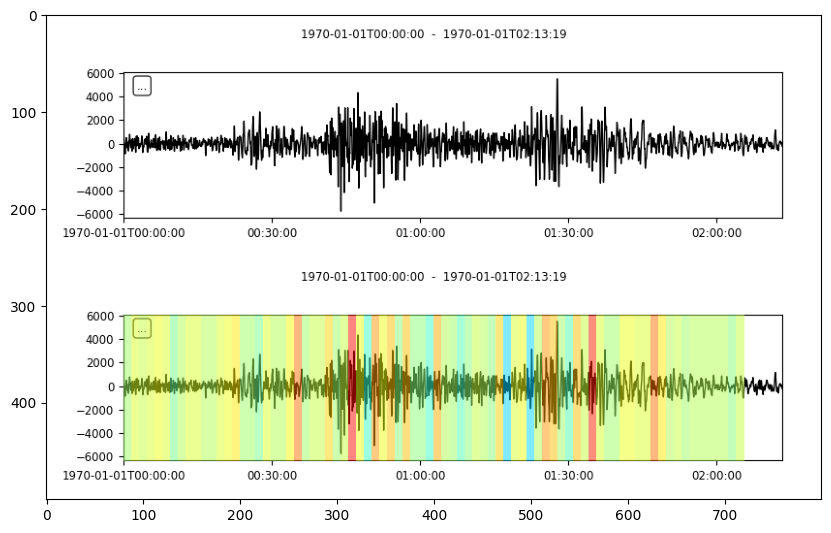

dataset8k_v4/class6/original/202207_13_77__GEDZ.BHZ.KO_original.sac
1/1 [==============================] - 0s 21ms/step


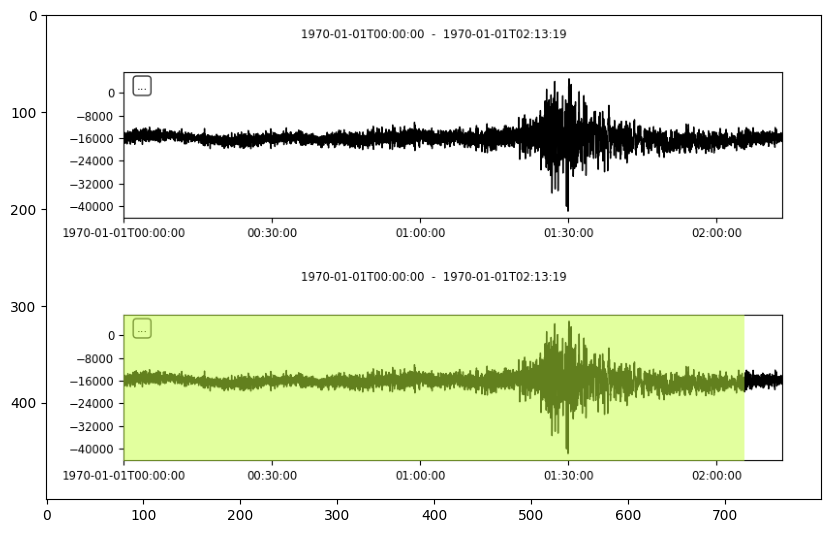

dataset8k_v4/class6/original/202002_24_0__SIMA.BHZ.KO_original.sac
1/1 [==============================] - 0s 22ms/step


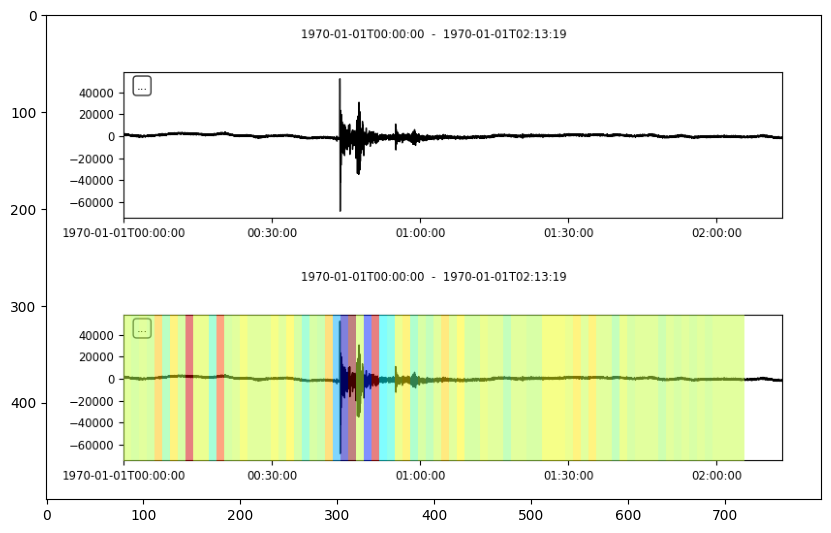

dataset8k_v4/class6/original/201903_9_32__GEDZ.BHZ.KO_original.sac
1/1 [==============================] - 0s 24ms/step


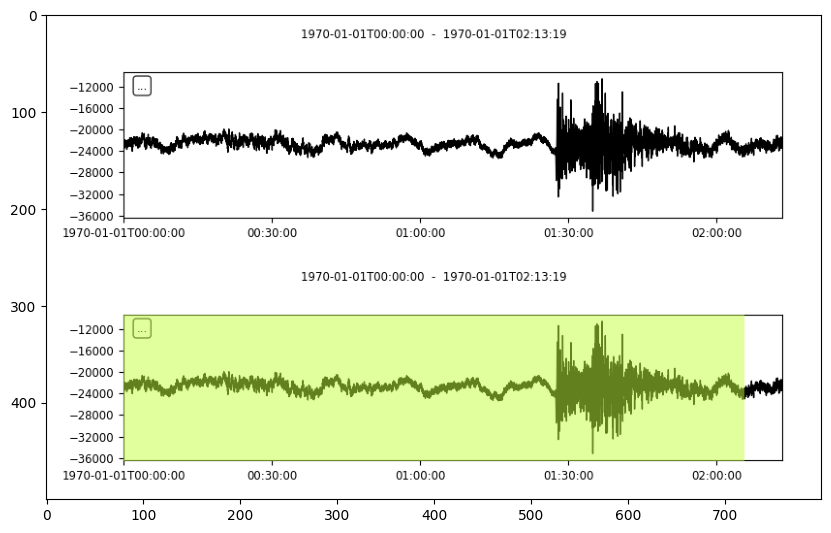

dataset8k_v4/class6/original/201906_9_23__GEDZ.BHZ.KO_original.sac
1/1 [==============================] - 0s 20ms/step


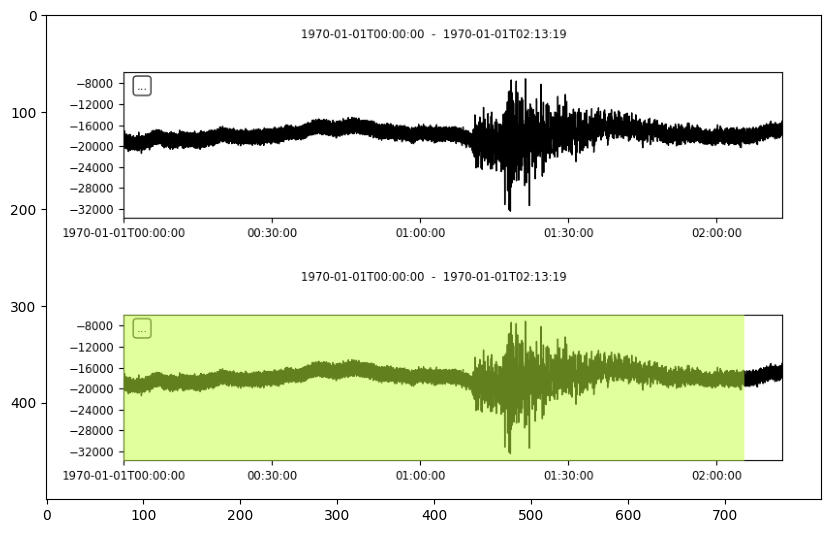

dataset8k_v4/class6/original/202010_13_1__SIMA.BHZ.KO_original.sac
1/1 [==============================] - 0s 20ms/step


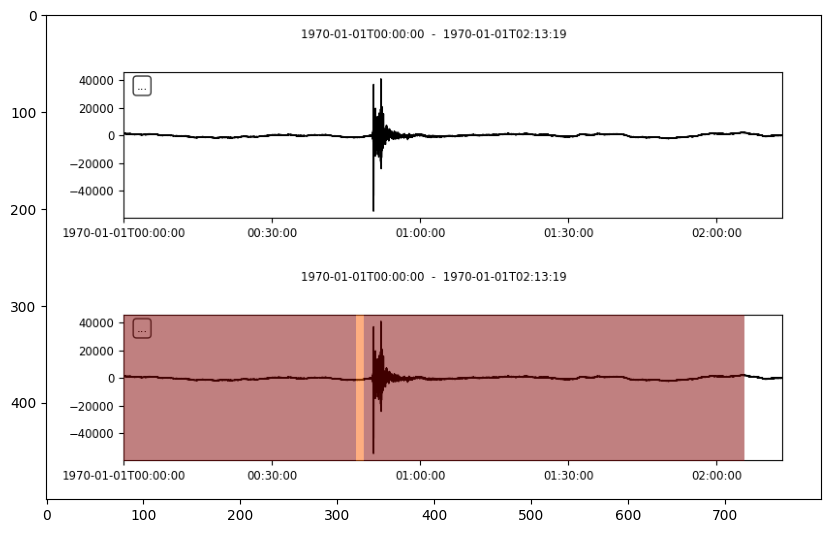

dataset8k_v4/class6/original/201910_18_92__SAUV.BHZ.KO_original.sac
1/1 [==============================] - 0s 20ms/step


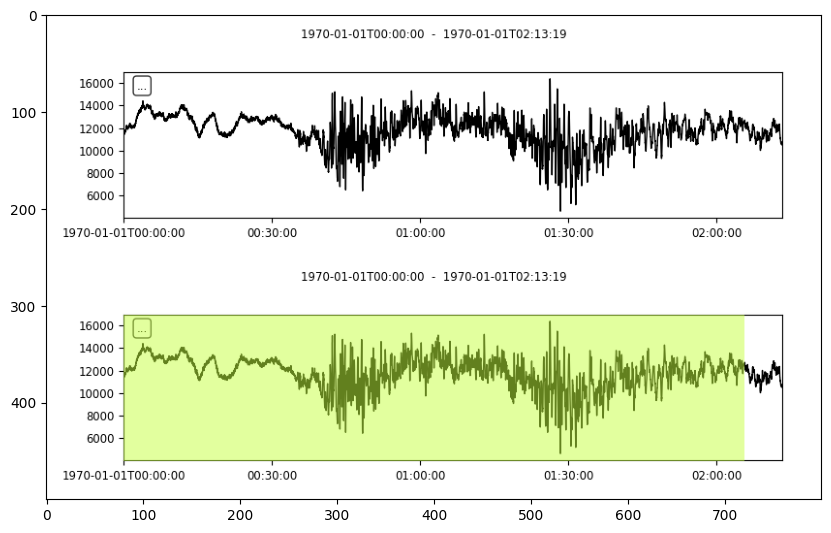

dataset8k_v4/class6/original/201905_1_0__SIMA.BHZ.KO_original.sac
1/1 [==============================] - 0s 21ms/step


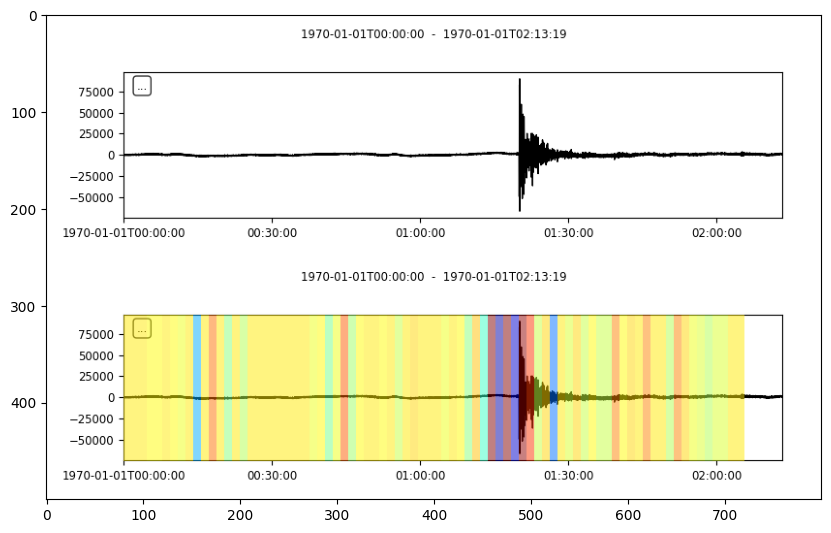

dataset8k_v4/class6/original/201906_6_0__SIMA.BHZ.KO_original.sac
1/1 [==============================] - 0s 21ms/step


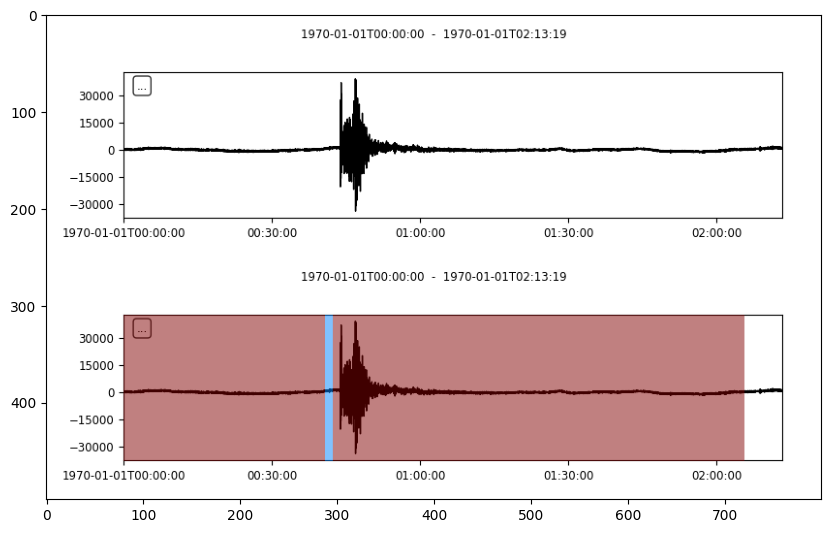

dataset8k_v4/class6/original/202103_13_0__SIMA.BHZ.KO_original.sac
1/1 [==============================] - 0s 21ms/step


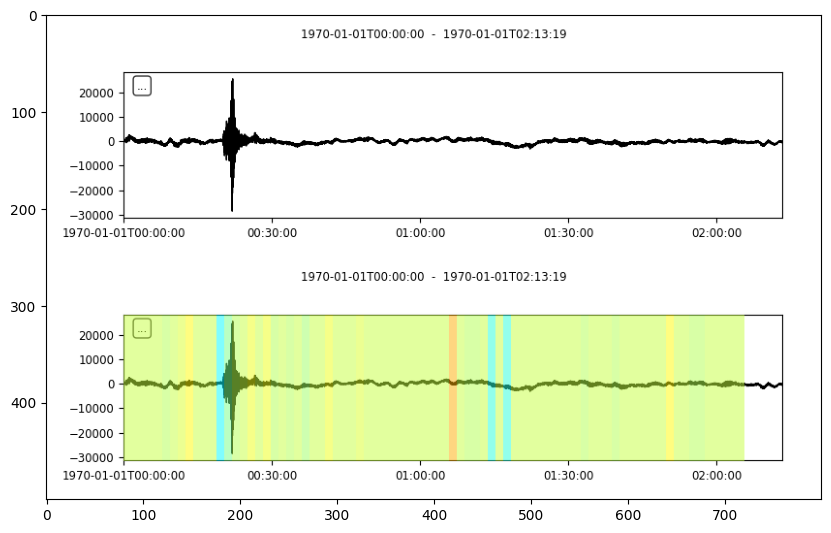

dataset8k_v4/class6/original/202003_19_53__TVSB.BHZ.KO_original.sac
1/1 [==============================] - 0s 20ms/step


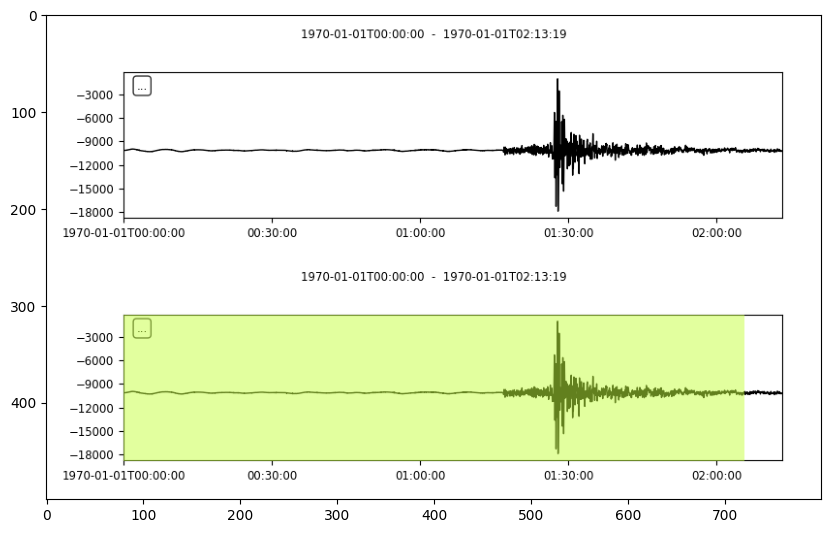

dataset8k_v4/class6/original/201910_18_148__ADVT.BHZ.KO_original.sac
1/1 [==============================] - 0s 20ms/step


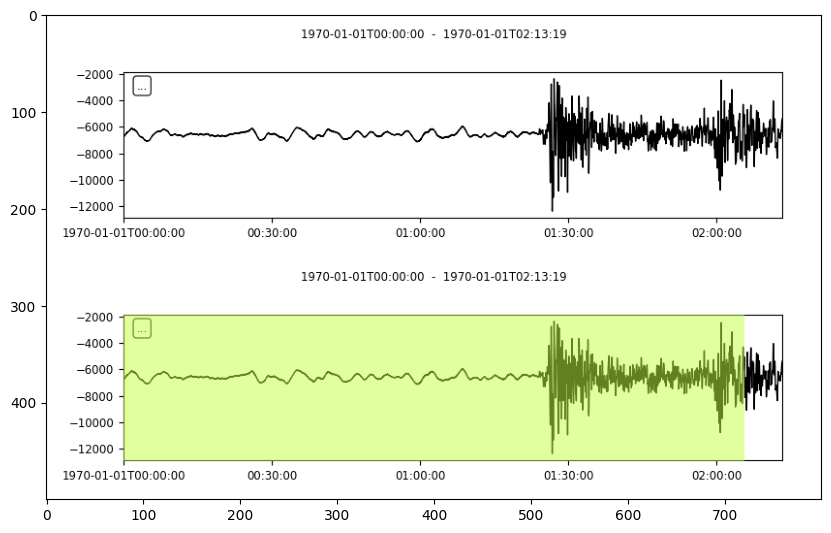

dataset8k_v4/class6/original/202110_7_24__GEDZ.BHZ.KO_original.sac
1/1 [==============================] - 0s 26ms/step


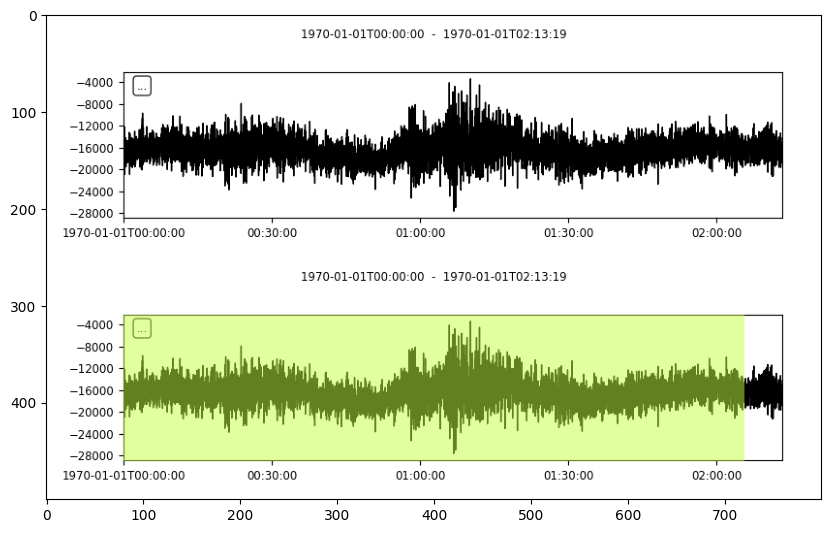

dataset8k_v4/class6/original/202010_1_27__GEDZ.BHZ.KO_original.sac
1/1 [==============================] - 0s 21ms/step


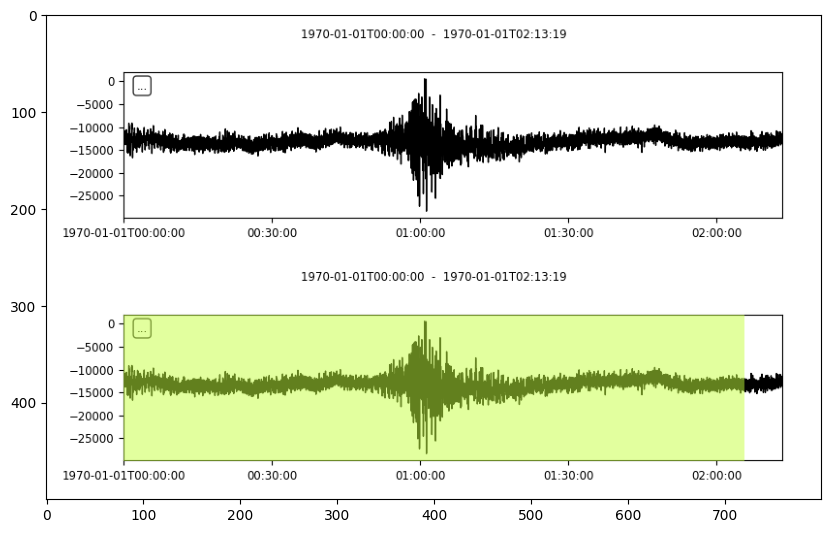

dataset8k_v4/class6/original/202010_36_94__ARMT.BHZ.KO_original.sac
1/1 [==============================] - 0s 21ms/step


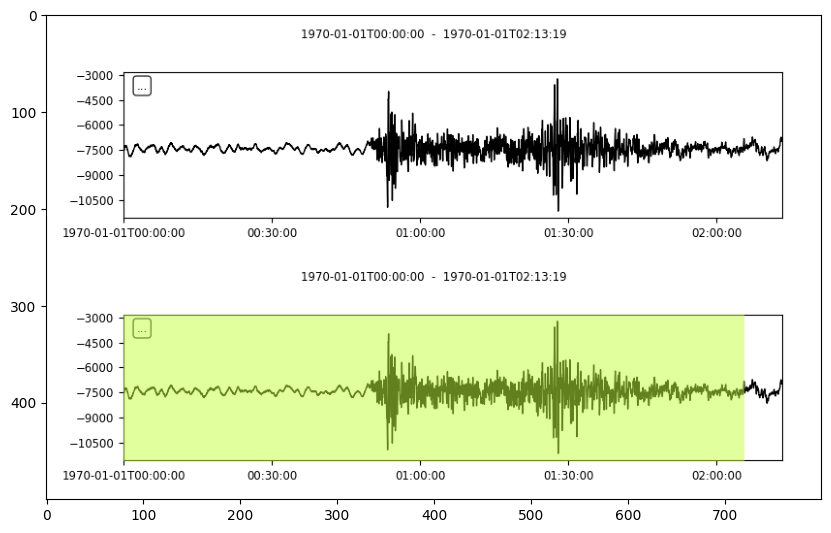

dataset8k_v4/class6/original/202009_20_11__GEDZ.BHZ.KO_original.sac
1/1 [==============================] - 0s 21ms/step


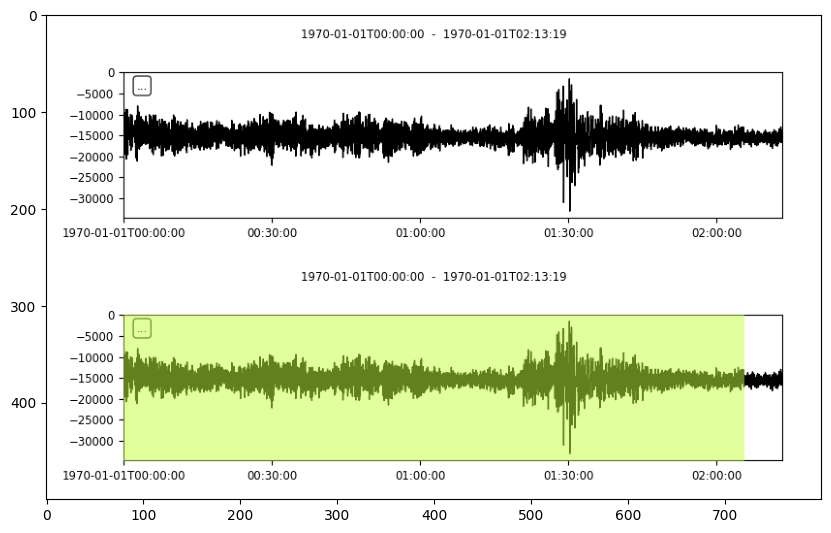

dataset8k_v4/class6/original/201906_10_0__SIMA.BHZ.KO_original.sac
1/1 [==============================] - 0s 21ms/step


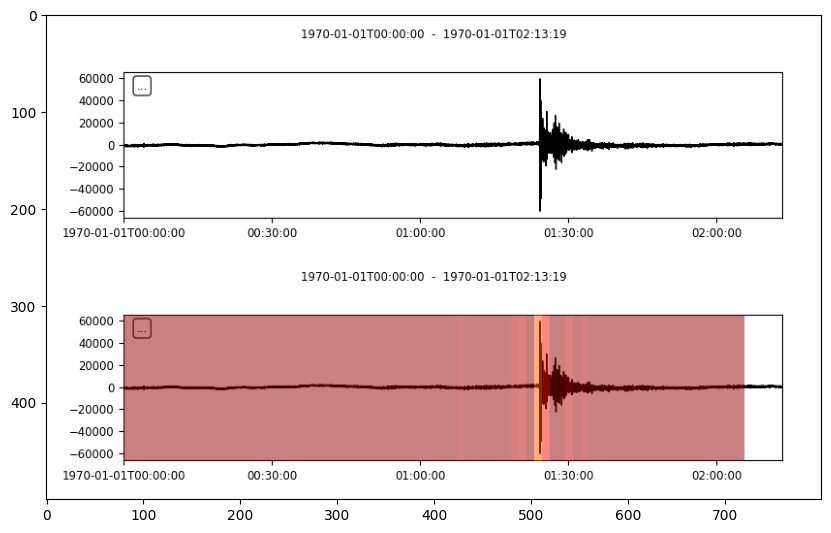

dataset8k_v4/class6/original/201906_17_0__SIMA.BHZ.KO_original.sac
1/1 [==============================] - 0s 20ms/step


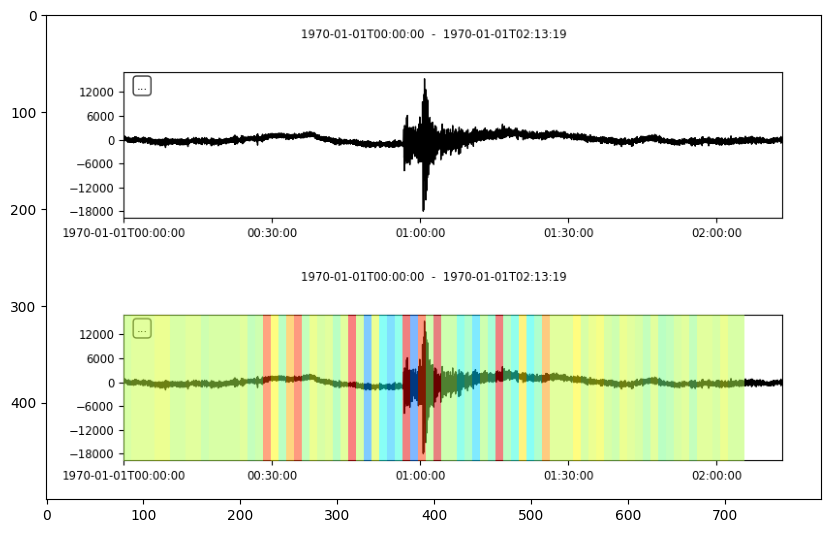

dataset8k_v4/class6/original/202102_14_38__GEDZ.BHZ.KO_original.sac
1/1 [==============================] - 0s 20ms/step


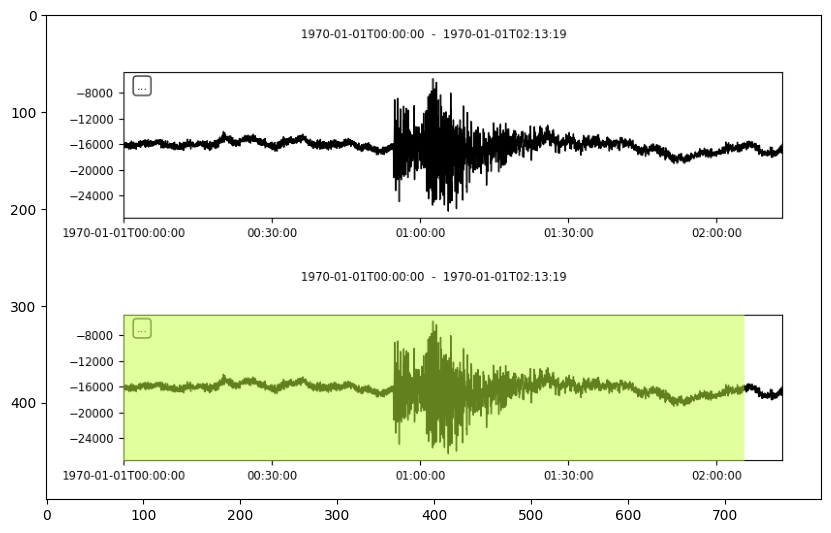

dataset8k_v4/class6/original/201903_14_0__SIMA.BHZ.KO_original.sac
1/1 [==============================] - 0s 19ms/step


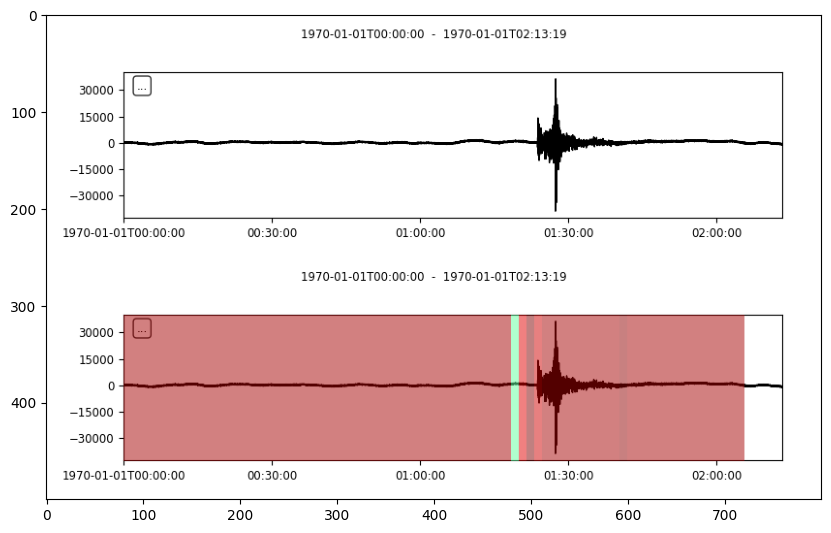

dataset8k_v4/class6/original/202005_9_87__MDNY.BHZ.KO_original.sac
1/1 [==============================] - 0s 20ms/step


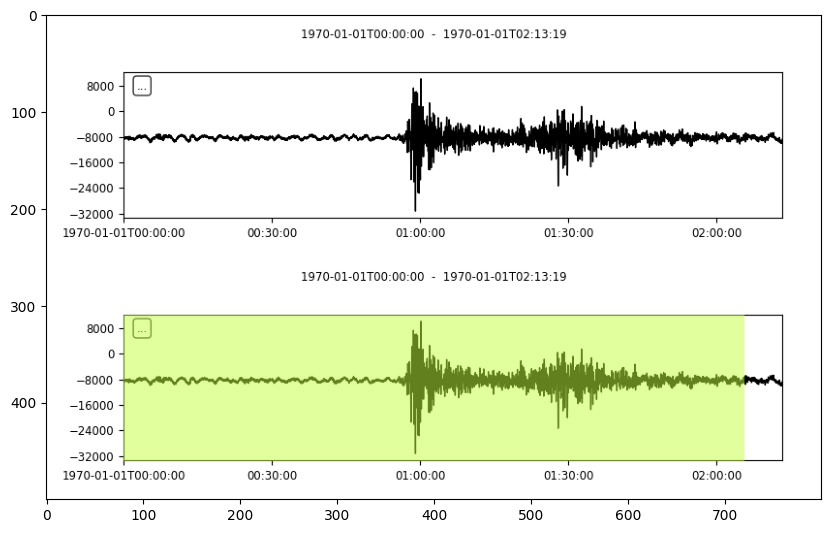

dataset8k_v4/class6/original/201905_2_0__SIMA.BHZ.KO_original.sac
1/1 [==============================] - 0s 20ms/step


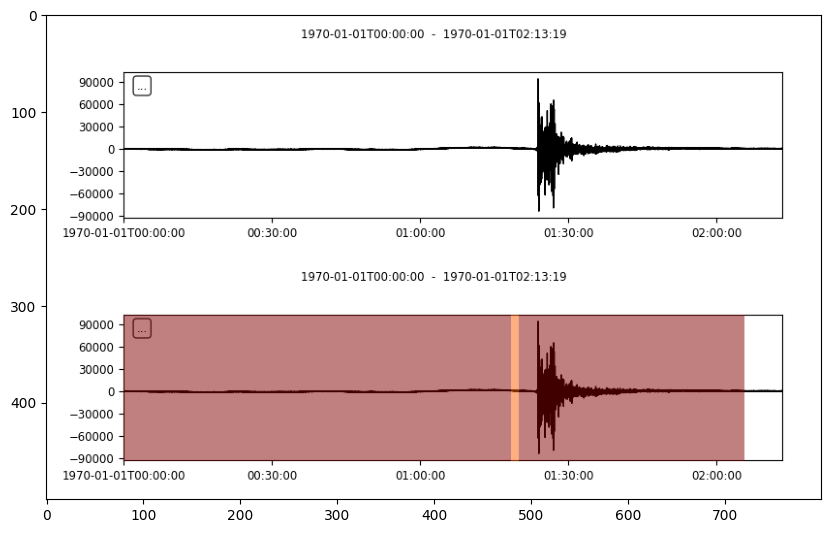

dataset8k_v4/class6/original/201905_18_0__SIMA.BHZ.KO_original.sac
1/1 [==============================] - 0s 24ms/step


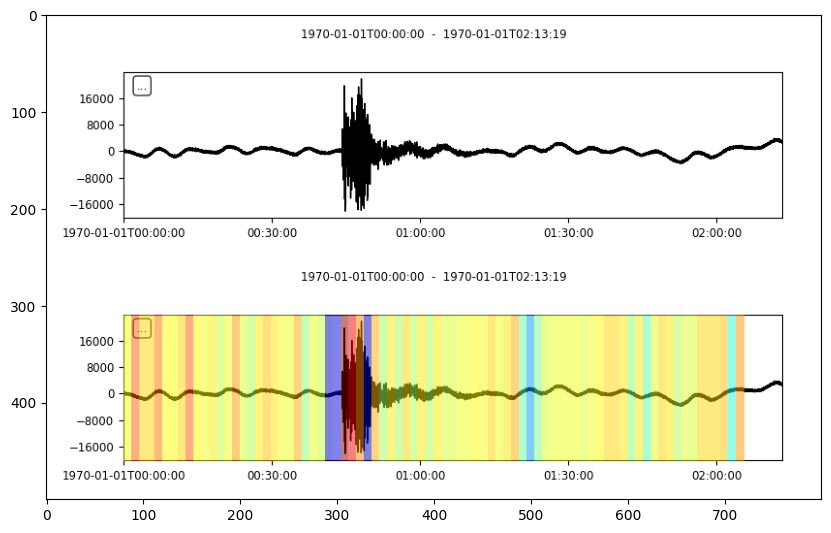

dataset8k_v4/class6/original/201912_9_0__SIMA.BHZ.KO_original.sac
1/1 [==============================] - 0s 20ms/step


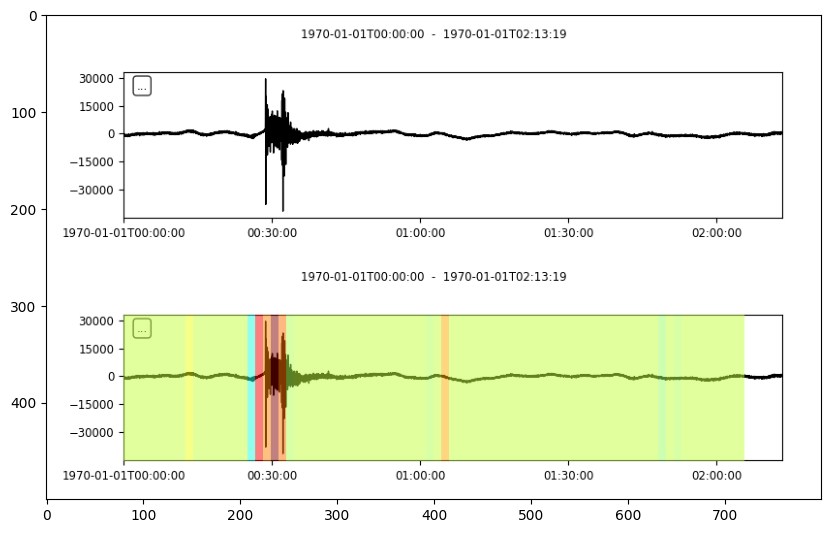

dataset8k_v4/class6/original/202103_19_1__SIMA.BHZ.KO_original.sac
1/1 [==============================] - 0s 19ms/step


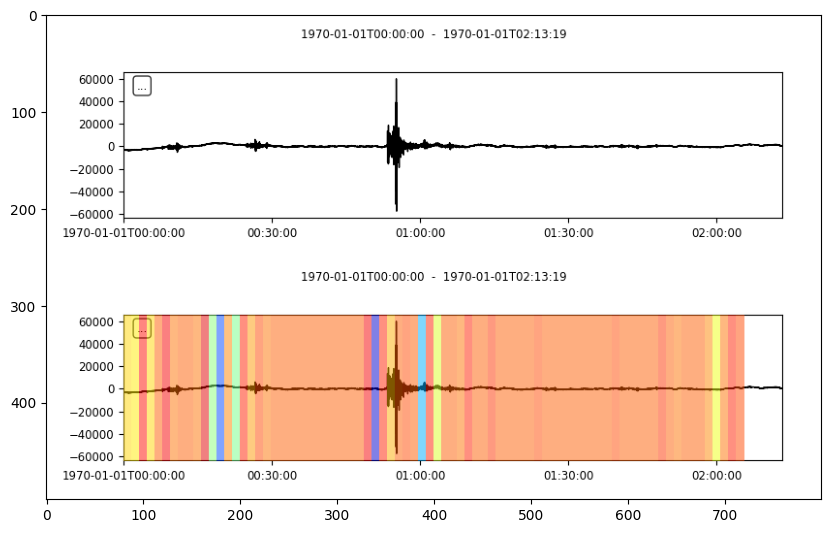

dataset8k_v4/class6/original/202205_1_0__SIMA.BHZ.KO_original.sac
1/1 [==============================] - 0s 21ms/step


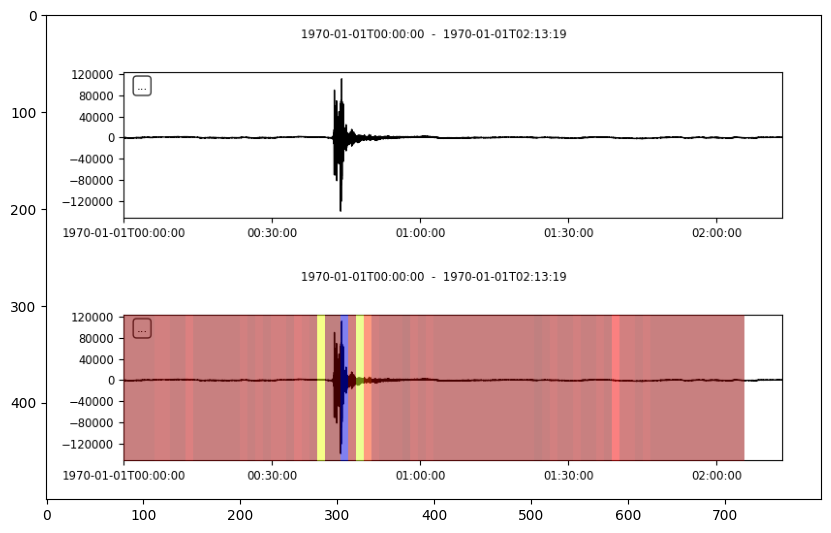

dataset8k_v4/class6/original/202102_15_24__GEDZ.BHZ.KO_original.sac
1/1 [==============================] - 0s 21ms/step


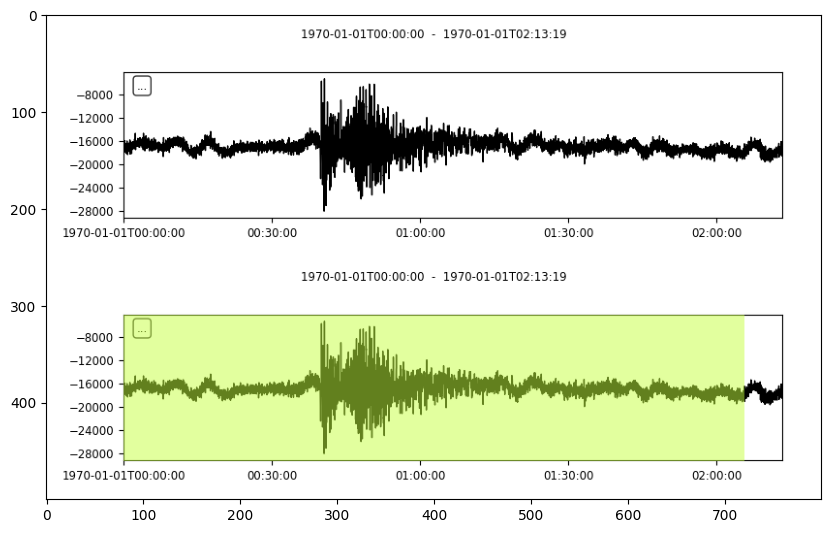

dataset8k_v4/class6/original/202101_11_0__SIMA.BHZ.KO_original.sac
1/1 [==============================] - 0s 21ms/step


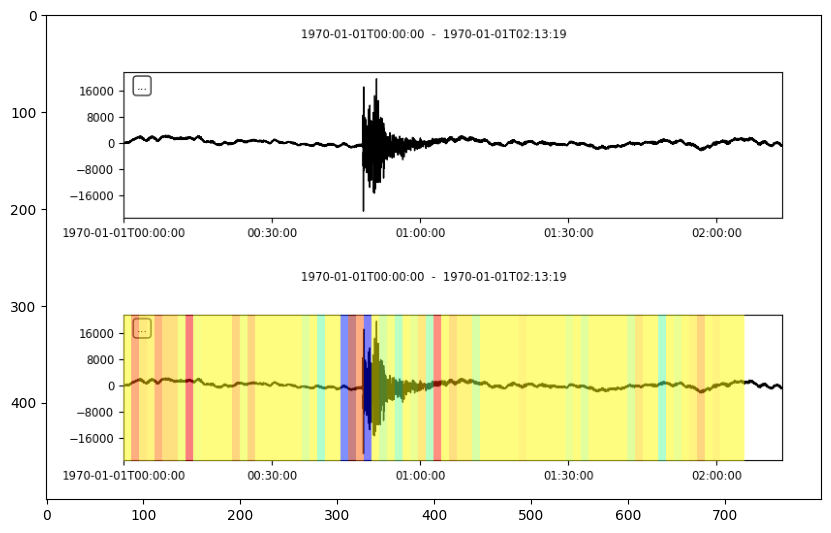

dataset8k_v4/class6/original/202006_2_33__KULA.BHZ.KO_original.sac
1/1 [==============================] - 0s 22ms/step


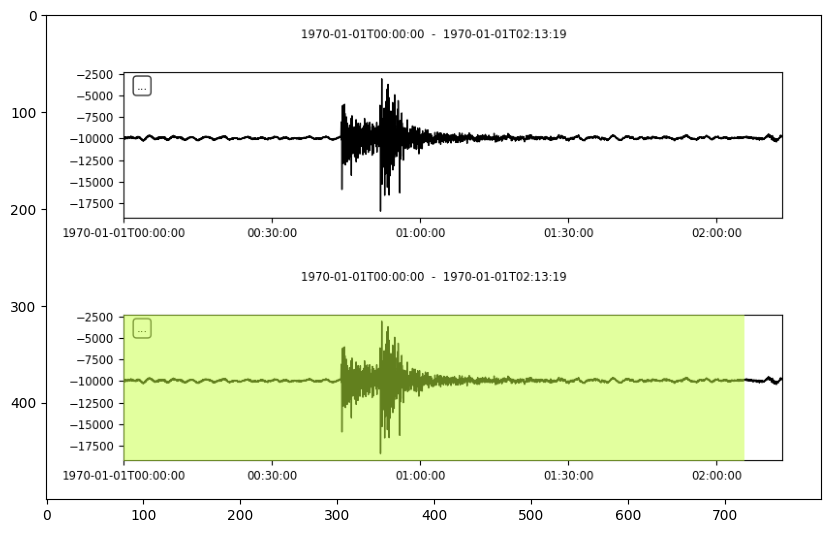

dataset8k_v4/class6/original/201912_16_3__SIMA.BHZ.KO_original.sac
1/1 [==============================] - 0s 21ms/step


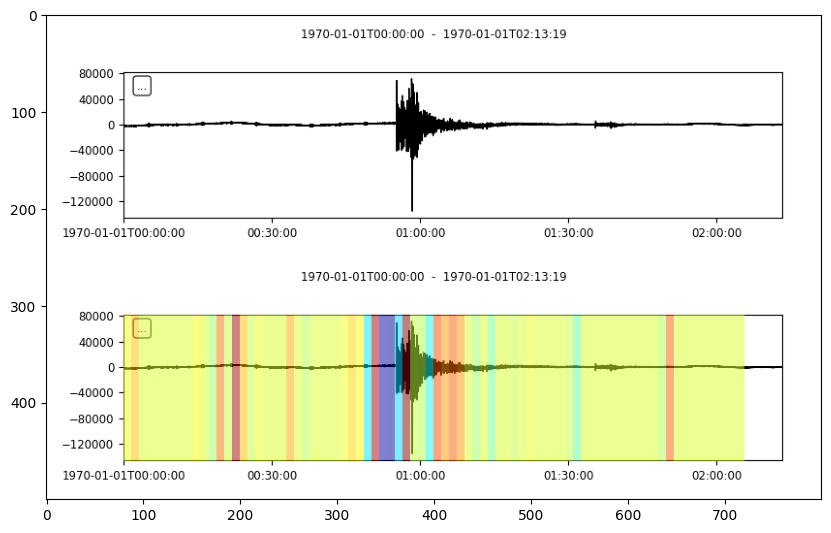

dataset8k_v4/class6/original/202005_9_62__ARMT.BHZ.KO_original.sac
1/1 [==============================] - 0s 26ms/step


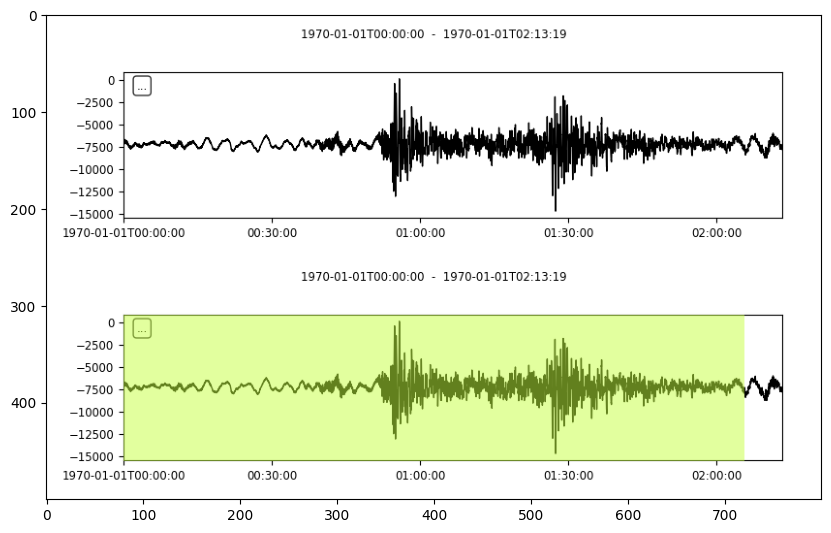

dataset8k_v4/class6/original/201901_1_39__GEDZ.BHZ.KO_original.sac
1/1 [==============================] - 0s 21ms/step


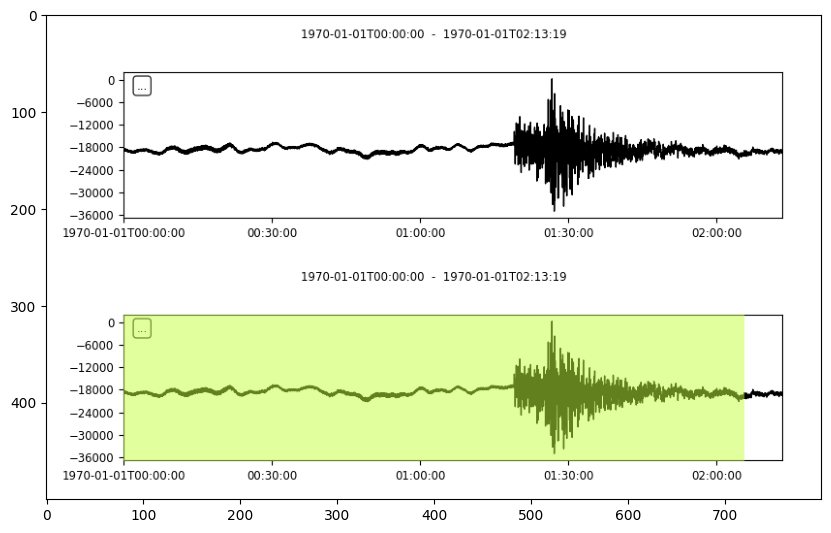

dataset8k_v4/class6/original/202201_0_161__MDNY.BHZ.KO_original.sac
1/1 [==============================] - 0s 21ms/step


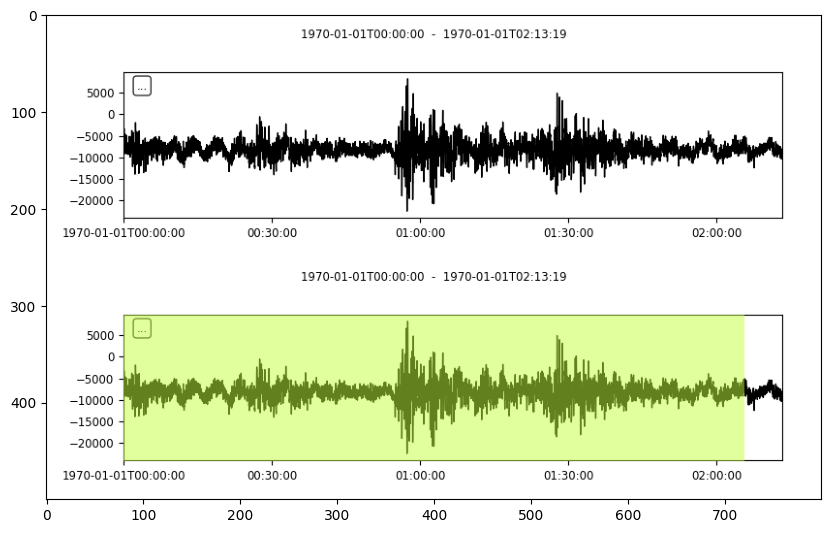

dataset8k_v4/class6/original/201907_21_59__TVSB.BHZ.KO_original.sac
1/1 [==============================] - 0s 20ms/step


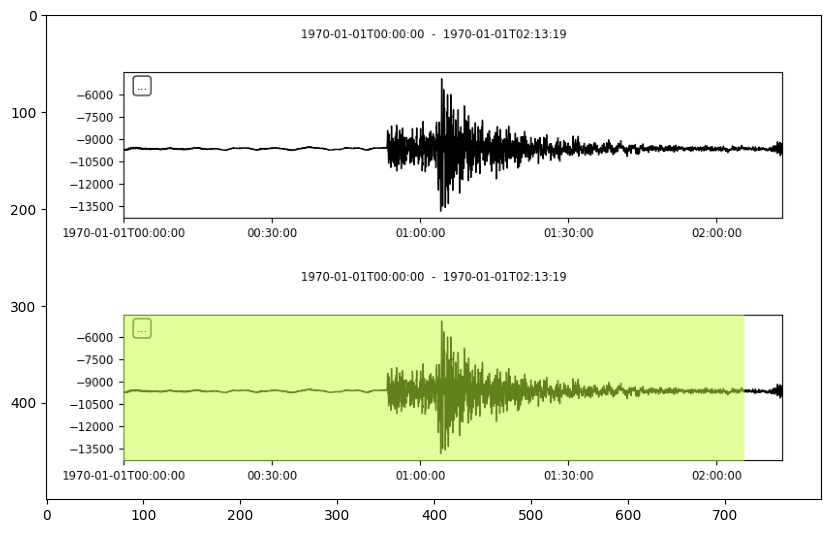

dataset8k_v4/class6/original/202008_20_47__MDNY.BHZ.KO_original.sac
1/1 [==============================] - 0s 21ms/step


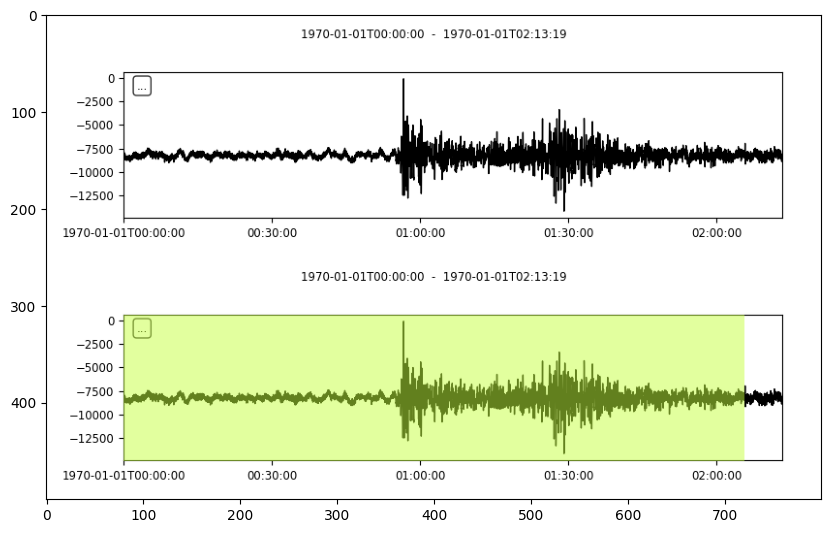

dataset8k_v4/class6/original/202205_9_60__GEDZ.BHZ.KO_original.sac
1/1 [==============================] - 0s 22ms/step


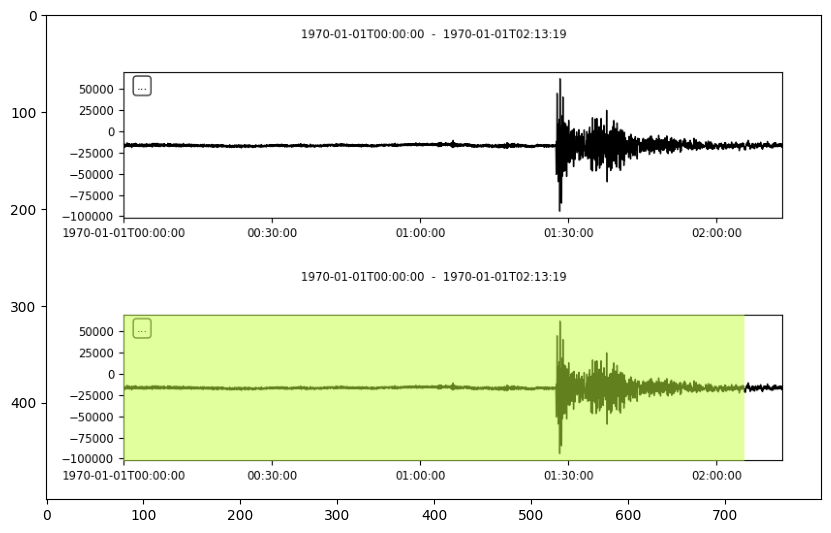

dataset8k_v4/class6/original/202111_8_47__GEDZ.BHZ.KO_original.sac
1/1 [==============================] - 0s 20ms/step


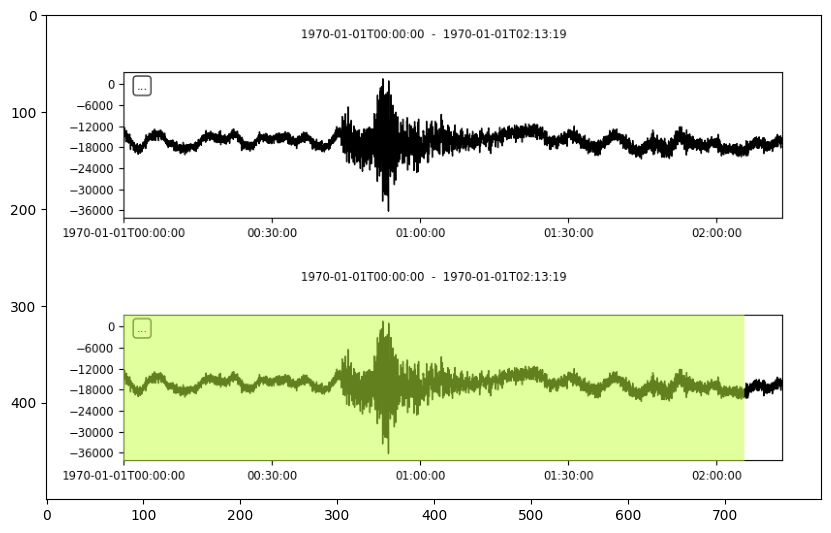

dataset8k_v4/class6/original/201907_23_10__GEDZ.BHZ.KO_original.sac
1/1 [==============================] - 0s 21ms/step


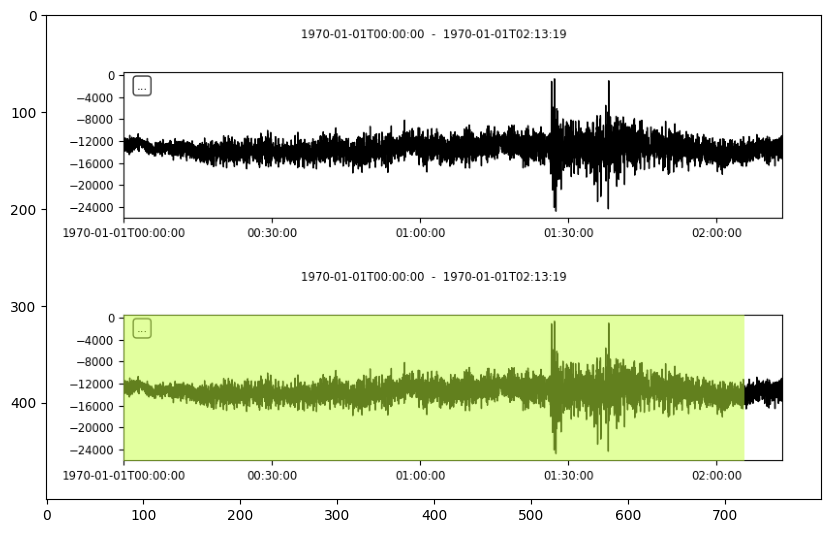

dataset8k_v4/class6/original/202201_10_123__MDNY.BHZ.KO_original.sac


2023-06-21 19:34:32.317575: I tensorflow/core/common_runtime/executor.cc:1197] [/job:localhost/replica:0/task:0/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: Matrix size-incompatible: In[0]: [1,4632], In[1]: [3984,8]
	 [[{{node sequential/dense/Relu}}]]


InvalidArgumentError: Graph execution error:

Detected at node 'sequential/dense/Relu' defined at (most recent call last):
    File "/usr/lib/python3.10/runpy.py", line 196, in _run_module_as_main
      return _run_code(code, main_globals, None,
    File "/usr/lib/python3.10/runpy.py", line 86, in _run_code
      exec(code, run_globals)
    File "/home/mbulucay/.local/lib/python3.10/site-packages/ipykernel_launcher.py", line 17, in <module>
      app.launch_new_instance()
    File "/home/mbulucay/.local/lib/python3.10/site-packages/traitlets/config/application.py", line 1043, in launch_instance
      app.start()
    File "/home/mbulucay/.local/lib/python3.10/site-packages/ipykernel/kernelapp.py", line 725, in start
      self.io_loop.start()
    File "/home/mbulucay/.local/lib/python3.10/site-packages/tornado/platform/asyncio.py", line 215, in start
      self.asyncio_loop.run_forever()
    File "/usr/lib/python3.10/asyncio/base_events.py", line 600, in run_forever
      self._run_once()
    File "/usr/lib/python3.10/asyncio/base_events.py", line 1896, in _run_once
      handle._run()
    File "/usr/lib/python3.10/asyncio/events.py", line 80, in _run
      self._context.run(self._callback, *self._args)
    File "/home/mbulucay/.local/lib/python3.10/site-packages/ipykernel/kernelbase.py", line 513, in dispatch_queue
      await self.process_one()
    File "/home/mbulucay/.local/lib/python3.10/site-packages/ipykernel/kernelbase.py", line 502, in process_one
      await dispatch(*args)
    File "/home/mbulucay/.local/lib/python3.10/site-packages/ipykernel/kernelbase.py", line 409, in dispatch_shell
      await result
    File "/home/mbulucay/.local/lib/python3.10/site-packages/ipykernel/kernelbase.py", line 729, in execute_request
      reply_content = await reply_content
    File "/home/mbulucay/.local/lib/python3.10/site-packages/ipykernel/ipkernel.py", line 422, in do_execute
      res = shell.run_cell(
    File "/home/mbulucay/.local/lib/python3.10/site-packages/ipykernel/zmqshell.py", line 540, in run_cell
      return super().run_cell(*args, **kwargs)
    File "/home/mbulucay/.local/lib/python3.10/site-packages/IPython/core/interactiveshell.py", line 2961, in run_cell
      result = self._run_cell(
    File "/home/mbulucay/.local/lib/python3.10/site-packages/IPython/core/interactiveshell.py", line 3016, in _run_cell
      result = runner(coro)
    File "/home/mbulucay/.local/lib/python3.10/site-packages/IPython/core/async_helpers.py", line 129, in _pseudo_sync_runner
      coro.send(None)
    File "/home/mbulucay/.local/lib/python3.10/site-packages/IPython/core/interactiveshell.py", line 3221, in run_cell_async
      has_raised = await self.run_ast_nodes(code_ast.body, cell_name,
    File "/home/mbulucay/.local/lib/python3.10/site-packages/IPython/core/interactiveshell.py", line 3400, in run_ast_nodes
      if await self.run_code(code, result, async_=asy):
    File "/home/mbulucay/.local/lib/python3.10/site-packages/IPython/core/interactiveshell.py", line 3460, in run_code
      exec(code_obj, self.user_global_ns, self.user_ns)
    File "/tmp/ipykernel_11488/3173068241.py", line 16, in <module>
      trace, pred, p_l = colorize(path, divide_number = 80)
    File "/tmp/ipykernel_11488/1633683786.py", line 19, in colorize
      t_pred = model.predict(predict_data)
    File "/usr/local/lib/python3.10/dist-packages/keras/utils/traceback_utils.py", line 65, in error_handler
      return fn(*args, **kwargs)
    File "/usr/local/lib/python3.10/dist-packages/keras/engine/training.py", line 2382, in predict
      tmp_batch_outputs = self.predict_function(iterator)
    File "/usr/local/lib/python3.10/dist-packages/keras/engine/training.py", line 2169, in predict_function
      return step_function(self, iterator)
    File "/usr/local/lib/python3.10/dist-packages/keras/engine/training.py", line 2155, in step_function
      outputs = model.distribute_strategy.run(run_step, args=(data,))
    File "/usr/local/lib/python3.10/dist-packages/keras/engine/training.py", line 2143, in run_step
      outputs = model.predict_step(data)
    File "/usr/local/lib/python3.10/dist-packages/keras/engine/training.py", line 2111, in predict_step
      return self(x, training=False)
    File "/usr/local/lib/python3.10/dist-packages/keras/utils/traceback_utils.py", line 65, in error_handler
      return fn(*args, **kwargs)
    File "/usr/local/lib/python3.10/dist-packages/keras/engine/training.py", line 558, in __call__
      return super().__call__(*args, **kwargs)
    File "/usr/local/lib/python3.10/dist-packages/keras/utils/traceback_utils.py", line 65, in error_handler
      return fn(*args, **kwargs)
    File "/usr/local/lib/python3.10/dist-packages/keras/engine/base_layer.py", line 1145, in __call__
      outputs = call_fn(inputs, *args, **kwargs)
    File "/usr/local/lib/python3.10/dist-packages/keras/utils/traceback_utils.py", line 96, in error_handler
      return fn(*args, **kwargs)
    File "/usr/local/lib/python3.10/dist-packages/keras/engine/sequential.py", line 412, in call
      return super().call(inputs, training=training, mask=mask)
    File "/usr/local/lib/python3.10/dist-packages/keras/engine/functional.py", line 512, in call
      return self._run_internal_graph(inputs, training=training, mask=mask)
    File "/usr/local/lib/python3.10/dist-packages/keras/engine/functional.py", line 669, in _run_internal_graph
      outputs = node.layer(*args, **kwargs)
    File "/usr/local/lib/python3.10/dist-packages/keras/utils/traceback_utils.py", line 65, in error_handler
      return fn(*args, **kwargs)
    File "/usr/local/lib/python3.10/dist-packages/keras/engine/base_layer.py", line 1145, in __call__
      outputs = call_fn(inputs, *args, **kwargs)
    File "/usr/local/lib/python3.10/dist-packages/keras/utils/traceback_utils.py", line 96, in error_handler
      return fn(*args, **kwargs)
    File "/usr/local/lib/python3.10/dist-packages/keras/layers/core/dense.py", line 255, in call
      outputs = self.activation(outputs)
    File "/usr/local/lib/python3.10/dist-packages/keras/activations.py", line 317, in relu
      return backend.relu(
    File "/usr/local/lib/python3.10/dist-packages/keras/backend.py", line 5396, in relu
      x = tf.nn.relu(x)
Node: 'sequential/dense/Relu'
Matrix size-incompatible: In[0]: [1,4632], In[1]: [3984,8]
	 [[{{node sequential/dense/Relu}}]] [Op:__inference_predict_function_406118]

In [63]:
for trace_file in original_trace_file_list[64:]:
    path = os.path.join(dataset, original_class_folder, trace_file) 
    print(path)
    trace, pred, p_l = colorize(path, divide_number = 80)
    x = input("Press Enter to continue...")
    if x == 'q':
        break
    elif x == 's':
        # copy the file to another folder
        trace.write("./dataset/" + trace_file, format="SAC")


dataset8k_v4/class6/original/201910_18_1__KLYT.BHZ.KO_original.sac
1/1 [==============================] - 0s 20ms/step


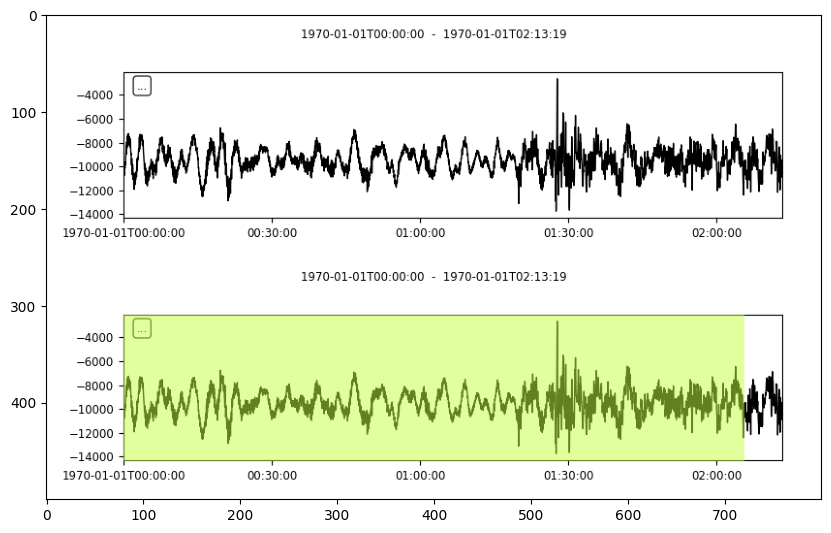

dataset8k_v4/class6/original/202005_9_105__GULT.BHZ.KO_original.sac
1/1 [==============================] - 0s 21ms/step


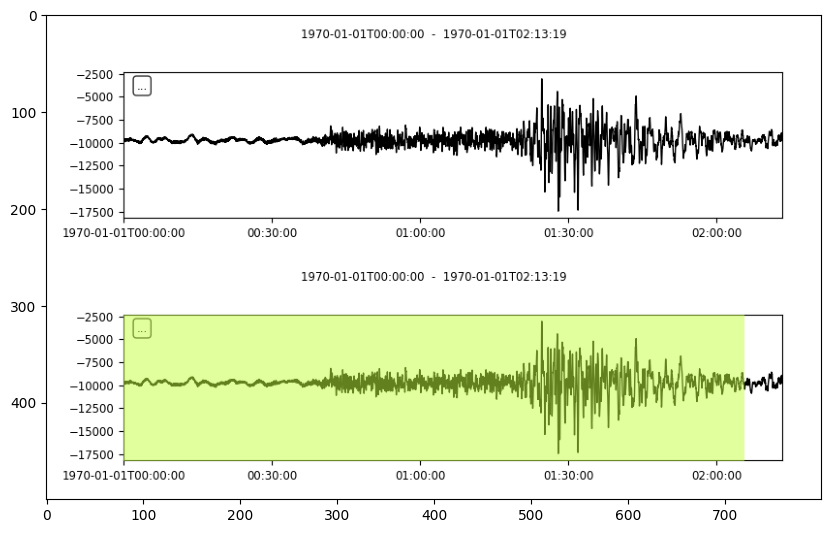

dataset8k_v4/class6/original/201903_13_41__GEDZ.BHZ.KO_original.sac
1/1 [==============================] - 0s 26ms/step


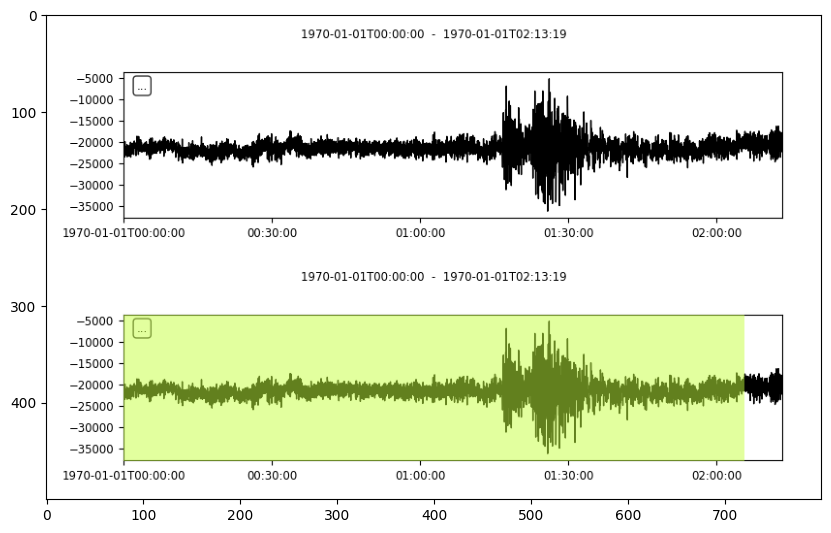

dataset8k_v4/class6/original/202004_0_0__SIMA.BHZ.KO_original.sac
1/1 [==============================] - 0s 21ms/step


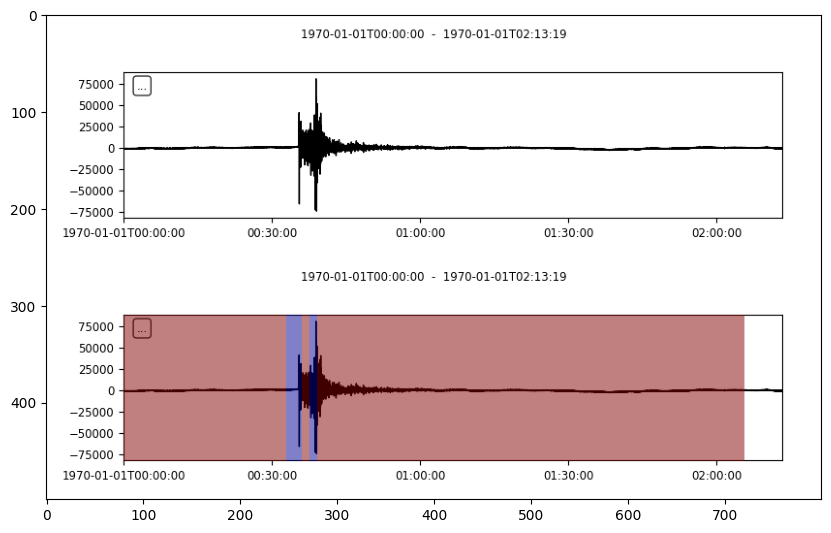

dataset8k_v4/class6/original/202009_21_0__SIMA.BHZ.KO_original.sac
1/1 [==============================] - 0s 21ms/step


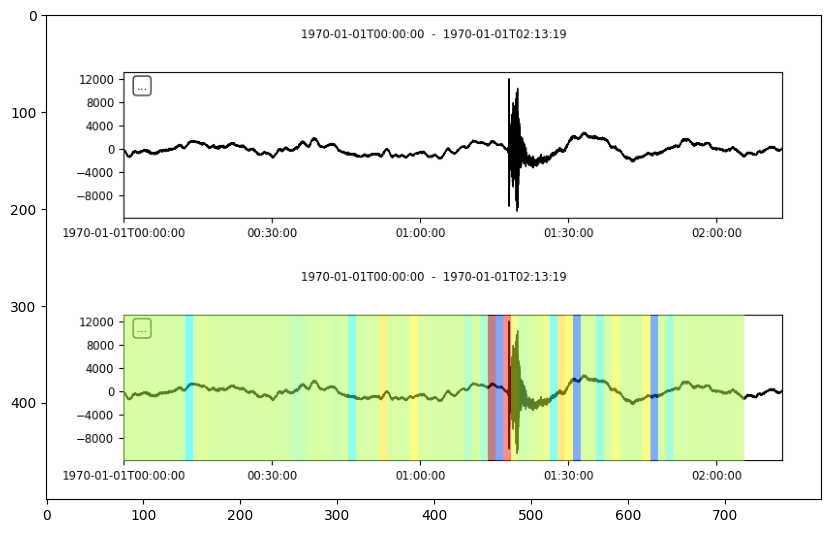

dataset8k_v4/class6/original/201901_13_0__SIMA.BHZ.KO_original.sac
1/1 [==============================] - 0s 20ms/step


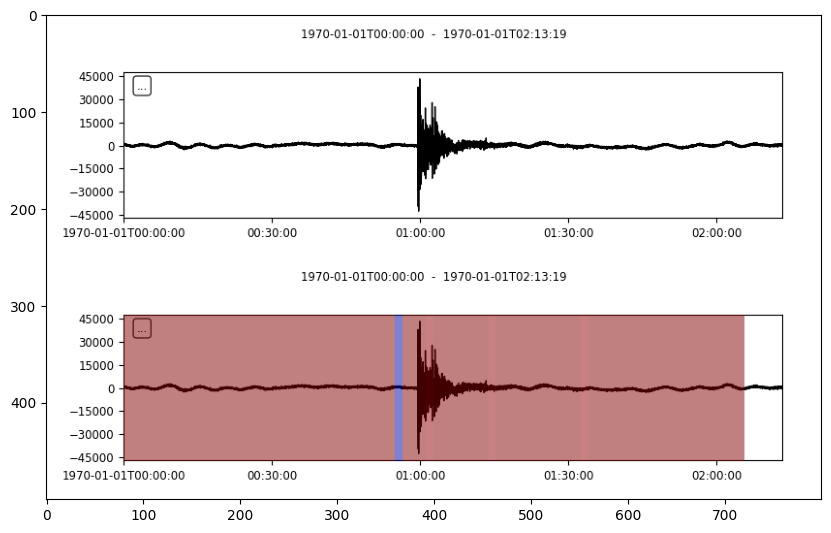

dataset8k_v4/class6/original/202102_8_34__GEDZ.BHZ.KO_original.sac
1/1 [==============================] - 0s 21ms/step


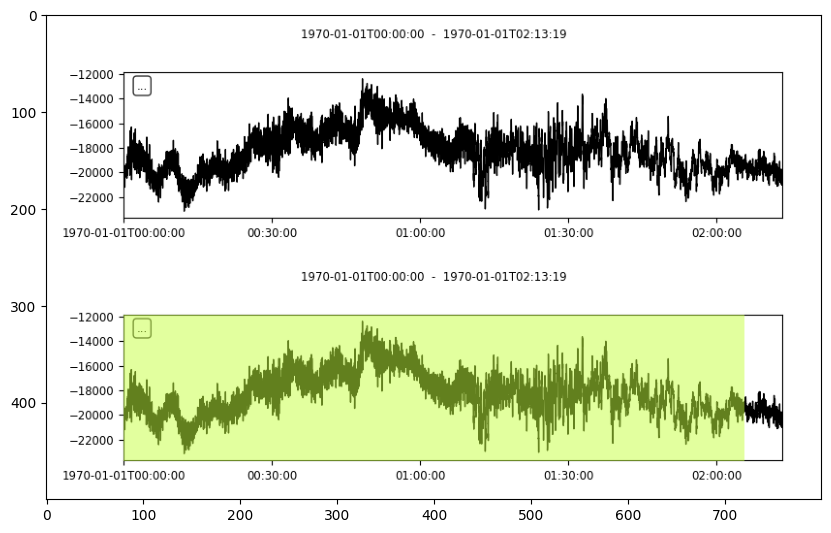

dataset8k_v4/class6/original/201910_19_120__GULT.BHZ.KO_original.sac
1/1 [==============================] - 0s 21ms/step


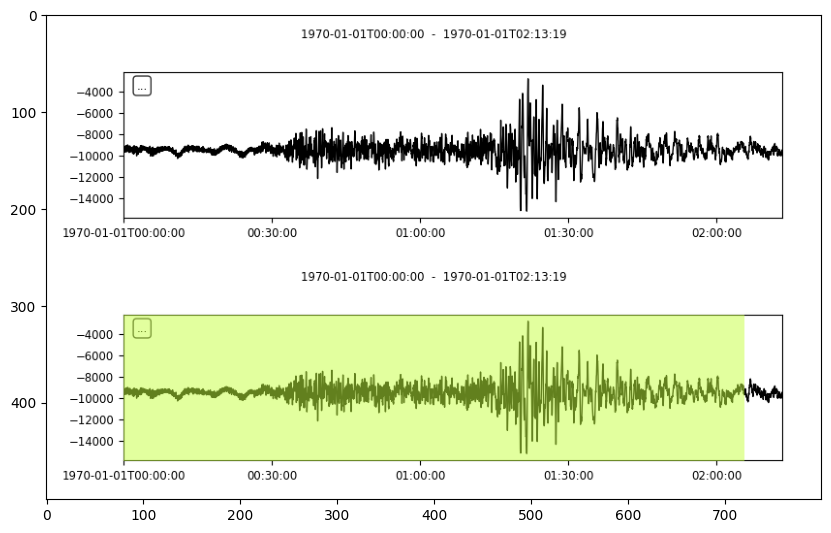

dataset8k_v4/class6/original/202004_12_52__GEDZ.BHZ.KO_original.sac
1/1 [==============================] - 0s 22ms/step


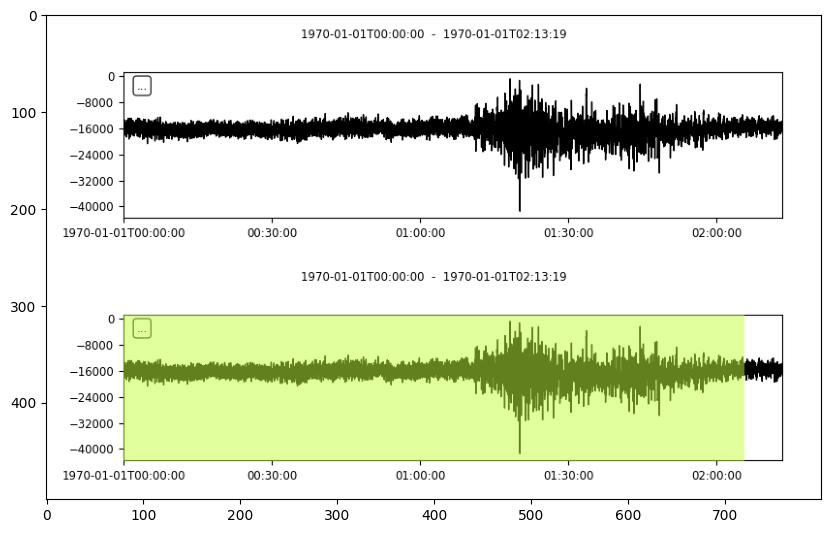

dataset8k_v4/class6/original/202207_0_35__GEDZ.BHZ.KO_original.sac
1/1 [==============================] - 0s 21ms/step


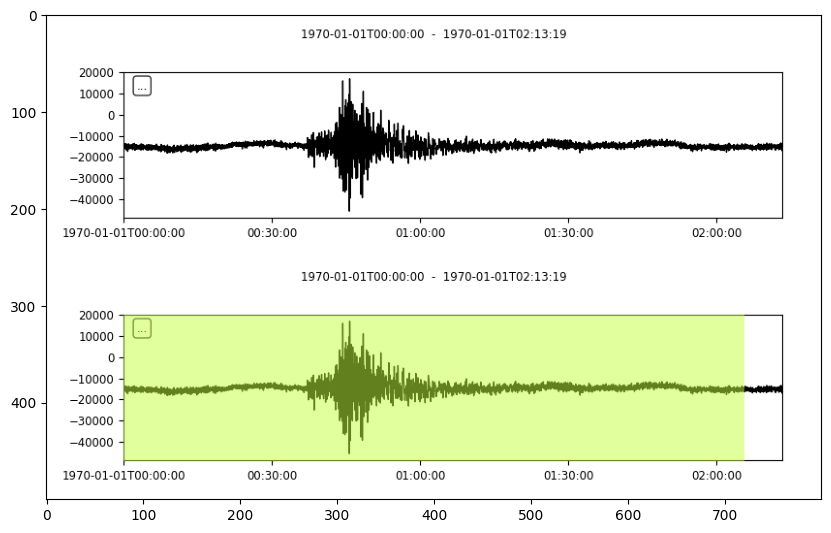

dataset8k_v4/class6/original/201908_12_36__GEDZ.BHZ.KO_original.sac
1/1 [==============================] - 0s 21ms/step


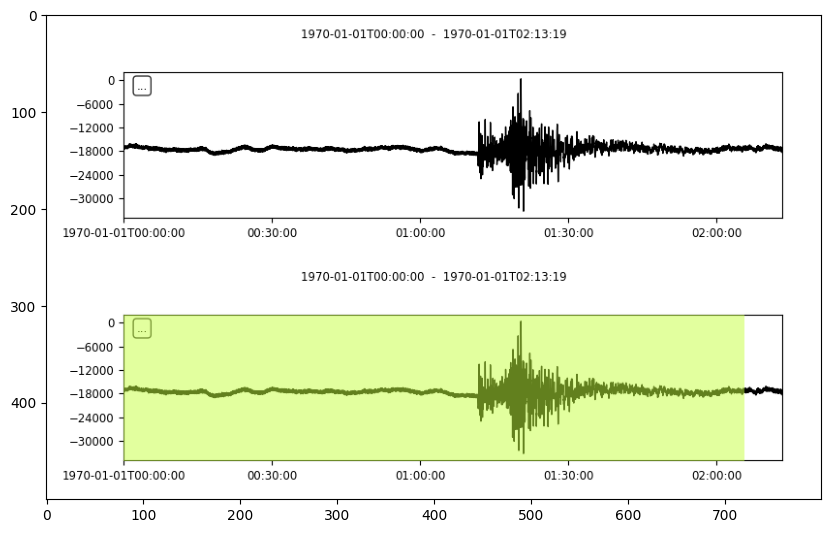

dataset8k_v4/class6/original/202010_37_0__SIMA.BHZ.KO_original.sac
1/1 [==============================] - 0s 21ms/step


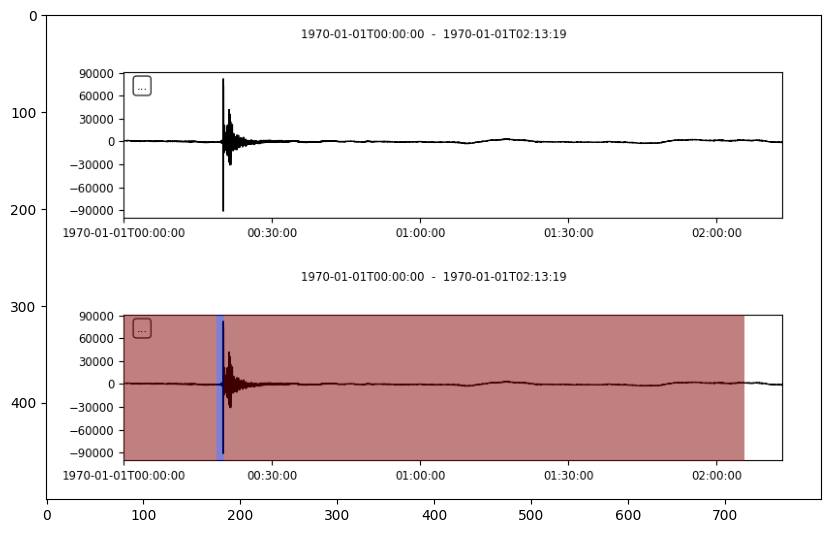

dataset8k_v4/class6/original/201912_15_35__GEDZ.BHZ.KO_original.sac
1/1 [==============================] - 0s 25ms/step


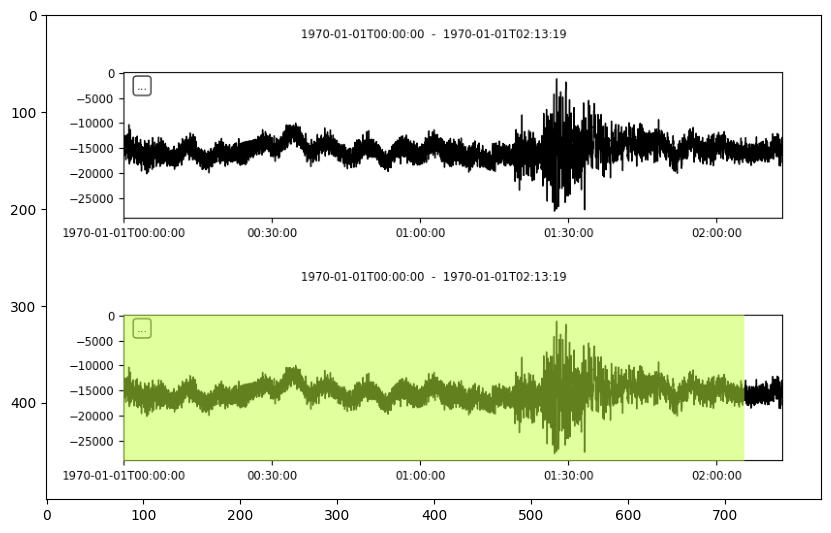

dataset8k_v4/class6/original/201907_16_10__GEDZ.BHZ.KO_original.sac


2023-06-21 19:37:37.737417: I tensorflow/core/common_runtime/executor.cc:1197] [/job:localhost/replica:0/task:0/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: Matrix size-incompatible: In[0]: [1,4632], In[1]: [3984,8]
	 [[{{node sequential/dense/Relu}}]]


InvalidArgumentError: Graph execution error:

Detected at node 'sequential/dense/Relu' defined at (most recent call last):
    File "/usr/lib/python3.10/runpy.py", line 196, in _run_module_as_main
      return _run_code(code, main_globals, None,
    File "/usr/lib/python3.10/runpy.py", line 86, in _run_code
      exec(code, run_globals)
    File "/home/mbulucay/.local/lib/python3.10/site-packages/ipykernel_launcher.py", line 17, in <module>
      app.launch_new_instance()
    File "/home/mbulucay/.local/lib/python3.10/site-packages/traitlets/config/application.py", line 1043, in launch_instance
      app.start()
    File "/home/mbulucay/.local/lib/python3.10/site-packages/ipykernel/kernelapp.py", line 725, in start
      self.io_loop.start()
    File "/home/mbulucay/.local/lib/python3.10/site-packages/tornado/platform/asyncio.py", line 215, in start
      self.asyncio_loop.run_forever()
    File "/usr/lib/python3.10/asyncio/base_events.py", line 600, in run_forever
      self._run_once()
    File "/usr/lib/python3.10/asyncio/base_events.py", line 1896, in _run_once
      handle._run()
    File "/usr/lib/python3.10/asyncio/events.py", line 80, in _run
      self._context.run(self._callback, *self._args)
    File "/home/mbulucay/.local/lib/python3.10/site-packages/ipykernel/kernelbase.py", line 513, in dispatch_queue
      await self.process_one()
    File "/home/mbulucay/.local/lib/python3.10/site-packages/ipykernel/kernelbase.py", line 502, in process_one
      await dispatch(*args)
    File "/home/mbulucay/.local/lib/python3.10/site-packages/ipykernel/kernelbase.py", line 409, in dispatch_shell
      await result
    File "/home/mbulucay/.local/lib/python3.10/site-packages/ipykernel/kernelbase.py", line 729, in execute_request
      reply_content = await reply_content
    File "/home/mbulucay/.local/lib/python3.10/site-packages/ipykernel/ipkernel.py", line 422, in do_execute
      res = shell.run_cell(
    File "/home/mbulucay/.local/lib/python3.10/site-packages/ipykernel/zmqshell.py", line 540, in run_cell
      return super().run_cell(*args, **kwargs)
    File "/home/mbulucay/.local/lib/python3.10/site-packages/IPython/core/interactiveshell.py", line 2961, in run_cell
      result = self._run_cell(
    File "/home/mbulucay/.local/lib/python3.10/site-packages/IPython/core/interactiveshell.py", line 3016, in _run_cell
      result = runner(coro)
    File "/home/mbulucay/.local/lib/python3.10/site-packages/IPython/core/async_helpers.py", line 129, in _pseudo_sync_runner
      coro.send(None)
    File "/home/mbulucay/.local/lib/python3.10/site-packages/IPython/core/interactiveshell.py", line 3221, in run_cell_async
      has_raised = await self.run_ast_nodes(code_ast.body, cell_name,
    File "/home/mbulucay/.local/lib/python3.10/site-packages/IPython/core/interactiveshell.py", line 3400, in run_ast_nodes
      if await self.run_code(code, result, async_=asy):
    File "/home/mbulucay/.local/lib/python3.10/site-packages/IPython/core/interactiveshell.py", line 3460, in run_code
      exec(code_obj, self.user_global_ns, self.user_ns)
    File "/tmp/ipykernel_11488/3173068241.py", line 16, in <module>
      trace, pred, p_l = colorize(path, divide_number = 80)
    File "/tmp/ipykernel_11488/1633683786.py", line 19, in colorize
      t_pred = model.predict(predict_data)
    File "/usr/local/lib/python3.10/dist-packages/keras/utils/traceback_utils.py", line 65, in error_handler
      return fn(*args, **kwargs)
    File "/usr/local/lib/python3.10/dist-packages/keras/engine/training.py", line 2382, in predict
      tmp_batch_outputs = self.predict_function(iterator)
    File "/usr/local/lib/python3.10/dist-packages/keras/engine/training.py", line 2169, in predict_function
      return step_function(self, iterator)
    File "/usr/local/lib/python3.10/dist-packages/keras/engine/training.py", line 2155, in step_function
      outputs = model.distribute_strategy.run(run_step, args=(data,))
    File "/usr/local/lib/python3.10/dist-packages/keras/engine/training.py", line 2143, in run_step
      outputs = model.predict_step(data)
    File "/usr/local/lib/python3.10/dist-packages/keras/engine/training.py", line 2111, in predict_step
      return self(x, training=False)
    File "/usr/local/lib/python3.10/dist-packages/keras/utils/traceback_utils.py", line 65, in error_handler
      return fn(*args, **kwargs)
    File "/usr/local/lib/python3.10/dist-packages/keras/engine/training.py", line 558, in __call__
      return super().__call__(*args, **kwargs)
    File "/usr/local/lib/python3.10/dist-packages/keras/utils/traceback_utils.py", line 65, in error_handler
      return fn(*args, **kwargs)
    File "/usr/local/lib/python3.10/dist-packages/keras/engine/base_layer.py", line 1145, in __call__
      outputs = call_fn(inputs, *args, **kwargs)
    File "/usr/local/lib/python3.10/dist-packages/keras/utils/traceback_utils.py", line 96, in error_handler
      return fn(*args, **kwargs)
    File "/usr/local/lib/python3.10/dist-packages/keras/engine/sequential.py", line 412, in call
      return super().call(inputs, training=training, mask=mask)
    File "/usr/local/lib/python3.10/dist-packages/keras/engine/functional.py", line 512, in call
      return self._run_internal_graph(inputs, training=training, mask=mask)
    File "/usr/local/lib/python3.10/dist-packages/keras/engine/functional.py", line 669, in _run_internal_graph
      outputs = node.layer(*args, **kwargs)
    File "/usr/local/lib/python3.10/dist-packages/keras/utils/traceback_utils.py", line 65, in error_handler
      return fn(*args, **kwargs)
    File "/usr/local/lib/python3.10/dist-packages/keras/engine/base_layer.py", line 1145, in __call__
      outputs = call_fn(inputs, *args, **kwargs)
    File "/usr/local/lib/python3.10/dist-packages/keras/utils/traceback_utils.py", line 96, in error_handler
      return fn(*args, **kwargs)
    File "/usr/local/lib/python3.10/dist-packages/keras/layers/core/dense.py", line 255, in call
      outputs = self.activation(outputs)
    File "/usr/local/lib/python3.10/dist-packages/keras/activations.py", line 317, in relu
      return backend.relu(
    File "/usr/local/lib/python3.10/dist-packages/keras/backend.py", line 5396, in relu
      x = tf.nn.relu(x)
Node: 'sequential/dense/Relu'
Matrix size-incompatible: In[0]: [1,4632], In[1]: [3984,8]
	 [[{{node sequential/dense/Relu}}]] [Op:__inference_predict_function_406118]

In [64]:
for trace_file in original_trace_file_list[103:]:
    path = os.path.join(dataset, original_class_folder, trace_file) 
    print(path)
    trace, pred, p_l = colorize(path, divide_number = 80)
    x = input("Press Enter to continue...")
    if x == 'q':
        break
    elif x == 's':
        # copy the file to another folder
        trace.write("./dataset/" + trace_file, format="SAC")


dataset8k_v4/class6/original/201911_14_0__SIMA.BHZ.KO_original.sac
1/1 [==============================] - 0s 20ms/step


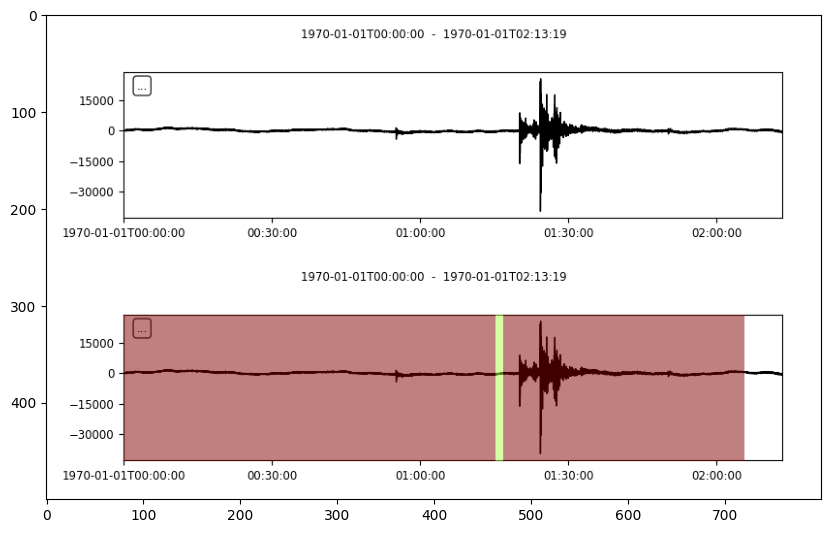

dataset8k_v4/class6/original/202201_0_181__GULT.BHZ.KO_original.sac
1/1 [==============================] - 0s 21ms/step


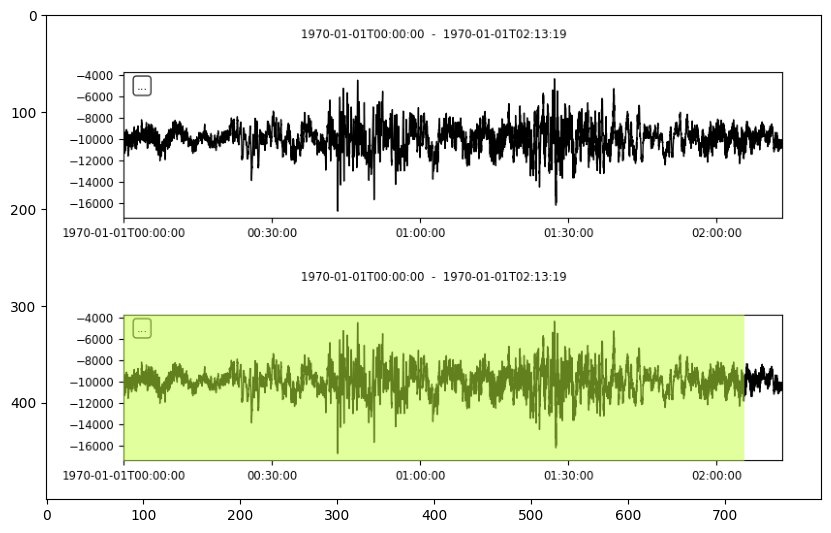

dataset8k_v4/class6/original/201907_13_0__SIMA.BHZ.KO_original.sac
1/1 [==============================] - 0s 20ms/step


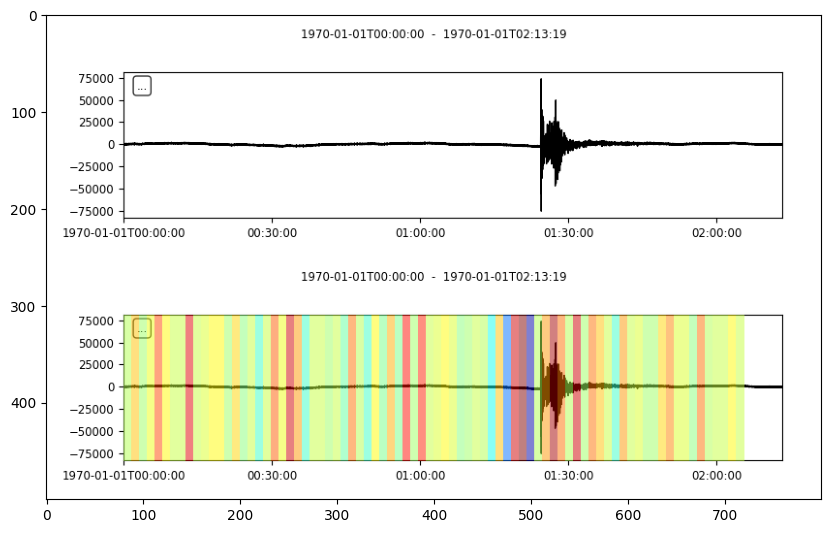

dataset8k_v4/class6/original/201902_1_147__MDNY.BHZ.KO_original.sac
1/1 [==============================] - 0s 17ms/step


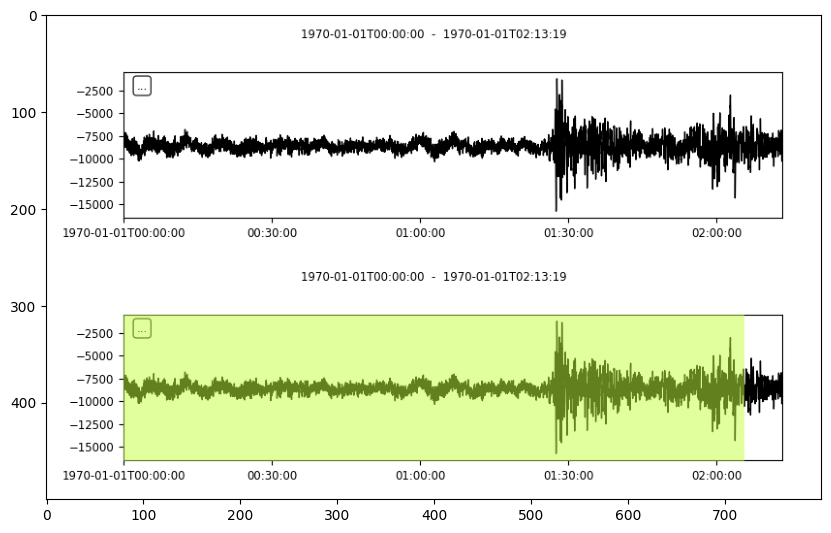

dataset8k_v4/class6/original/201908_7_11__SIMA.BHZ.KO_original.sac
1/1 [==============================] - 0s 19ms/step


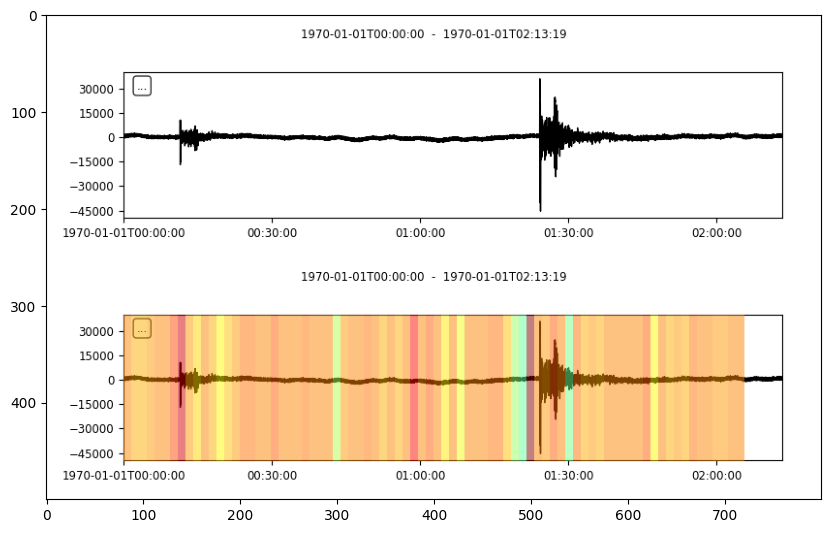

dataset8k_v4/class6/original/202005_10_3__SIMA.BHZ.KO_original.sac
1/1 [==============================] - 0s 21ms/step


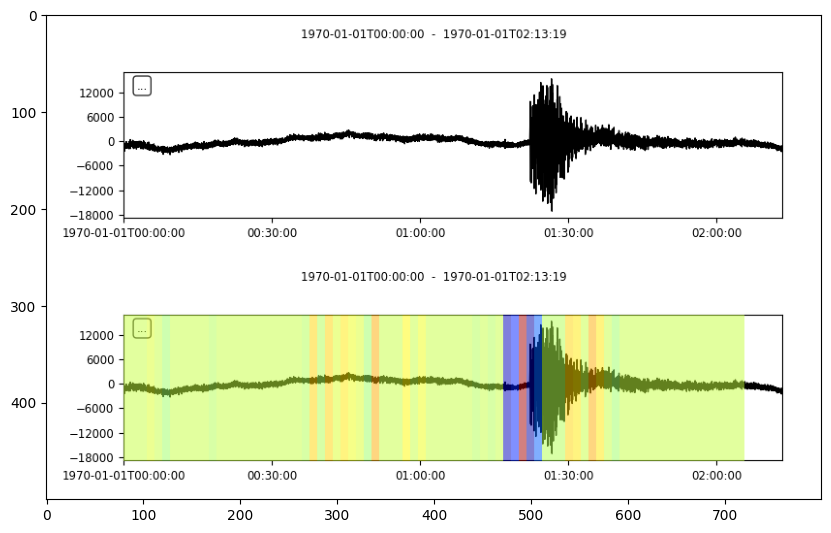

dataset8k_v4/class6/original/202002_16_2__SIMA.BHZ.KO_original.sac
1/1 [==============================] - 0s 26ms/step


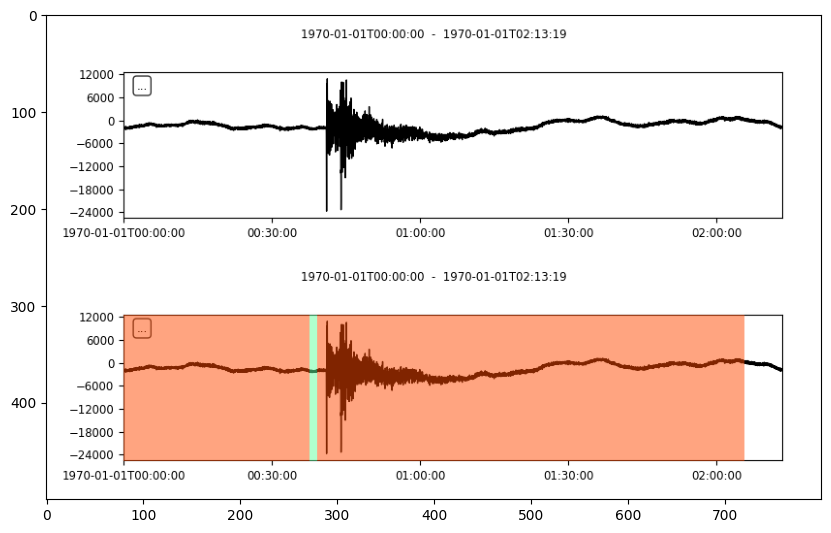

dataset8k_v4/class6/original/202005_14_28__GEDZ.BHZ.KO_original.sac
1/1 [==============================] - 0s 20ms/step


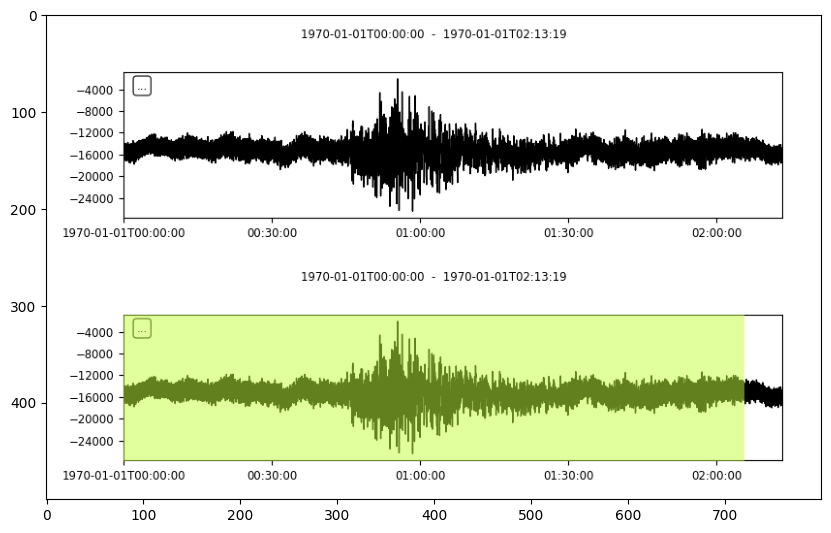

dataset8k_v4/class6/original/202003_19_65__MDNY.BHZ.KO_original.sac
1/1 [==============================] - 0s 26ms/step


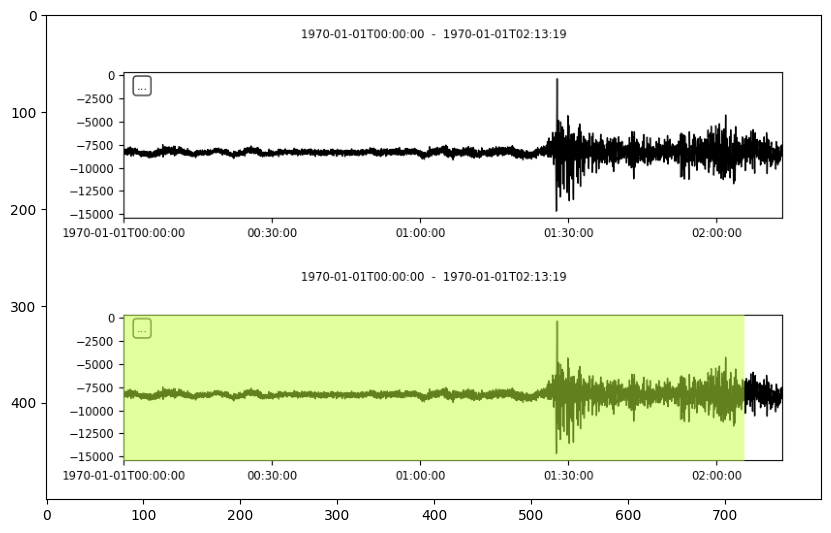

dataset8k_v4/class6/original/202002_23_30__GEDZ.BHZ.KO_original.sac
1/1 [==============================] - 0s 20ms/step


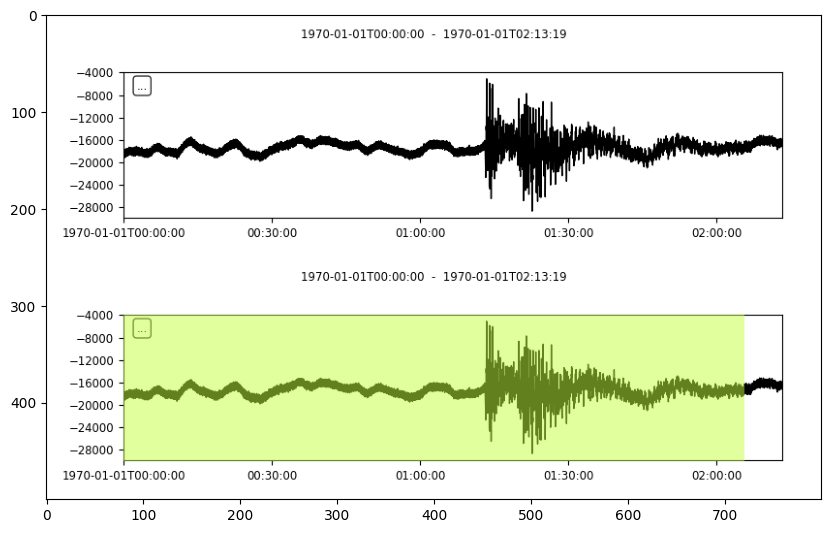

dataset8k_v4/class6/original/202006_9_0__SIMA.BHZ.KO_original.sac
1/1 [==============================] - 0s 21ms/step


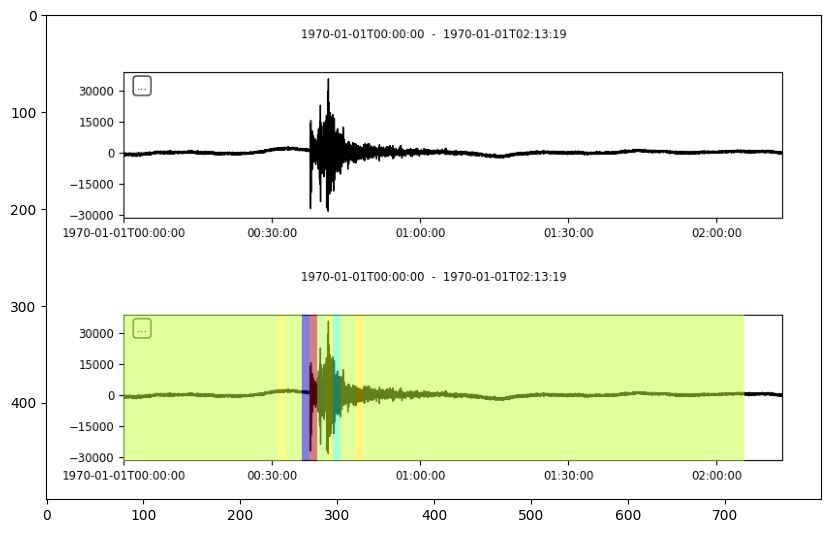

dataset8k_v4/class6/original/202008_10_73__EDC.BHZ.KO_original.sac
1/1 [==============================] - 0s 20ms/step


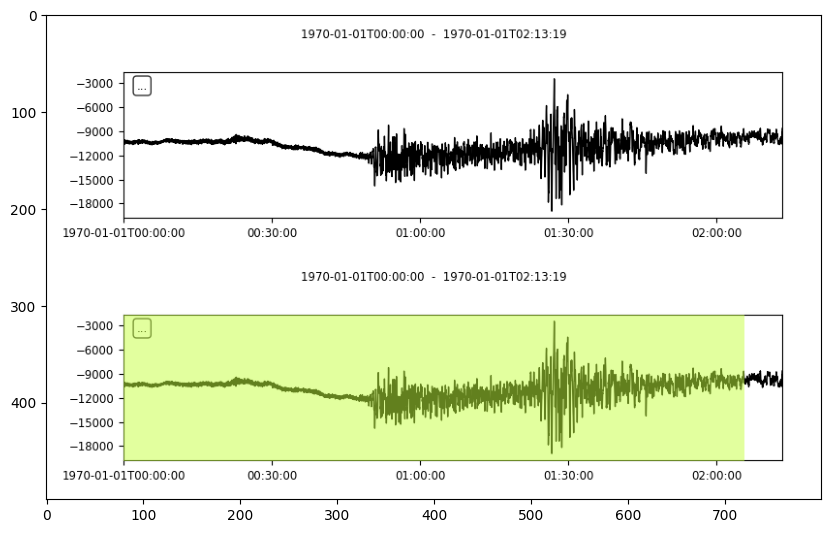

dataset8k_v4/class6/original/202005_20_55__SHUT.BHZ.KO_original.sac
1/1 [==============================] - 0s 19ms/step


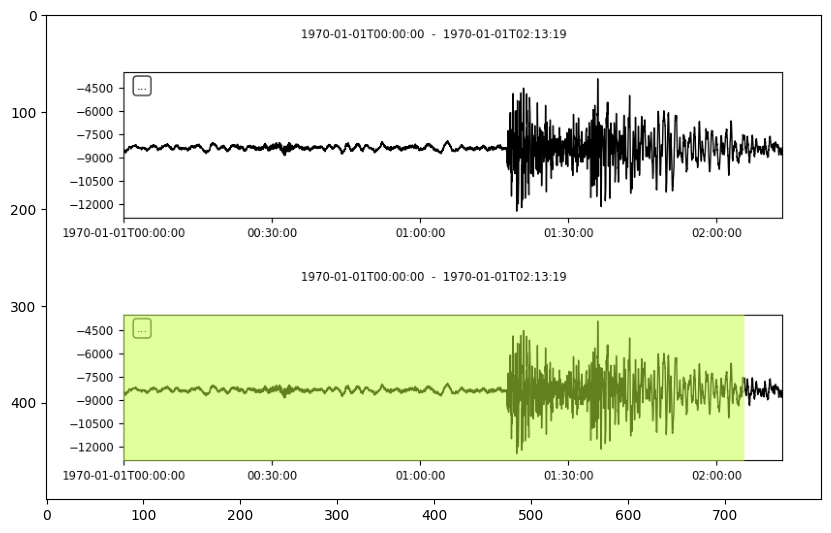

dataset8k_v4/class6/original/202008_10_0__BALB.BHZ.KO_original.sac
1/1 [==============================] - 0s 20ms/step


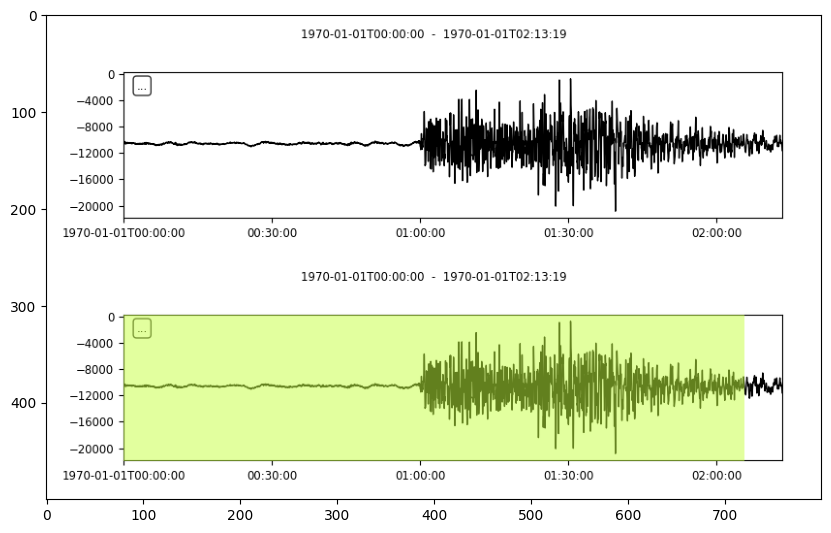

dataset8k_v4/class6/original/201911_8_0__SIMA.BHZ.KO_original.sac
1/1 [==============================] - 0s 19ms/step


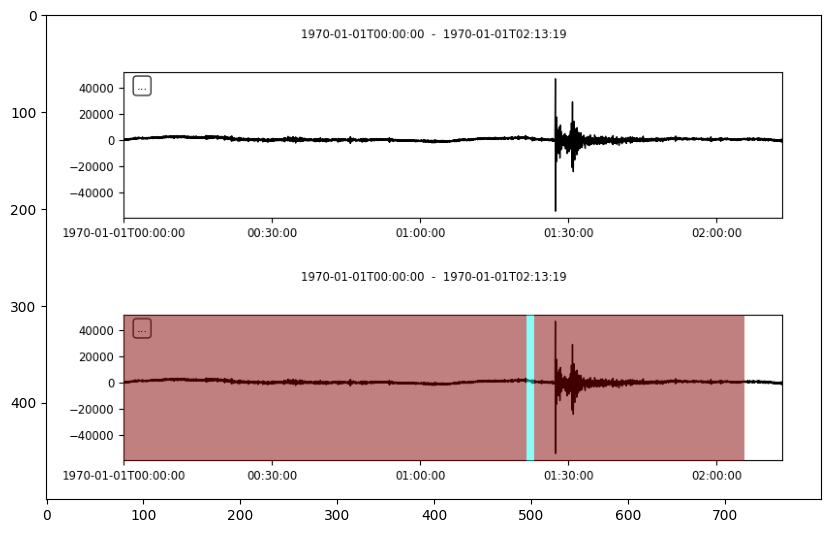

dataset8k_v4/class6/original/201904_11_0__SIMA.BHZ.KO_original.sac
1/1 [==============================] - 0s 20ms/step


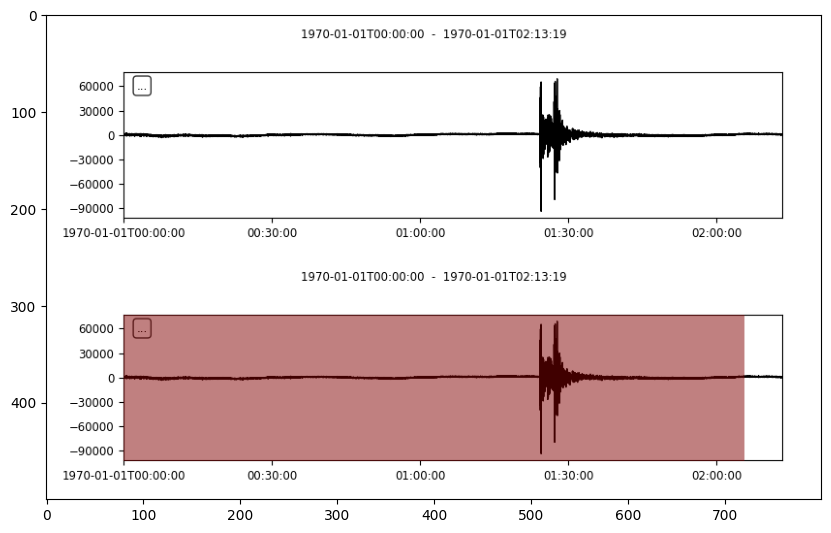

dataset8k_v4/class6/original/202002_19_0__SIMA.BHZ.KO_original.sac
1/1 [==============================] - 0s 20ms/step


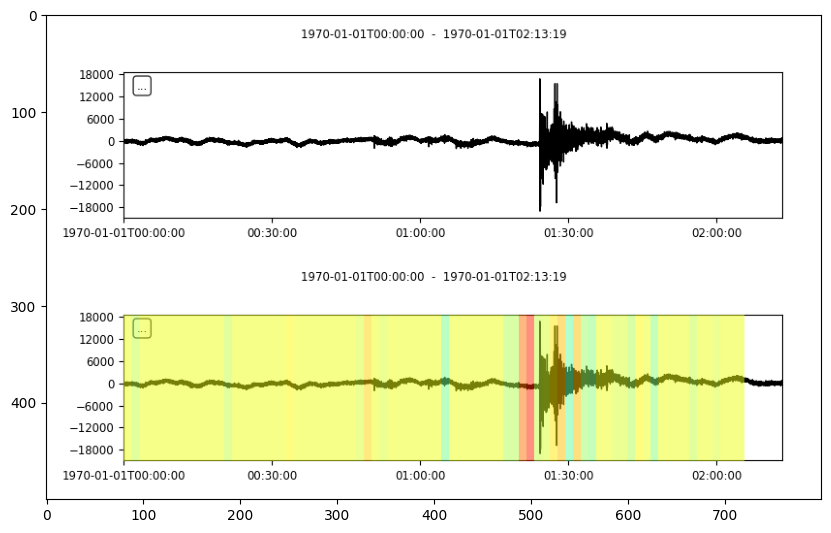

dataset8k_v4/class6/original/202009_12_2__SIMA.BHZ.KO_original.sac
1/1 [==============================] - 0s 20ms/step


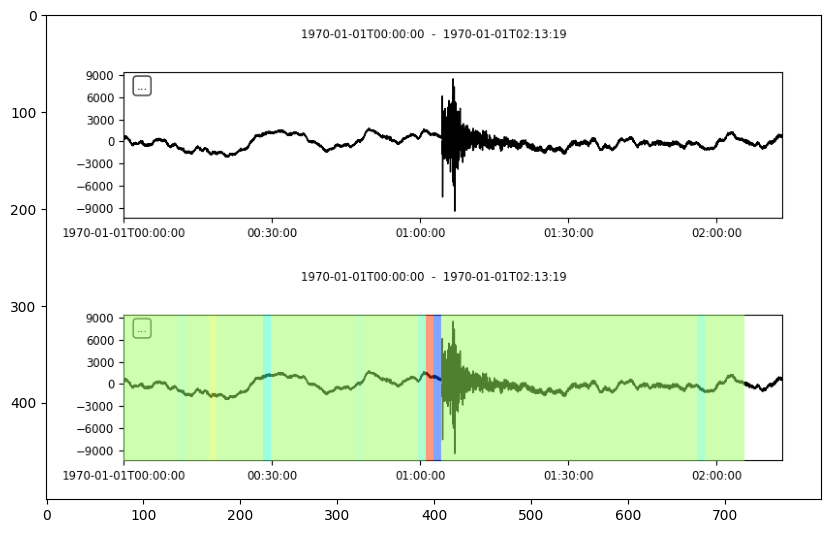

dataset8k_v4/class6/original/202006_10_2__SIMA.BHZ.KO_original.sac
1/1 [==============================] - 0s 20ms/step


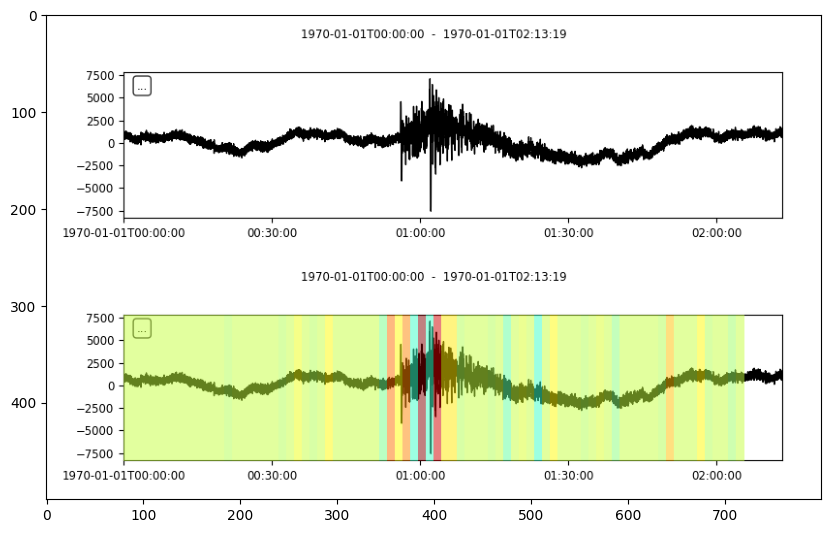

dataset8k_v4/class6/original/202004_17_26__GEDZ.BHZ.KO_original.sac
1/1 [==============================] - 0s 19ms/step


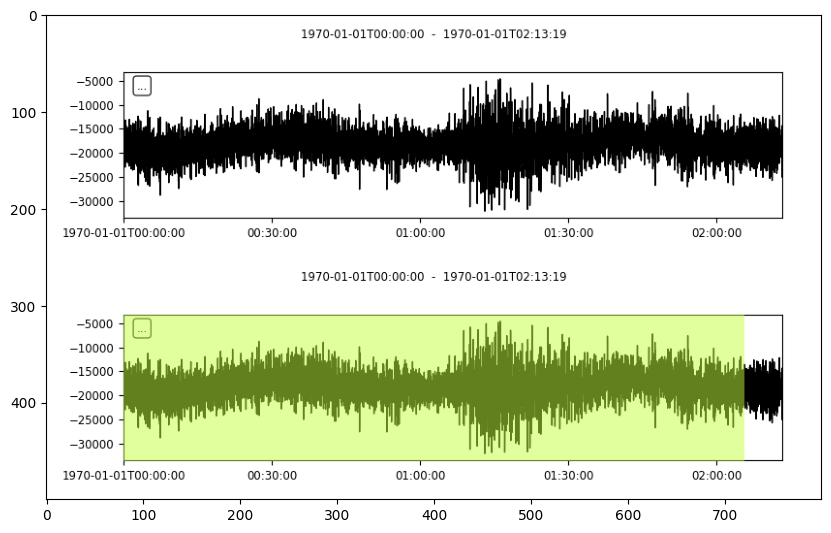

dataset8k_v4/class6/original/201910_19_76__TVSB.BHZ.KO_original.sac
1/1 [==============================] - 0s 21ms/step


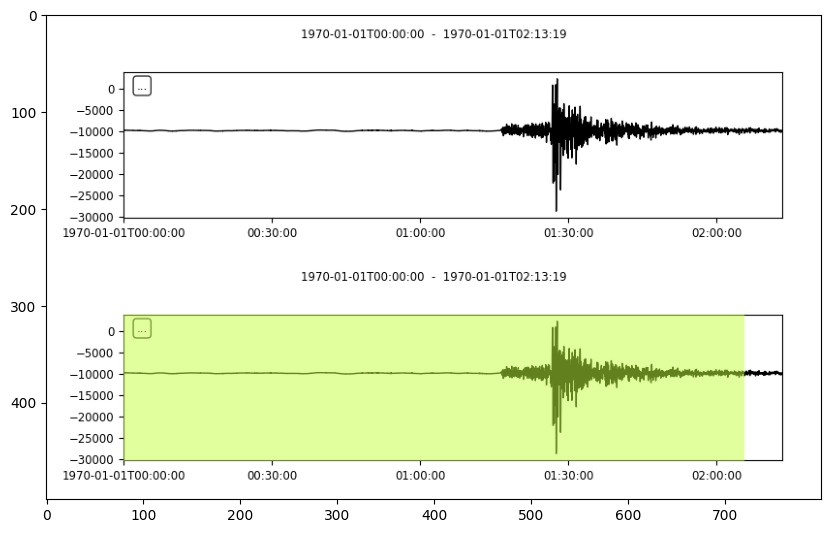

dataset8k_v4/class6/original/201910_24_4__SIMA.BHZ.KO_original.sac
1/1 [==============================] - 0s 20ms/step


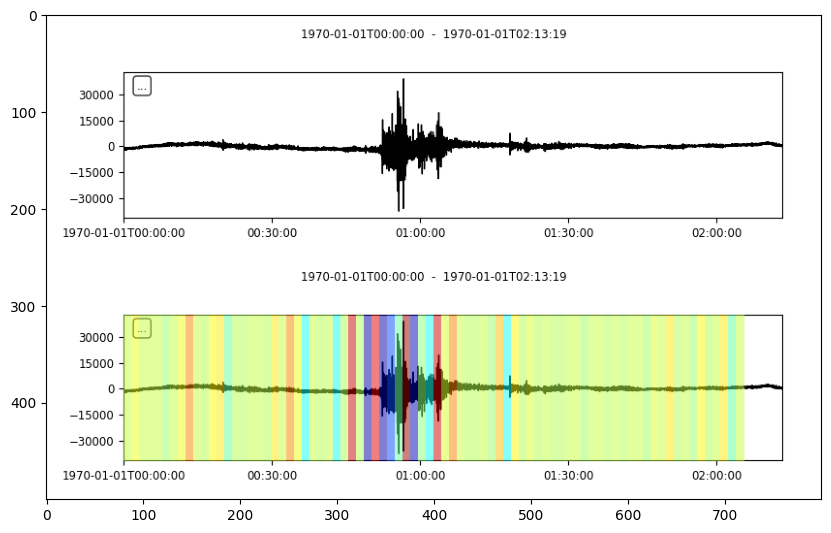

dataset8k_v4/class6/original/202201_0_97__MDNY2.BHZ.KO_original.sac
1/1 [==============================] - 0s 20ms/step


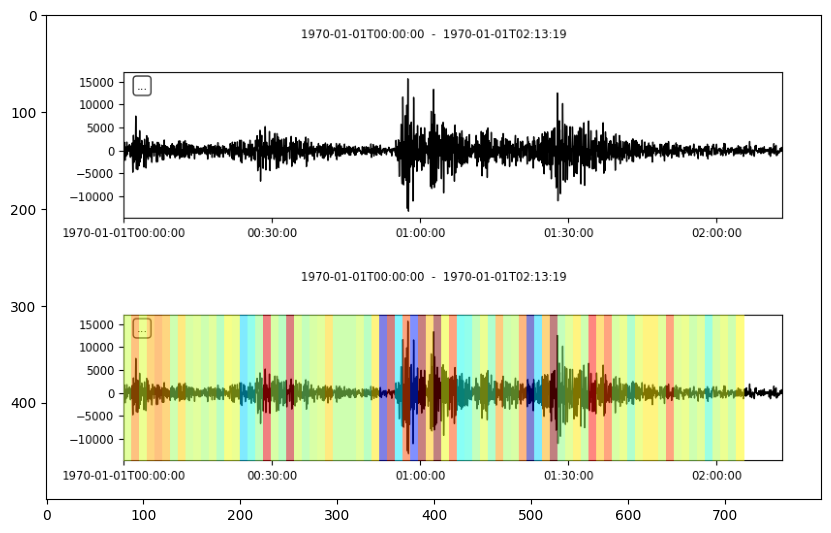

dataset8k_v4/class6/original/202008_8_2__SIMA.BHZ.KO_original.sac
1/1 [==============================] - 0s 21ms/step


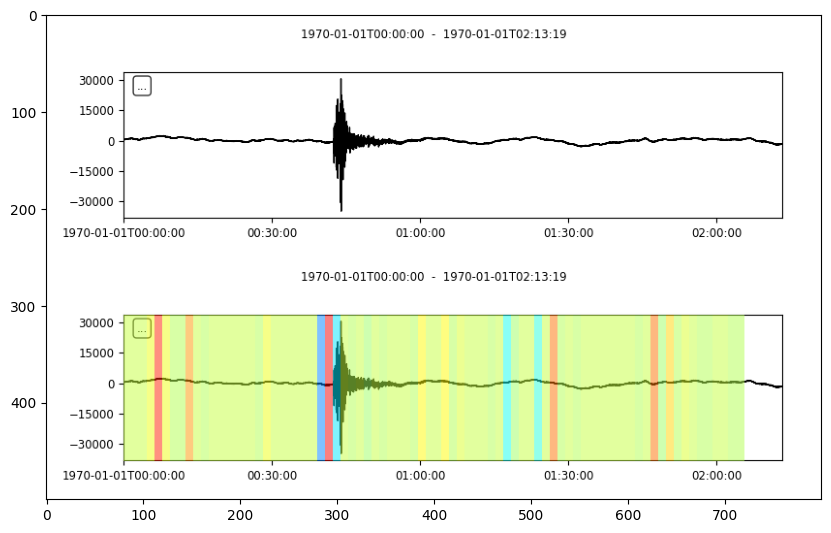

dataset8k_v4/class6/original/201902_1_84__GEDZ.BHZ.KO_original.sac
1/1 [==============================] - 0s 21ms/step


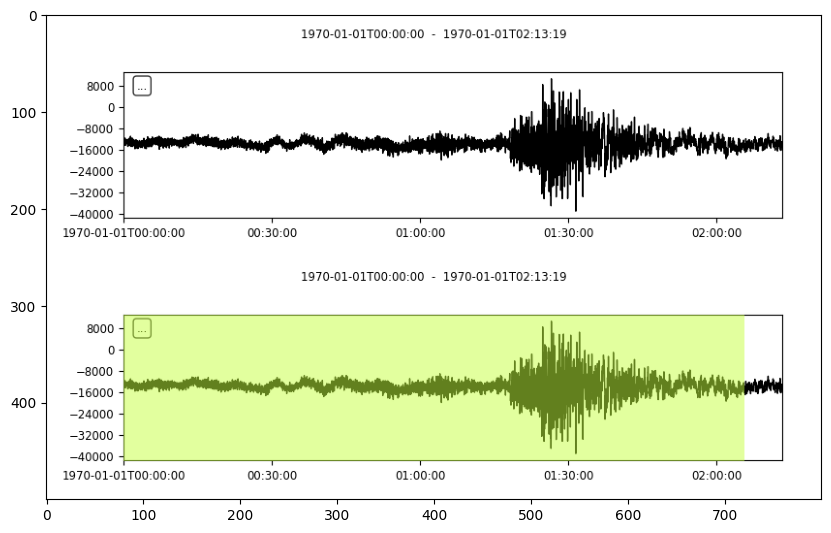

dataset8k_v4/class6/original/201910_18_29__CIFT.BHZ.KO_original.sac
1/1 [==============================] - 0s 20ms/step


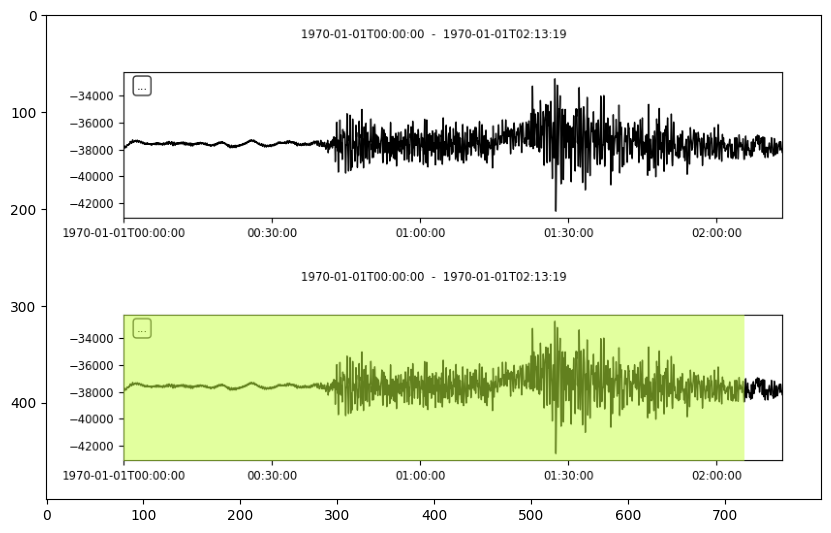

dataset8k_v4/class6/original/202010_19_0__SIMA.BHZ.KO_original.sac
1/1 [==============================] - 0s 21ms/step


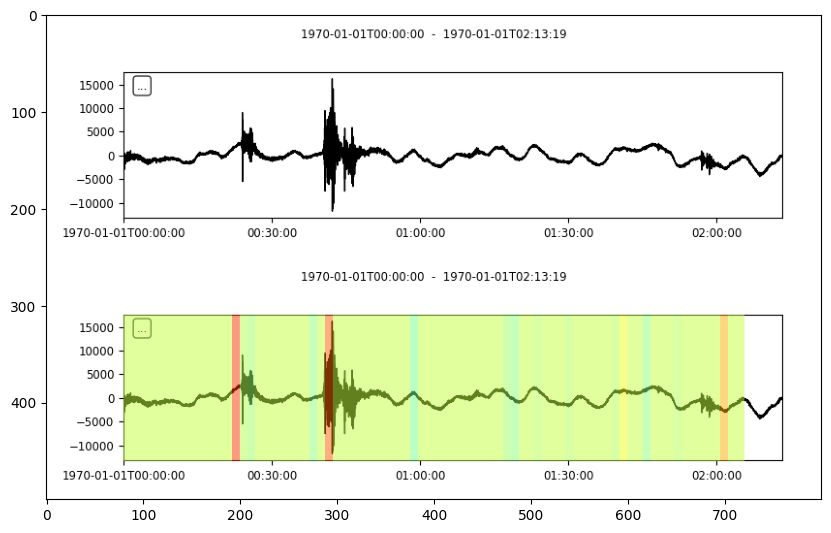

dataset8k_v4/class6/original/202102_0_0__SIMA.BHZ.KO_original.sac
1/1 [==============================] - 0s 22ms/step


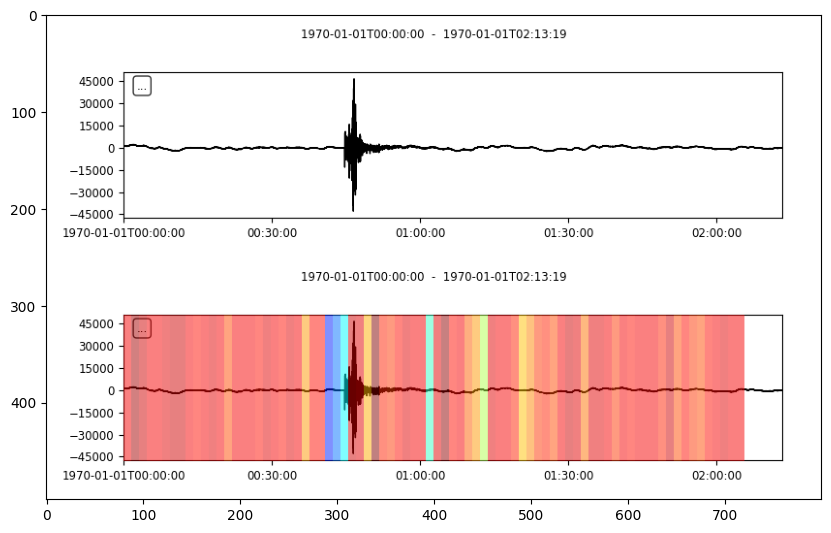

dataset8k_v4/class6/original/202010_36_91__TVSB.BHZ.KO_original.sac
1/1 [==============================] - 0s 21ms/step


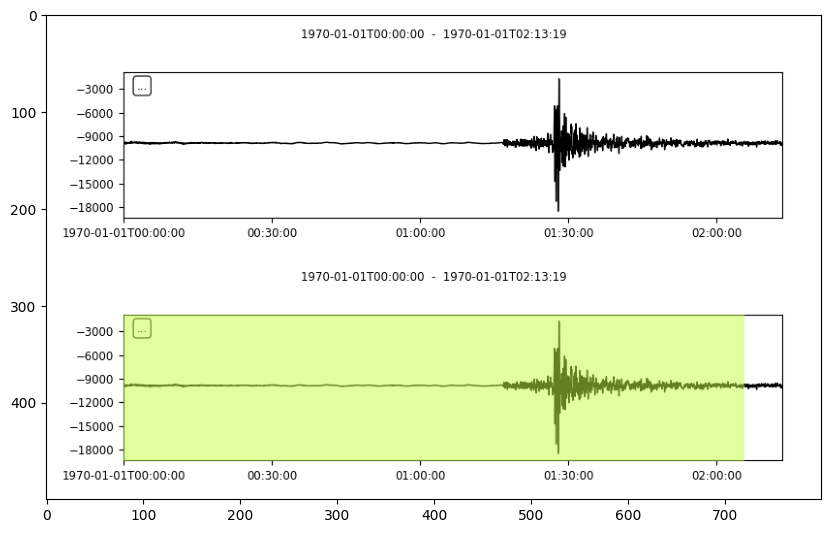

dataset8k_v4/class6/original/202004_11_39__GEDZ.BHZ.KO_original.sac
1/1 [==============================] - 0s 21ms/step


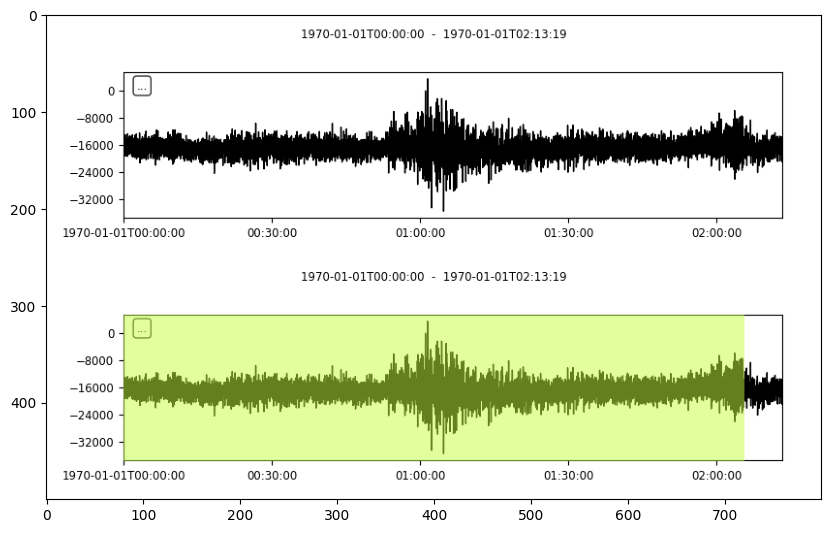

dataset8k_v4/class6/original/202103_9_38__KULA.BHZ.KO_original.sac
1/1 [==============================] - 0s 19ms/step


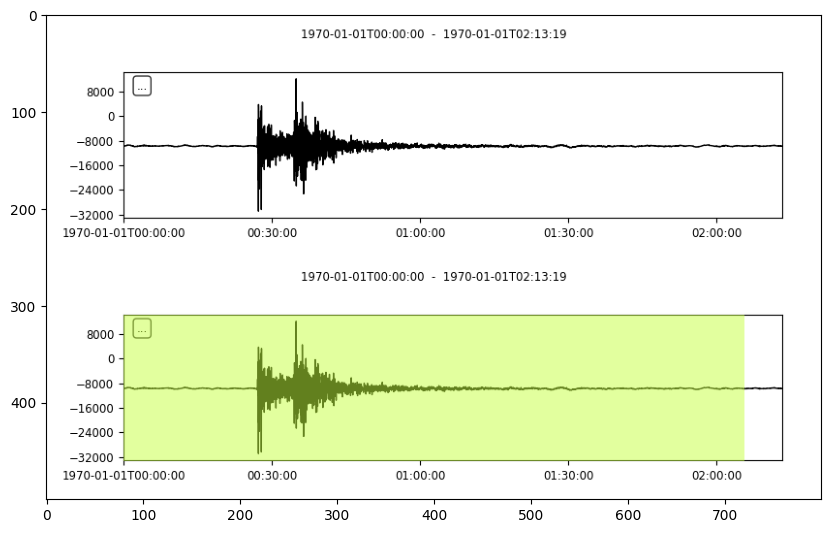

dataset8k_v4/class6/original/201904_8_0__SIMA.BHZ.KO_original.sac
1/1 [==============================] - 0s 20ms/step


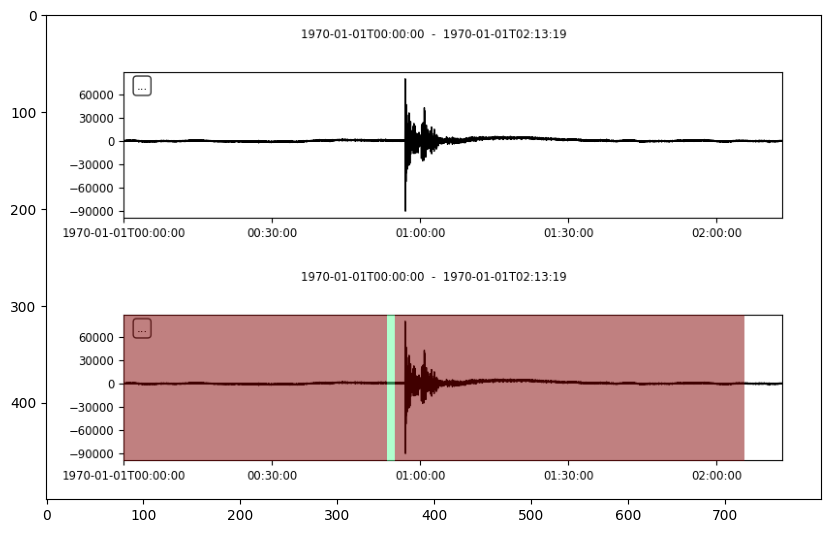

dataset8k_v4/class6/original/202103_9_125__TVSB.BHZ.KO_original.sac
1/1 [==============================] - 0s 19ms/step


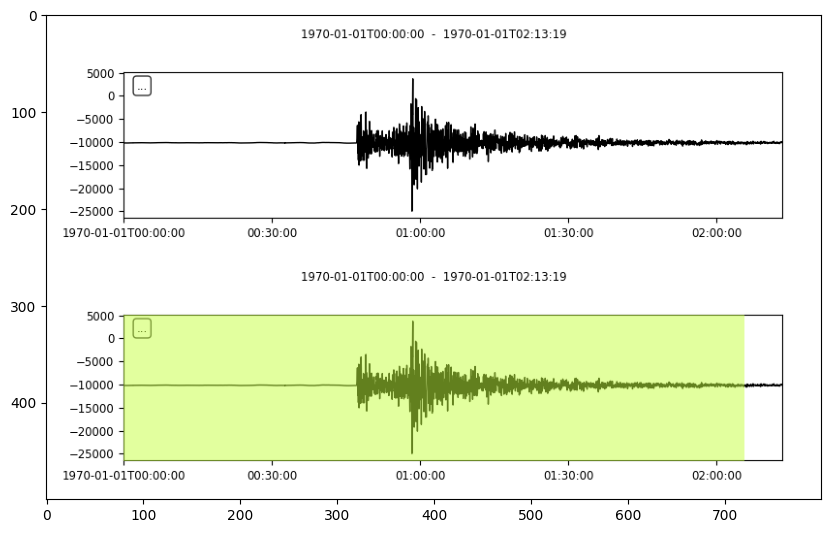

dataset8k_v4/class6/original/202204_10_15__KO.SIMA..BHZ.D.2022.111.120556.SAC_original.sac
1/1 [==============================] - 0s 21ms/step


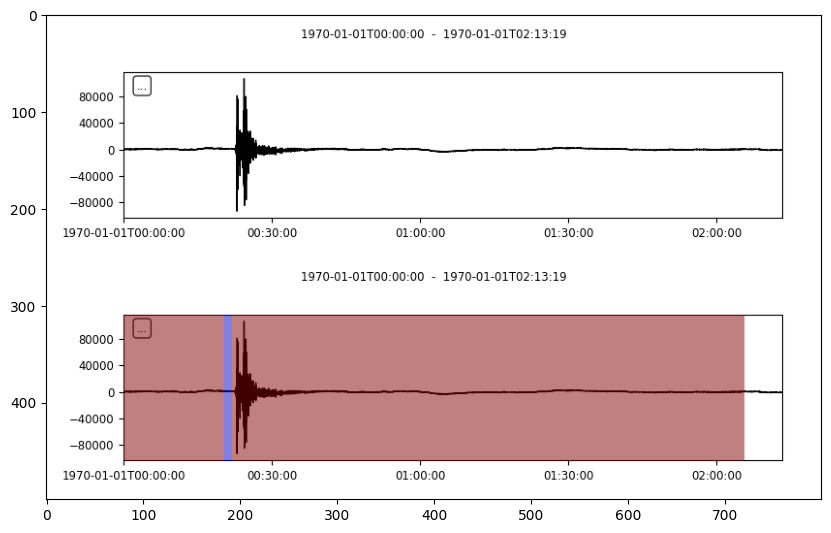

dataset8k_v4/class6/original/202008_10_20__YLV.BHZ.KO_original.sac
1/1 [==============================] - 0s 22ms/step


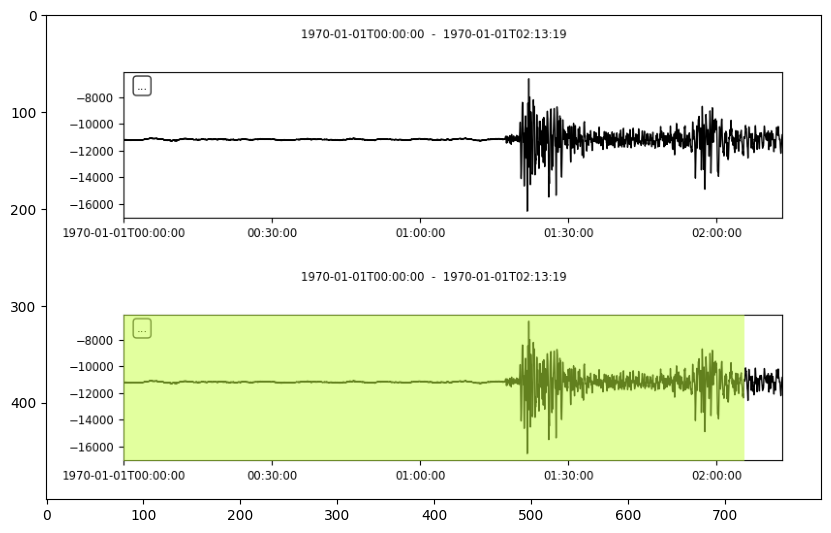

dataset8k_v4/class6/original/202010_25_1__SIMA.BHZ.KO_original.sac
1/1 [==============================] - 0s 19ms/step


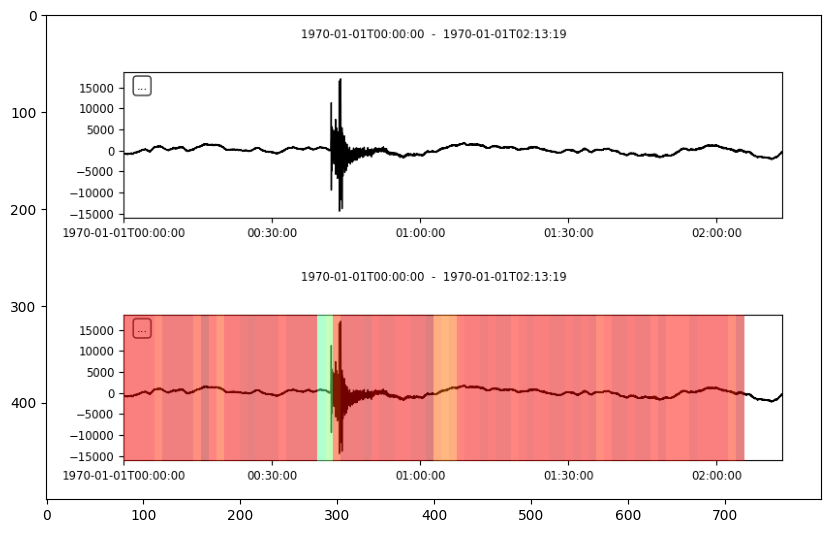

In [65]:
for trace_file in original_trace_file_list[117:]:
    path = os.path.join(dataset, original_class_folder, trace_file) 
    print(path)
    trace, pred, p_l = colorize(path, divide_number = 80)
    x = input("Press Enter to continue...")
    if x == 'q':
        break
    elif x == 's':
        # copy the file to another folder
        trace.write("./dataset/" + trace_file, format="SAC")
